In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from itertools import product
from sklearn.metrics import ConfusionMatrixDisplay


In [2]:
FS = 18

ds1_photons = pd.read_hdf('CaloChallenge_results_ds1_photons.hdf')
ds1_pions = pd.read_hdf('CaloChallenge_results_ds1_pions.hdf')
ds2 = pd.read_hdf('CaloChallenge_results_ds2.hdf')
ds3 = pd.read_hdf('CaloChallenge_results_ds3.hdf')


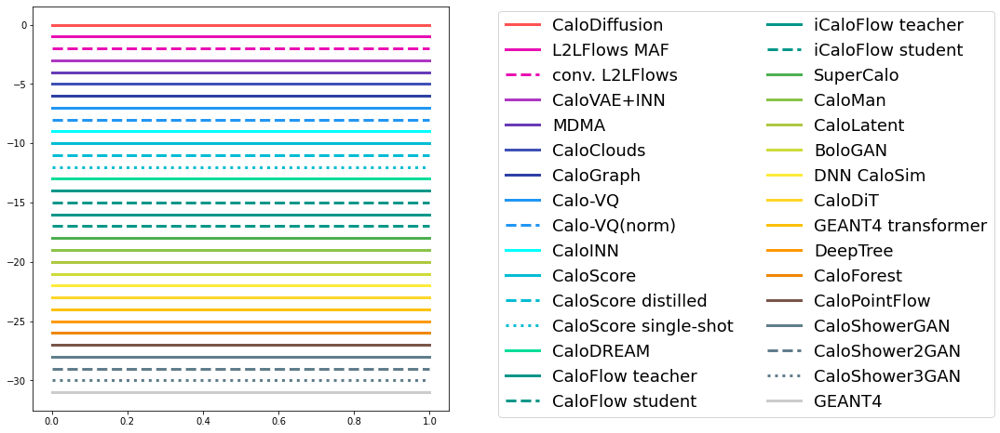

In [3]:
# style from evaluation_clip.ipynb

# create dictionary "submission id: submission name"
id_dict = pd.concat([ds1_photons[['submission name']], ds1_pions[['submission name']], ds2[['submission name']], ds3[['submission name']]], axis=0, sort=True, join='inner').to_dict()['submission name']

kwargs_dict = {
    1: {'color': '#FF5252', 'linestyle': 'solid'},
    2: {'color': '#E910B3', 'linestyle': 'solid'}, ##E91E63
    3: {'color': '#E910B3', 'linestyle': 'dashed'},
    27: {'color': '#ad38c1', 'linestyle': 'solid'}, #'#9C27B0'
    5: {'color': '#673AB7', 'linestyle': 'solid'},
    6: {'color': '#3F51B5', 'linestyle': 'solid'},
    29: {'color': '#2e40a4', 'linestyle': 'solid'},
    7: {'color': '#2196f3', 'linestyle': 'solid'},
    31: {'color': '#2196f3', 'linestyle': 'dashed'}, #2196f3
    4: {'color': '#00FFFF', 'linestyle': 'solid'}, #00FFFF
    8: {'color': '#00BCD4', 'linestyle': 'solid'},
    9: {'color': '#00BCD4', 'linestyle': 'dashed'},
    10: {'color': '#00BCD4', 'linestyle': 'dotted'},
    33: {'color': '#00DD99', 'linestyle': 'solid'},
    11: {'color': '#009688', 'linestyle': 'solid'},
    12: {'color': '#009688', 'linestyle': 'dashed'},
    13: {'color': '#009688', 'linestyle': 'solid'},
    14: {'color': '#009688', 'linestyle': 'dashed'},
    15: {'color': '#4CAF50', 'linestyle': 'solid'},
    16: {'color': '#8bc34a', 'linestyle': 'solid'},
    30: {'color': '#acc840', 'linestyle': 'solid'},
    17: {'color': '#CDDC39', 'linestyle': 'solid'},
    20: {'color': '#ffeb3b', 'linestyle': 'solid'},
    32: {'color': '#ffd629', 'linestyle': 'solid'},
    21: {'color': '#ffc107', 'linestyle': 'solid'},
    22: {'color': '#ff9800', 'linestyle': 'solid'},
    28: {'color': '#ee8700', 'linestyle': 'solid'},
    23: {'color': '#795548', 'linestyle': 'solid'},
    24: {'color': '#607d8b', 'linestyle': 'solid'},
    25: {'color': '#607d8b', 'linestyle': 'dashed'},
    26: {'color': '#607d8b', 'linestyle': 'dotted'},
    0: {'color': 'k', 'linestyle': 'solid', 'alpha': 0.2},
}

type_dict = {1: 'diffusion',
             2: 'flow',
             3: 'flow',
             4: 'flow',
             5: 'GAN',
             6: 'diffusion',
             7: 'VAE',
            31: 'VAE',
             8: 'diffusion',
             9: 'diffusion',
            10: 'diffusion',
            33: 'CFM',
            11: 'flow',
            12: 'flow',
            13: 'flow',
            14: 'flow',
            15: 'flow',
            16: 'VAE', 
            17: 'GAN',
            20: 'VAE',
            32: 'diffusion',
            21: 'VAE',
            22: 'GAN',
            23: 'flow',
            24: 'GAN',
            25: 'GAN',
            26: 'GAN',
            27: 'VAE',
            28: 'CFM',
            29: 'diffusion',
            30: 'VAE'}

running_id = 0
plt.figure(figsize=(8,8))
for entry in kwargs_dict:
    plt.plot([0,1], running_id*np.array([1., 1.]), label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    running_id -= 1.
plt.legend(bbox_to_anchor=(1.1, 1.01), fontsize=FS,ncol=2)
plt.show()


In [4]:
def get_min_max_from_dict(entry_dict, key):
    local_array = np.array(entry_dict[key])
    return local_array.min(axis=0), local_array.max(axis=0)

# layer correlations based on 2406.12898
def plot_corr(corr_arr, title, ticks, fname, ds1=True):
    plt.imshow(corr_arr,vmin=0.,vmax=1.)
    if ds1:
        for i in range(len(corr_arr)): 
            for j in range(len(corr_arr)): 
                plt.annotate("{:.2f}".format(corr_arr[i][j]), xy=(j, i), 
                         ha='center', va='center', color='white' if corr_arr[i][j]<0.8 else 'k', fontsize=12) 
    else:
        for idx, elem in enumerate(ticks):
            if idx % 4 != 0:
                ticks[idx] = ''

    plt.title(title, fontsize=FS+8)
    
    plt.xticks(range(len(ticks)), ticks, rotation=90, fontsize=12) 
    plt.yticks(range(len(ticks)), ticks[::-1], fontsize=12) 
    
    cbar = plt.colorbar(fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=12)
    plt.savefig(fname, dpi=300, bbox_inches='tight')
    plt.show() 

class ConfusionMatrixDisplayError(ConfusionMatrixDisplay):
    """Confusion Matrix visualization with errorbars."""

    def __init__(self, confusion_matrix, *, display_labels=None, errors=None):
        self.confusion_matrix = confusion_matrix
        self.display_labels = display_labels
        self.errors = errors
        if self.errors is not None:
            assert self.confusion_matrix.shape == self.errors.shape

    def plot(
        self,
        *,
        include_values=True,
        cmap="viridis",
        xticks_rotation="horizontal",
        values_format=None,
        ax=None,
        colorbar=True,
        im_kw=None,
        text_kw=None,
        include_errors=False,
    ):
        """Plot visualization.

        Parameters
        ----------
        include_values : bool, default=True
            Includes values in confusion matrix.

        cmap : str or matplotlib Colormap, default='viridis'
            Colormap recognized by matplotlib.

        xticks_rotation : {'vertical', 'horizontal'} or float, \
                         default='horizontal'
            Rotation of xtick labels.

        values_format : str, default=None
            Format specification for values in confusion matrix. If `None`,
            the format specification is 'd' or '.2g' whichever is shorter.

        ax : matplotlib axes, default=None
            Axes object to plot on. If `None`, a new figure and axes is
            created.

        colorbar : bool, default=True
            Whether or not to add a colorbar to the plot.

        im_kw : dict, default=None
            Dict with keywords passed to `matplotlib.pyplot.imshow` call.

        text_kw : dict, default=None
            Dict with keywords passed to `matplotlib.pyplot.text` call.

            .. versionadded:: 1.2

        Returns
        -------
        display : :class:`~sklearn.metrics.ConfusionMatrixDisplay`
            Returns a :class:`~sklearn.metrics.ConfusionMatrixDisplay` instance
            that contains all the information to plot the confusion matrix.
        """
        #check_matplotlib_support("ConfusionMatrixDisplay.plot")
        import matplotlib.pyplot as plt

        if ax is None:
            fig, ax = plt.subplots()
        else:
            fig = ax.figure

        cm = self.confusion_matrix
        n_classes = cm.shape[0]

        default_im_kw = dict(interpolation="nearest", cmap=cmap)
        im_kw = im_kw or {}
        im_kw = {**default_im_kw, **im_kw}
        text_kw = text_kw or {}

        self.im_ = ax.imshow(cm, **im_kw)
        self.text_ = None
        cmap_min, cmap_max = self.im_.cmap(0), self.im_.cmap(1.0)

        if include_values:
            self.text_ = np.empty_like(cm, dtype=object)

            # print text with appropriate color depending on background
            thresh = (cm.max() + cm.min()) / 2.0

            for i, j in product(range(n_classes), range(n_classes)):
                color = cmap_max if cm[i, j] < thresh else cmap_min

                if values_format is None:
                    text_cm = format(cm[i, j], ".2g")
                    if self.errors is not None:
                        text_cm_err = format(self.errors[i, j], ".2g")
                    if cm.dtype.kind != "f":
                        text_d = format(cm[i, j], "d")
                        err_d = format(self.errors[i, j], "d")
                        if len(text_d) < len(text_cm):
                            text_cm = text_d
                        if len(err_d) < len(text_cm_err):
                            text_cm_err = err_d
                else:
                    text_cm = format(cm[i, j], values_format)
                    text_cm_err = format(self.errors[i, j], values_format)

                default_text_kwargs = dict(ha="center", va="center", color=color)
                text_kwargs = {**default_text_kwargs, **text_kw}

                if include_errors:
                    #self.text_[i, j] = ax.text(j, i, text_cm+"\n"+r" $\pm$ "+text_cm_err, **text_kwargs)
                    short_text_cm_err = ""
                    leading = True
                    for idx, letter in enumerate(text_cm_err.replace('.', '')):
                        if letter == '0' and leading:
                            pass
                        else:
                            short_text_cm_err += letter
                            leading = False
                    #print(f"string {text_cm_err} was changed to {short_text_cm_err}")
                    if short_text_cm_err == '':
                        short_text_cm_err = '0'
                    self.text_[i, j] = ax.text(j, i, text_cm+"("+short_text_cm_err+")", **text_kwargs)
                else:
                    self.text_[i, j] = ax.text(j, i, text_cm, **text_kwargs)

        if self.display_labels is None:
            display_labels = np.arange(n_classes)
        else:
            display_labels = self.display_labels
        if colorbar:
            fig.colorbar(self.im_, ax=ax)
        ax.set(
            xticks=np.arange(n_classes),
            yticks=np.arange(n_classes),
            xticklabels=display_labels,
            yticklabels=display_labels,
            ylabel="True label",
            xlabel="Predicted label",
        )

        ax.set_ylim((n_classes - 0.5, -0.5))
        plt.setp(ax.get_xticklabels(), rotation=xticks_rotation, fontsize=16)
        plt.setp(ax.get_yticklabels(), fontsize=16)
        plt.setp(ax.xaxis.get_label(), fontsize=16)
        plt.setp(ax.yaxis.get_label(), fontsize=16)

        self.figure_ = fig
        self.ax_ = ax
        return self
    
def plot_with_errors(location, error, label, kwargs):
    if not np.isnan(location).any():
        plt.plot(np.repeat(location[0]-error, 2), [location[1]-0.25, location[1]+0.25], marker=None, label=label, linewidth=3., **kwargs)
        plt.plot(np.repeat(location[0]+error, 2), [location[1]-0.25, location[1]+0.25], marker=None, label='_please_dont', linewidth=3., **kwargs)
        plt.plot([location[0]-error, location[0]+error], [location[1], location[1]], marker=None, label='_please_dont', linewidth=3., **kwargs)
        plt.plot(np.repeat(location[0], 2), [location[1]-0.05, location[1]+0.05], marker=None, label='_please_dont', linewidth=3., **kwargs)
    


## Single Metric Plots
First goal would be to reproduce the already existing plots in the draft and then move all plot creation here for future use. Second step would be creating new plots for cases in which now we have only tables. 

### ds1 photons

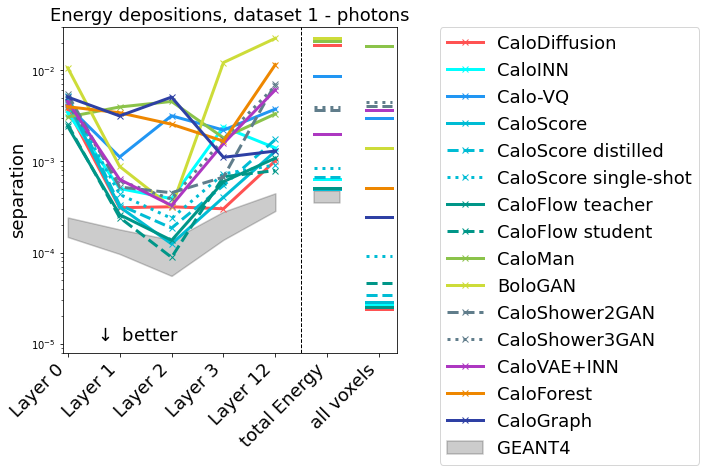

In [5]:
plt.figure(figsize=(6,6), facecolor='white')
x_scan = np.arange(7)

for run_id, entry in enumerate(ds1_photons['sep E layer'].to_dict()):
    if entry == 0:
        continue
    plt.plot(x_scan[:5], ds1_photons['sep E layer'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    plt.plot([x_scan[5]-0.25, x_scan[5]+0.25], np.repeat([ds1_photons['sep E total'].to_dict()[entry]], 2), marker=None, label="_please_dont", linewidth=3., **kwargs_dict[entry])
    plt.plot([x_scan[6]-0.25, x_scan[6]+0.25], np.repeat([ds1_photons['sep cell'].to_dict()[entry]], 2), marker=None, label="_please_dont", linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds1_photons['sep E layer'].to_dict(), 0)
plt.fill_between(x_scan[:5], geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])
geant_min, geant_max = get_min_max_from_dict(ds1_photons['sep E total'].to_dict(), 0)
plt.fill_between([x_scan[5]-0.25, x_scan[5]+0.25], np.repeat([geant_min], 2), np.repeat([geant_max], 2), label="_please_dont", linewidth=1.5, **kwargs_dict[0])
geant_min, geant_max = get_min_max_from_dict(ds1_photons['sep cell'].to_dict(), 0)
plt.fill_between([x_scan[6]-0.25, x_scan[6]+0.25], np.repeat([geant_min], 2), np.repeat([geant_max], 2), label="_please_dont", linewidth=1.5, **kwargs_dict[0])
    
    
plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.35])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.ylim(8e-6, 3e-2)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels(['Layer 0', 'Layer 1', 'Layer 2', 'Layer 3', 'Layer 12', 'total Energy', 'all voxels'], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS)
plt.title(f"Energy depositions, dataset 1 - photons", fontsize=FS)
plt.axvline(x = 4.5, color = 'k', linestyle='dashed', linewidth=1)
plt.text(0.5, 1e-5, r"$\downarrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/sep/ds1-photons_depositions.pdf', dpi=300, bbox_inches='tight')
plt.show()


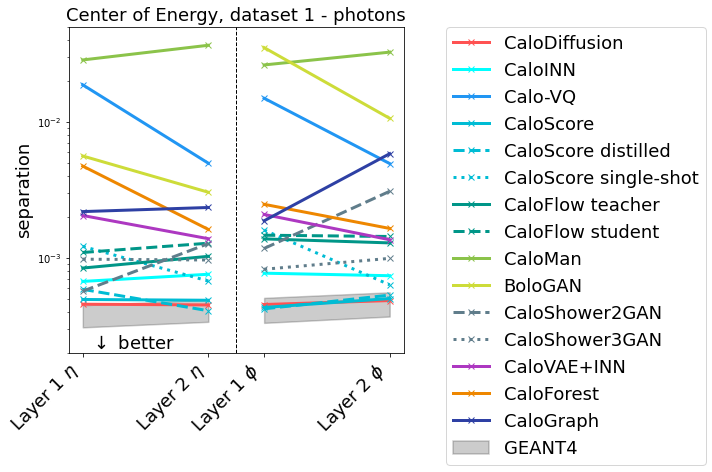

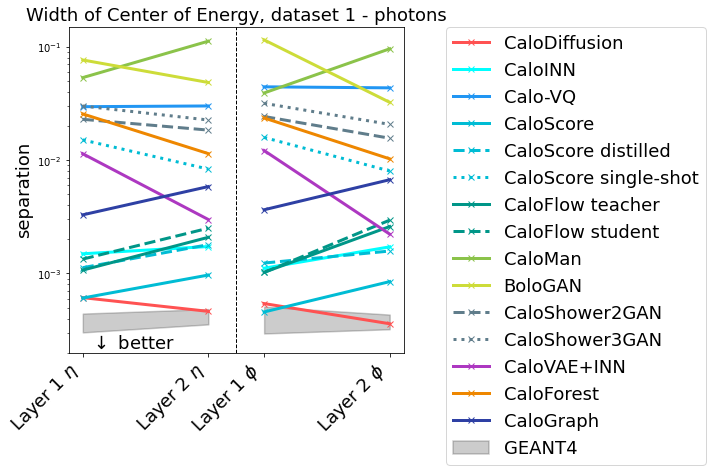

In [6]:
# EC and its width

plt.figure(figsize=(6,6), facecolor='white')
x_scan = np.array([0., 0.9, 1.3, 2.2])

for run_id, entry in enumerate(ds1_photons['sep EC eta'].to_dict()):
    if entry == 0:
        continue
    plt.plot(x_scan[:2], ds1_photons['sep EC eta'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    plt.plot(x_scan[2:], ds1_photons['sep EC phi'].to_dict()[entry], marker='x', label="_please_dont", linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds1_photons['sep EC eta'].to_dict(), 0)
plt.fill_between(x_scan[:2], geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])
geant_min, geant_max = get_min_max_from_dict(ds1_photons['sep EC phi'].to_dict(), 0)
plt.fill_between(x_scan[2:], geant_min, geant_max, label="_please_dont", linewidth=1.5, **kwargs_dict[0])    

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([r'Layer 1 $\eta$', r'Layer 2 $\eta$', r'Layer 1 $\phi$', r'Layer 2 $\phi$'], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS)
plt.title(f"Center of Energy, dataset 1 - photons", fontsize=FS)
plt.axvline(x = 1.1, color = 'k', linestyle='dashed', linewidth=1)
plt.ylim(2e-4,5e-2)
plt.text(0.05, 2e-4, r"$\downarrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/sep/ds1-photons_CE.pdf', dpi=300, bbox_inches='tight')
plt.show()


plt.figure(figsize=(6,6), facecolor='white')
x_scan = np.array([0., 0.9, 1.3, 2.2])

for run_id, entry in enumerate(ds1_photons['sep EC eta std'].to_dict()):
    if entry == 0:
        continue
    plt.plot(x_scan[:2], ds1_photons['sep EC eta std'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    plt.plot(x_scan[2:], ds1_photons['sep EC phi std'].to_dict()[entry], marker='x', label="_please_dont", linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds1_photons['sep EC eta std'].to_dict(), 0)
plt.fill_between(x_scan[:2], geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])
geant_min, geant_max = get_min_max_from_dict(ds1_photons['sep EC phi std'].to_dict(), 0)
plt.fill_between(x_scan[2:], geant_min, geant_max, label="_please_dont", linewidth=1.5, **kwargs_dict[0])


plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([r'Layer 1 $\eta$', r'Layer 2 $\eta$', r'Layer 1 $\phi$', r'Layer 2 $\phi$'], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS)
plt.title(f"Width of Center of Energy, dataset 1 - photons", fontsize=FS)
plt.axvline(x = 1.1, color = 'k', linestyle='dashed', linewidth=1)
plt.ylim(2e-4,1.5e-1)
plt.text(0.05, 2e-4, r"$\downarrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/sep/ds1-photons_width_CE.pdf', dpi=300, bbox_inches='tight')
plt.show()
          


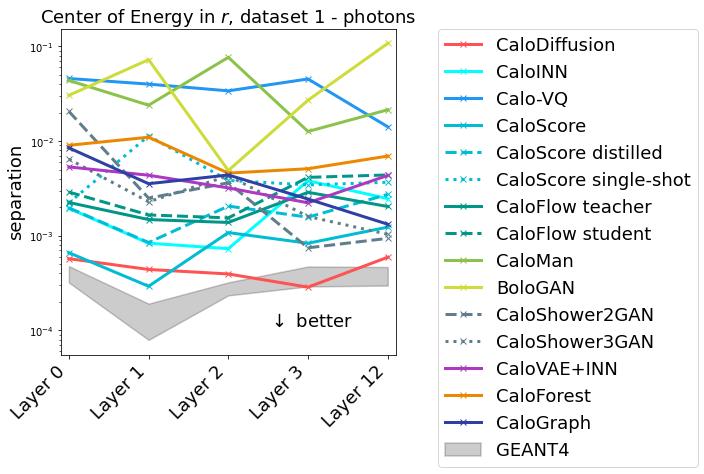

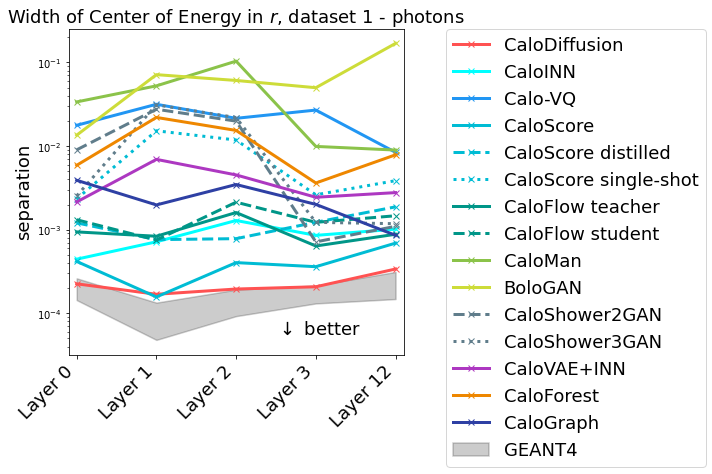

In [7]:
# EC and its width in r

plt.figure(figsize=(6,6), facecolor='white')
x_scan = np.arange(5)

for run_id, entry in enumerate(ds1_photons['sep EC r'].to_dict()):
    if entry == 0:
        continue
    plt.plot(x_scan, ds1_photons['sep EC r'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds1_photons['sep EC r'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels(['Layer 0', 'Layer 1', 'Layer 2', 'Layer 3', 'Layer 12'], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS)
plt.title(f"Center of Energy in $r$, dataset 1 - photons", fontsize=FS)
plt.text(2.5, 1e-4, r"$\downarrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/sep/ds1-photons_CE_r.pdf', dpi=300, bbox_inches='tight')
plt.show()
          
plt.figure(figsize=(6,6), facecolor='white')
x_scan = np.arange(5)

for run_id, entry in enumerate(ds1_photons['sep EC r std'].to_dict()):
    if entry == 0:
        continue
    plt.plot(x_scan, ds1_photons['sep EC r std'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
        
geant_min, geant_max = get_min_max_from_dict(ds1_photons['sep EC r std'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels(['Layer 0', 'Layer 1', 'Layer 2', 'Layer 3', 'Layer 12'], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS)
plt.title(f"Width of Center of Energy in $r$, dataset 1 - photons", fontsize=FS)
plt.text(2.5, 5e-5, r"$\downarrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/sep/ds1-photons_width_CE_r.pdf', dpi=300, bbox_inches='tight')
plt.show()
          


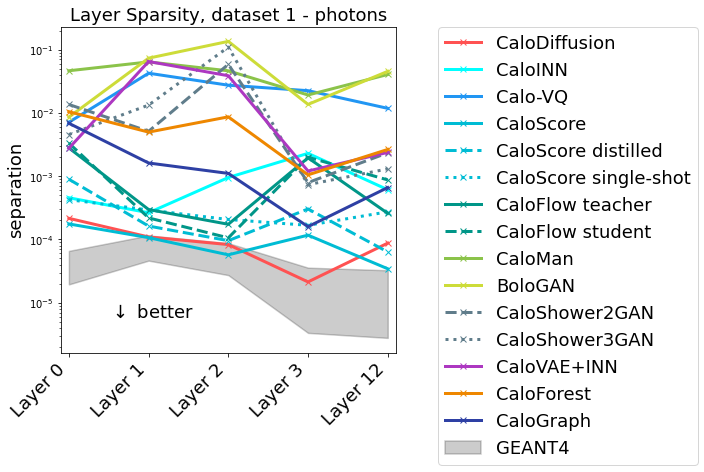

In [8]:
# layer sparsities

plt.figure(figsize=(6,6), facecolor='white')
x_scan = np.arange(5)

for run_id, entry in enumerate(ds1_photons['sep sparsity'].to_dict()):
    if entry == 0:
        continue
    plt.plot(x_scan, ds1_photons['sep sparsity'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds1_photons['sep sparsity'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels(['Layer 0', 'Layer 1', 'Layer 2', 'Layer 3', 'Layer 12'], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS)
plt.title(f"Layer Sparsity, dataset 1 - photons", fontsize=FS)
plt.text(0.5, 5e-6, r"$\downarrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/sep/ds1-photons_sparsity.pdf', dpi=300, bbox_inches='tight')
plt.show()


working on submission 0
[[0.1383656  0.23416234 0.5689673  0.84846671 1.        ]
 [0.18698857 0.3557654  0.80479378 1.         0.84846671]
 [0.41226255 0.71179891 1.         0.80479378 0.5689673 ]
 [0.76328319 1.         0.71179891 0.3557654  0.23416234]
 [1.         0.76328319 0.41226255 0.18698857 0.1383656 ]]


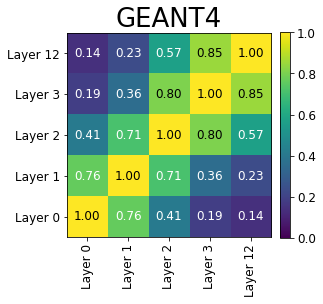

working on submission 1
[[0.13116623 0.25510291 0.61916969 0.83274015 1.        ]
 [0.18386365 0.37228037 0.83246403 1.         0.83274015]
 [0.39493413 0.70620102 1.         0.83246403 0.61916969]
 [0.75593562 1.         0.70620102 0.37228037 0.25510291]
 [1.         0.75593562 0.39493413 0.18386365 0.13116623]]


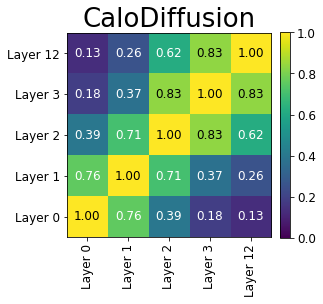

working on submission 4
[[0.12320013 0.27904319 0.72693451 0.94670568 1.        ]
 [0.15572128 0.35149096 0.83782842 1.         0.94670568]
 [0.34424483 0.68554015 1.         0.83782842 0.72693451]
 [0.67384387 1.         0.68554015 0.35149096 0.27904319]
 [1.         0.67384387 0.34424483 0.15572128 0.12320013]]


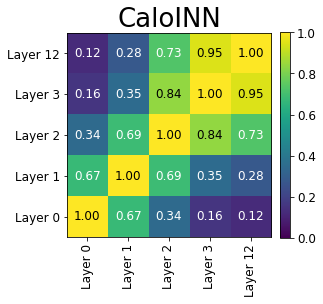

working on submission 7
[[0.23284209 0.38598163 0.72412351 0.88735141 1.        ]
 [0.25482228 0.46199884 0.86112036 1.         0.88735141]
 [0.39896849 0.73565469 1.         0.86112036 0.72412351]
 [0.70963495 1.         0.73565469 0.46199884 0.38598163]
 [1.         0.70963495 0.39896849 0.25482228 0.23284209]]


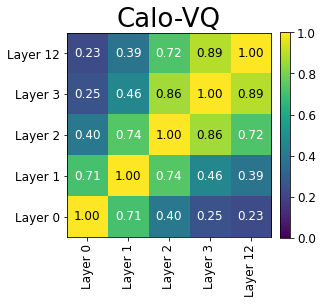

working on submission 8
[[0.12132134 0.20353605 0.52475167 0.78712305 1.        ]
 [0.17856188 0.34344962 0.79402309 1.         0.78712305]
 [0.40008923 0.70104737 1.         0.79402309 0.52475167]
 [0.75672837 1.         0.70104737 0.34344962 0.20353605]
 [1.         0.75672837 0.40008923 0.17856188 0.12132134]]


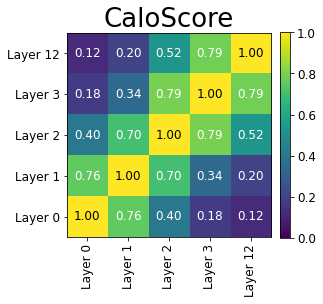

working on submission 9
[[0.10471212 0.17327518 0.43387739 0.64317647 1.        ]
 [0.18067217 0.34706069 0.79112944 1.         0.64317647]
 [0.39870704 0.69995552 1.         0.79112944 0.43387739]
 [0.75377604 1.         0.69995552 0.34706069 0.17327518]
 [1.         0.75377604 0.39870704 0.18067217 0.10471212]]


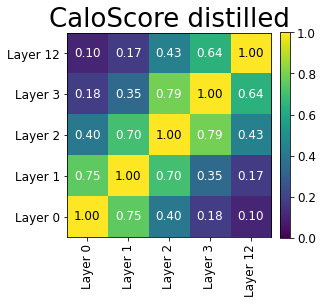

working on submission 10
[[0.10976994 0.19046657 0.47035673 0.69735007 1.        ]
 [0.17660433 0.33410828 0.78433593 1.         0.69735007]
 [0.40133676 0.6972452  1.         0.78433593 0.47035673]
 [0.75680127 1.         0.6972452  0.33410828 0.19046657]
 [1.         0.75680127 0.40133676 0.17660433 0.10976994]]


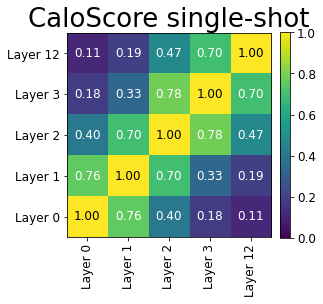

working on submission 11
[[0.14508892 0.27581936 0.64982361 0.8842569  1.        ]
 [0.19808888 0.38193978 0.83089676 1.         0.8842569 ]
 [0.40861714 0.71312152 1.         0.83089676 0.64982361]
 [0.75801216 1.         0.71312152 0.38193978 0.27581936]
 [1.         0.75801216 0.40861714 0.19808888 0.14508892]]


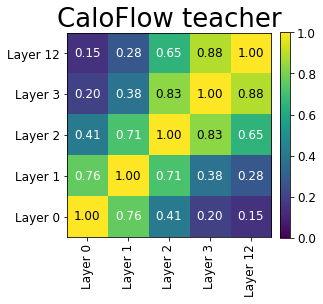

working on submission 12
[[0.12787672 0.24742225 0.60978535 0.86319447 1.        ]
 [0.18215753 0.3615815  0.81314221 1.         0.86319447]
 [0.40106364 0.70819474 1.         0.81314221 0.60978535]
 [0.7575782  1.         0.70819474 0.3615815  0.24742225]
 [1.         0.7575782  0.40106364 0.18215753 0.12787672]]


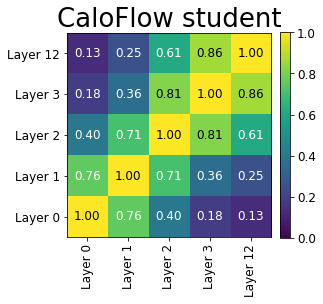

working on submission 16
[[0.0862872  0.35333466 0.14172874 0.34222059 1.        ]
 [0.0353083  0.31981229 0.72956556 1.         0.34222059]
 [0.0022107  0.5894192  1.         0.72956556 0.14172874]
 [0.04131198 1.         0.5894192  0.31981229 0.35333466]
 [1.         0.04131198 0.0022107  0.0353083  0.0862872 ]]


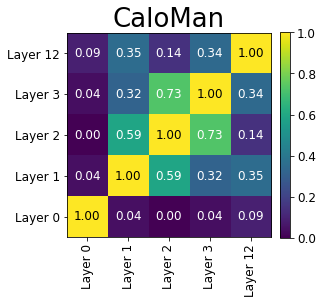

working on submission 17
[[0.38760968 0.36520528 0.58880346 0.8301312  1.        ]
 [0.384791   0.49101089 0.82789254 1.         0.8301312 ]
 [0.48676016 0.77809711 1.         0.82789254 0.58880346]
 [0.69275888 1.         0.77809711 0.49101089 0.36520528]
 [1.         0.69275888 0.48676016 0.384791   0.38760968]]


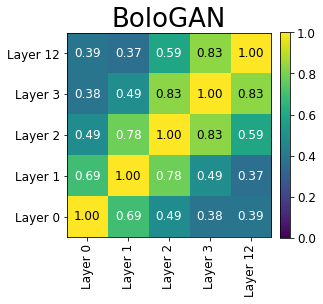

working on submission 25
[[0.15903784 0.20723912 0.48515714 0.6069433  1.        ]
 [0.14664742 0.3603925  0.82373347 1.         0.6069433 ]
 [0.3597469  0.6941662  1.         0.82373347 0.48515714]
 [0.72251407 1.         0.6941662  0.3603925  0.20723912]
 [1.         0.72251407 0.3597469  0.14664742 0.15903784]]


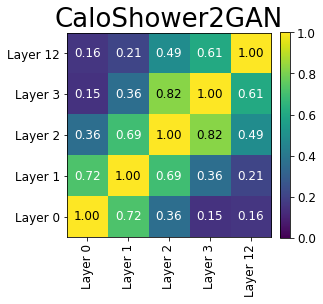

working on submission 26
[[0.1287456  0.26502544 0.65904783 0.86177615 1.        ]
 [0.13257584 0.3409173  0.79856428 1.         0.86177615]
 [0.32537562 0.70167748 1.         0.79856428 0.65904783]
 [0.65169618 1.         0.70167748 0.3409173  0.26502544]
 [1.         0.65169618 0.32537562 0.13257584 0.1287456 ]]


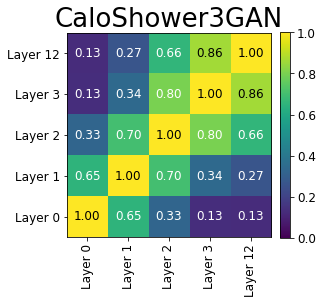

working on submission 27
[[0.15762601 0.28402546 0.6810637  0.95731546 1.        ]
 [0.20292978 0.36493148 0.79264655 1.         0.95731546]
 [0.42867546 0.71848137 1.         0.79264655 0.6810637 ]
 [0.76422663 1.         0.71848137 0.36493148 0.28402546]
 [1.         0.76422663 0.42867546 0.20292978 0.15762601]]


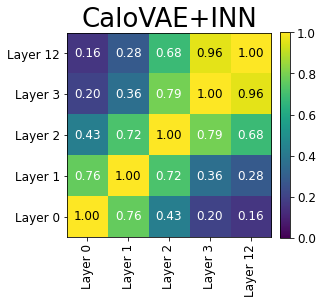

working on submission 28
[[0.26053128 0.50300638 0.87072119 0.96487749 1.        ]
 [0.29073391 0.55748357 0.92937549 1.         0.96487749]
 [0.43123419 0.76192284 1.         0.92937549 0.87072119]
 [0.75175137 1.         0.76192284 0.55748357 0.50300638]
 [1.         0.75175137 0.43123419 0.29073391 0.26053128]]


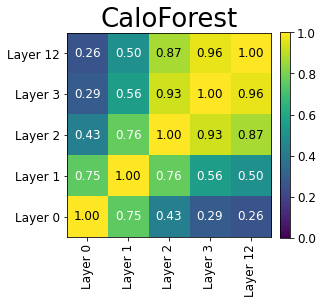

working on submission 29
[[0.20373712 0.32015372 0.65709963 0.88754804 1.        ]
 [0.26647981 0.42617627 0.81488481 1.         0.88754804]
 [0.50094466 0.76272559 1.         0.81488481 0.65709963]
 [0.8030133  1.         0.76272559 0.42617627 0.32015372]
 [1.         0.8030133  0.50094466 0.26647981 0.20373712]]


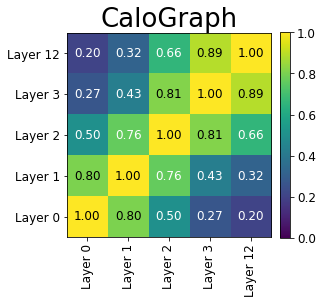

In [9]:
# layer correlations based on 2406.12898


for iter_id, submission_id in enumerate(ds1_photons['PCC Layer Energies'].to_dict()):
    plt.figure(figsize=(4,4), facecolor='white')
    print(f"working on submission {submission_id}")
    labels = ['Layer 0', 'Layer 1', 'Layer 2', 'Layer 3', 'Layer 12']
    E_corr = np.array(ds1_photons['PCC Layer Energies'].to_dict()[submission_id]).astype(float)
    print(E_corr)
    plot_corr(E_corr, id_dict[submission_id], labels, f'results_fig/corr/ds1-photons_{submission_id}.pdf')


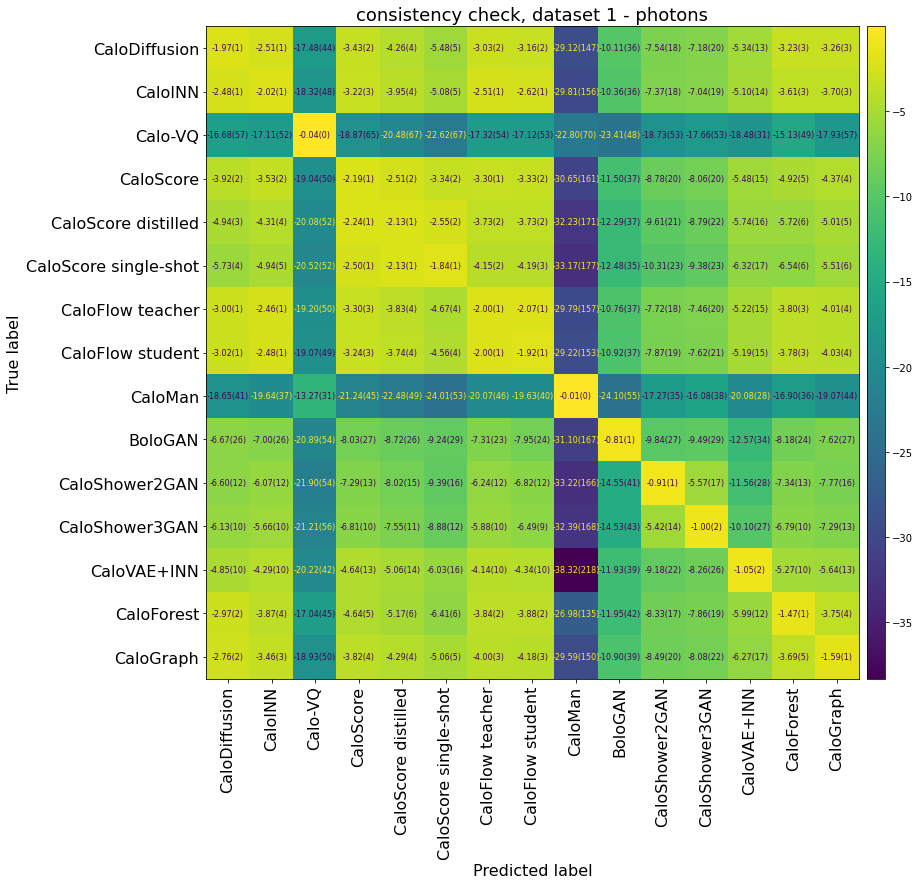

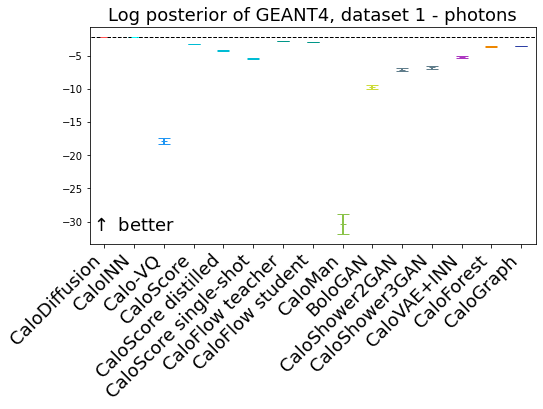

In [10]:
# multiclass classifier

log_post_by_model = []
log_post_by_model_std = []
label = []
for entry in ds1_photons['multi cls CC'].to_dict():
    if entry == 0:
        continue
    log_post_by_model.append(ds1_photons['multi cls CC'].to_dict()[entry])
    log_post_by_model_std.append(ds1_photons['multi cls CC std'].to_dict()[entry])
    label.append(id_dict[entry])

log_post_by_model = np.array(log_post_by_model).astype(float)    
log_post_by_model_std = np.array(log_post_by_model_std).astype(float)    
    
plt.figure(figsize=(12,12))
disp = ConfusionMatrixDisplayError(confusion_matrix=log_post_by_model, 
                              display_labels=label, errors=log_post_by_model_std)
disp.plot(xticks_rotation='vertical', ax=plt.gca(), colorbar=False, values_format=".2f", include_errors=True, text_kw={'fontsize': 8})
plt.title(f"consistency check, dataset 1 - photons", fontsize=FS)
cax = plt.gcf().add_axes([plt.gca().get_position().x1+0.01,plt.gca().get_position().y0,0.02,plt.gca().get_position().height])
plt.colorbar(disp.im_,  cax=cax)
plt.savefig(f'results_fig/cls/ds1-photons_confusion.pdf', dpi=300, bbox_inches='tight')
plt.show()

log_truth = []
log_truth_std = []
color = []
for entry in ds1_photons['multi cls'].to_dict():
    if entry == 0:
        continue
    log_truth.append(ds1_photons['multi cls'].to_dict()[entry])
    log_truth_std.append(ds1_photons['multi cls std'].to_dict()[entry])
    color.append(kwargs_dict[entry]['color'])

log_truth = np.array(log_truth).astype(float)    
log_truth_std = np.array(log_truth_std).astype(float)    

plt.figure(figsize=(8,4))
for x, y, yerr, col in zip(np.arange(len(label)), log_truth, log_truth_std, color):
    plt.errorbar(x, y, yerr=yerr, elinewidth=2, marker='_', capsize=6, linestyle='None', color=col)
#plt.errorbar(np.arange(len(label)), log_truth, yerr=log_truth_std, elinewidth=2, marker='_', capsize=6, linestyle='None')
plt.hlines(np.max(log_truth), xmin=-1, xmax=len(label), color = 'k', linestyle='dashed', linewidth=1)
plt.xlim(-0.5, len(label)-0.5)
plt.title(f"Log posterior of GEANT4, dataset 1 - photons", fontsize=FS)
plt.gca().set_xticks(np.arange(len(label)))
plt.gca().set_xticklabels(label, rotation=45, ha='right', fontsize=FS)
plt.text(-0.5, -32., r"$\uparrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/cls/ds1-photons_truth.pdf', dpi=300, bbox_inches='tight')
plt.show()


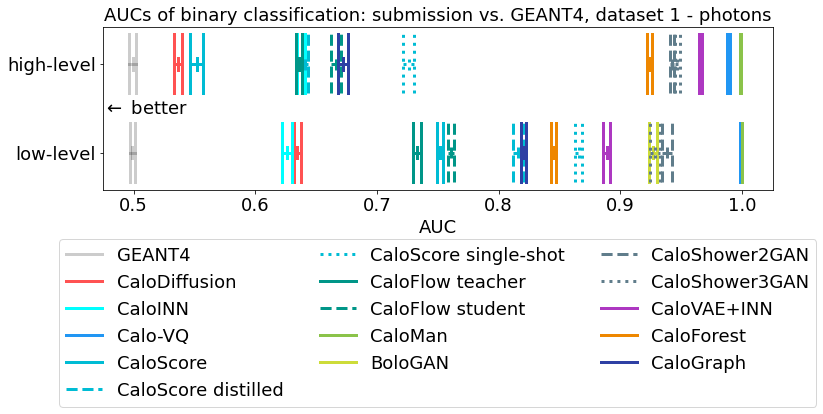

In [11]:
# binary AUCs

plt.figure(figsize=(12,3), facecolor='white')

for run_id, entry in enumerate(ds1_photons['binary cls low'].to_dict()):
    plot_with_errors([ds1_photons['binary cls high'].to_dict()[entry], 1.75], ds1_photons['binary cls high std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds1_photons['binary cls low'].to_dict()[entry], 1.], ds1_photons['binary cls low std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([0.475, 1.025])
plt.xlabel('AUC', fontsize=FS)
plt.legend(bbox_to_anchor=(0.5, -0.25), fontsize=FS, ncol=3, loc='upper center')
plt.title(f"AUCs of binary classification: submission vs. GEANT4, dataset 1 - photons", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75])
plt.gca().set_yticklabels(['low-level', 'high-level'], ha='right', fontsize=FS)
plt.text(0.475, 1.375, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/cls/ds1-photons_binary_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()

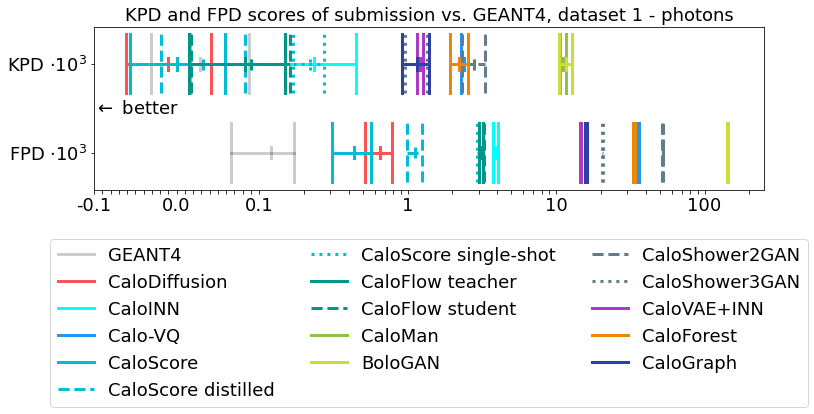

In [12]:
# KPD/FPD

symlog_ticks = [-0.1, *[-0.1+0.01* i for i in range(1,10)], *[0.01* i for i in range(10)],*[0.1*i for i in range(1,10)],*[i for i in range(1,10)],*[10*i for i in range(1,10)],*[100*i for i in range(1,10)], 1000]
symlog_labels = []
for tick in symlog_ticks:
    if tick in [-0.1, 0., 0.1, 1., 10, 100, 1000]:
        symlog_labels.append(str(tick))
    else:
        symlog_labels.append('')

plt.figure(figsize=(12,3), facecolor='white')

for run_id, entry in enumerate(ds1_photons['KPD * 1e3'].to_dict()):
    plot_with_errors([ds1_photons['KPD * 1e3'].to_dict()[entry], 1.75], ds1_photons['KPD * 1e3 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds1_photons['FPD * 1e3'].to_dict()[entry], 1.], ds1_photons['FPD * 1e3 std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('symlog', linthresh=0.1, linscale=0.5)
plt.legend(bbox_to_anchor=(0.5, -0.25), fontsize=FS, ncol=3, loc='upper center')
plt.title(f"KPD and FPD scores of submission vs. GEANT4, dataset 1 - photons", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75])
plt.gca().set_yticklabels([r'FPD $\cdot 10^{3}$', r'KPD $\cdot 10^{3}$'], ha='right', fontsize=FS)
plt.gca().set_xticks(symlog_ticks)
plt.gca().set_xticklabels(symlog_labels)
plt.xlim(-0.1, 250)
plt.text(-0.1, 1.375, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/cls/ds1-photons_KPD_FPD.pdf', dpi=300, bbox_inches='tight')
plt.show()

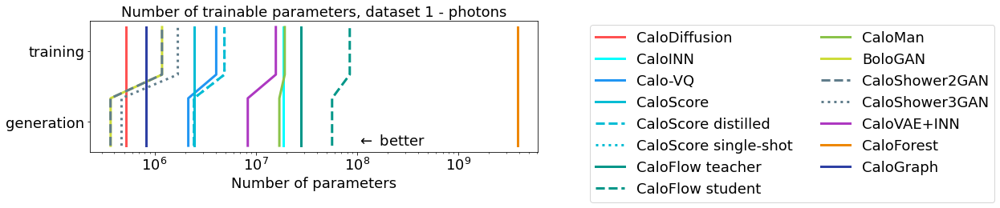

In [13]:
# number of parameters

connected = True

plt.figure(figsize=(10,3), facecolor='white')

for run_id, entry in enumerate(ds1_photons['Parameters training'].to_dict()):
    if entry == 0:
        continue
    if not connected:
        plt.plot(np.repeat(ds1_photons['Parameters generation'].to_dict()[entry], 2), [0.75, 1.25], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])
        plt.plot(np.repeat(ds1_photons['Parameters training'].to_dict()[entry], 2), [1.5, 2.], marker=None, label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    else:
        plt.plot([*np.repeat(ds1_photons['Parameters generation'].to_dict()[entry], 2), *np.repeat(ds1_photons['Parameters training'].to_dict()[entry], 2)], [0.75, 1.25, 1.5, 2.], marker=None, label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

    
plt.xscale('log')
plt.xlabel('Number of parameters', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Number of trainable parameters, dataset 1 - photons", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75])
plt.text(1e8, 0.8, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.gca().set_yticklabels(['generation', 'training'], ha='right', fontsize=FS)

plt.savefig(f'results_fig/ds1-photons_num_param.pdf', dpi=300, bbox_inches='tight')
plt.show()

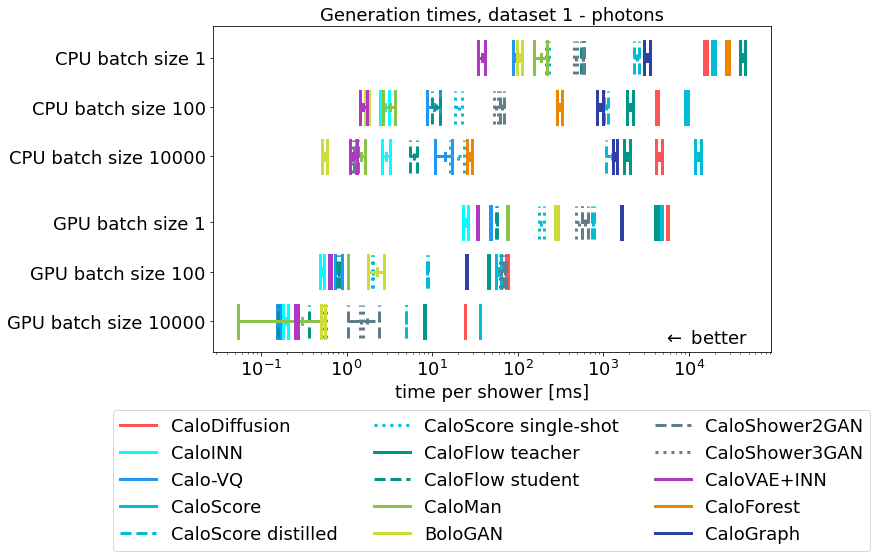

In [14]:
# timings

plt.figure(figsize=(10,6), facecolor='white')

for run_id, entry in enumerate(ds1_photons['time CPU 1'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors([ds1_photons['time CPU 1'].to_dict()[entry], 5.], ds1_photons['time CPU 1 std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])
    plot_with_errors([ds1_photons['time CPU 100'].to_dict()[entry], 4.25], ds1_photons['time CPU 100 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds1_photons['time CPU 10000'].to_dict()[entry], 3.5], ds1_photons['time CPU 10000 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds1_photons['time GPU 1'].to_dict()[entry], 2.5], ds1_photons['time GPU 1 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds1_photons['time GPU 100'].to_dict()[entry], 1.75], ds1_photons['time GPU 100 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds1_photons['time GPU 10000'].to_dict()[entry], 1.], ds1_photons['time GPU 10000 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])

plt.xscale('log')
plt.xlabel('time per shower [ms]', fontsize=FS)
plt.legend(bbox_to_anchor=(0.5, -0.15), fontsize=FS, ncol=3, loc='upper center')
plt.title(f"Generation times, dataset 1 - photons", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75, 2.5, 3.5, 4.25, 5.])
plt.gca().set_yticklabels(['GPU batch size 10000', 'GPU batch size 100', 'GPU batch size 1','CPU batch size 10000', 'CPU batch size 100', 'CPU batch size 1'], ha='right', fontsize=FS)
plt.text(5e3, .75, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/time/ds1-photons.pdf', dpi=300, bbox_inches='tight')
plt.show()

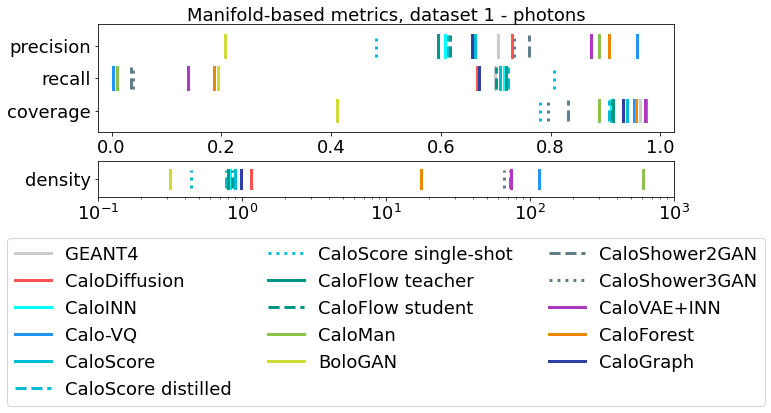

In [15]:
# manifold based metrics

fig, axs = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]},figsize=(10,3), facecolor='white')

#plt.figure(figsize=(10,3), facecolor='white')

for run_id, entry in enumerate(ds1_photons['precision'].to_dict()):
    axs[0].plot(np.repeat(ds1_photons['precision'].to_dict()[entry], 2), [2.25, 2.75], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])
    axs[0].plot(np.repeat(ds1_photons['recall'].to_dict()[entry], 2), [1.5, 2.], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])
    axs[0].plot(np.repeat(ds1_photons['coverage'].to_dict()[entry], 2), [0.75, 1.25], marker=None, label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    axs[1].plot(np.repeat(ds1_photons['density'].to_dict()[entry], 2), [0., 0.5], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])

axs[0].set_xlim([-0.025, 1.025])
axs[0].set_ylim([0.5, 3.])
axs[0].set_yticks([1,1.75, 2.5])
axs[0].set_yticklabels(['coverage', 'recall', 'precision'], ha='right', fontsize=FS)
axs[0].xaxis.set_tick_params(labelsize=FS)

axs[1].set_xlim([0.1, 1e3])
axs[1].set_ylim([-0.25,0.75])
axs[1].set_xscale('log')
axs[1].set_yticks([0.25])
axs[1].set_yticklabels(['density'], ha='right', fontsize=FS)
axs[1].xaxis.set_tick_params(labelsize=FS)

fig.legend(bbox_to_anchor=(0.5, -0.05), fontsize=FS, ncol=3, loc='upper center')

fig.suptitle(f"Manifold-based metrics, dataset 1 - photons", fontsize=FS)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.savefig(f'results_fig/man/ds1-photons.pdf', dpi=300, bbox_inches='tight')
plt.show()


### ds1 pions

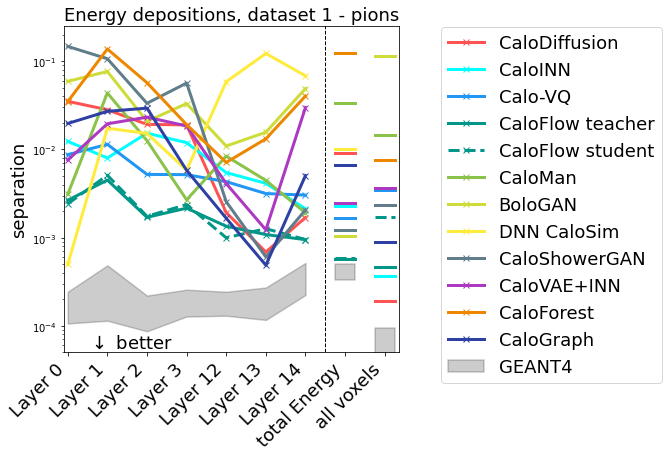

In [16]:
# energy depositions

plt.figure(figsize=(6,6), facecolor='white')
x_scan = np.arange(9)

for entry in ds1_pions['sep E layer'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan[:7], ds1_pions['sep E layer'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    plt.plot([x_scan[7]-0.25, x_scan[7]+0.25], np.repeat([ds1_pions['sep E total'].to_dict()[entry]], 2), marker=None, label="_please_dont", linewidth=3., **kwargs_dict[entry])
    plt.plot([x_scan[8]-0.25, x_scan[8]+0.25], np.repeat([ds1_pions['sep cell'].to_dict()[entry]], 2), marker=None, label="_please_dont", linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds1_pions['sep E layer'], 0)
plt.fill_between(x_scan[:7], geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])
geant_min, geant_max = get_min_max_from_dict(ds1_pions['sep E total'], 0)
plt.fill_between([x_scan[7]-0.25, x_scan[7]+0.25], np.repeat([geant_min], 2), np.repeat([geant_max], 2), label="_please_dont", linewidth=1.5, **kwargs_dict[0])
geant_min, geant_max = get_min_max_from_dict(ds1_pions['sep cell'], 0)
plt.fill_between([x_scan[8]-0.25, x_scan[8]+0.25], np.repeat([geant_min], 2), np.repeat([geant_max], 2), label="_please_dont", linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.35])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.ylim(5e-5,2.5e-1)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels(['Layer 0', 'Layer 1', 'Layer 2', 'Layer 3', 'Layer 12', 'Layer 13', 'Layer 14', 'total Energy', 'all voxels'],
                          rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS)
plt.title(f"Energy depositions, dataset 1 - pions", fontsize=FS)
plt.axvline(x = 6.5, color = 'k', linestyle='dashed', linewidth=1)
plt.text(0.5, 5e-5, r"$\downarrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/sep/ds1-pions_depositions.pdf', dpi=300, bbox_inches='tight')
plt.show()
          

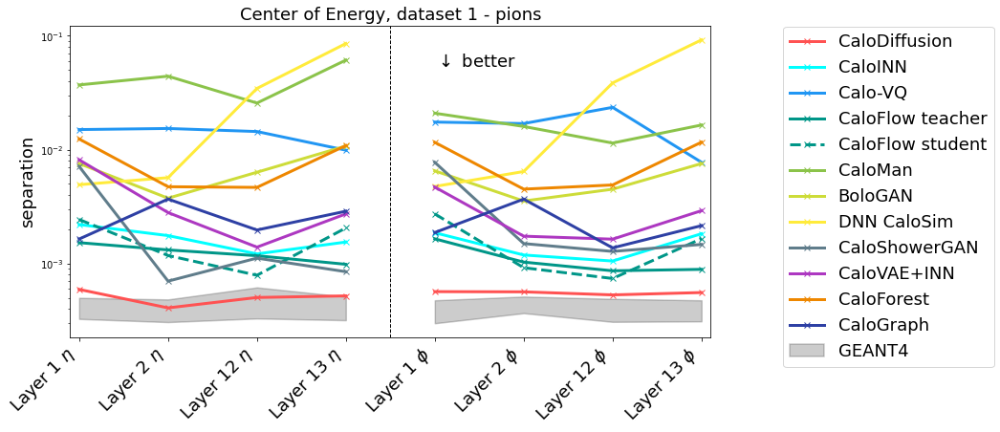

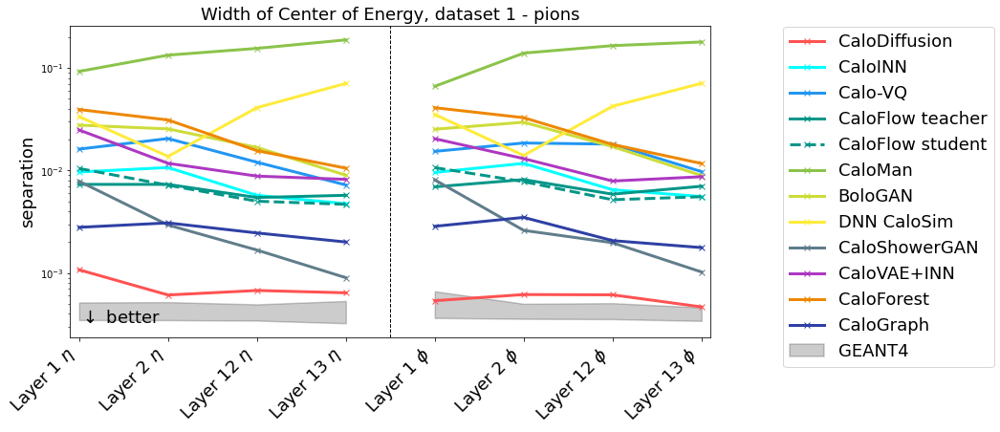

In [17]:
# EC and its width

plt.figure(figsize=(12,6), facecolor='white')
x_scan = np.arange(8.)

for run_id, entry in enumerate(ds1_pions['sep EC eta'].to_dict()):
    if entry == 0:
        continue
    plt.plot(x_scan[:4], ds1_pions['sep EC eta'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    plt.plot(x_scan[4:], ds1_pions['sep EC phi'].to_dict()[entry], marker='x', label="_please_dont", linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds1_pions['sep EC eta'].to_dict(), 0)
plt.fill_between(x_scan[:4], geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])
geant_min, geant_max = get_min_max_from_dict(ds1_pions['sep EC phi'], 0)
plt.fill_between(x_scan[4:], geant_min, geant_max, label="_please_dont", linewidth=1.5, **kwargs_dict[0])


plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([r'Layer 1 $\eta$', r'Layer 2 $\eta$', r'Layer 12 $\eta$', r'Layer 13 $\eta$', 
                           r'Layer 1 $\phi$', r'Layer 2 $\phi$', r'Layer 12 $\phi$', r'Layer 13 $\phi$'], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS)
plt.title(f"Center of Energy, dataset 1 - pions", fontsize=FS)
plt.axvline(x = 3.5, color = 'k', linestyle='dashed', linewidth=1)
plt.text(4, 5e-2, r"$\downarrow$ better", fontsize=FS, va='bottom')

plt.savefig(f'results_fig/sep/ds1-pions_CE.pdf', dpi=300, bbox_inches='tight')
plt.show()
          
plt.figure(figsize=(12,6), facecolor='white')
x_scan = np.arange(8.)

for run_id, entry in enumerate(ds1_pions['sep EC eta std'].to_dict()):
    if entry == 0:
        continue
    plt.plot(x_scan[:4], ds1_pions['sep EC eta std'][entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    plt.plot(x_scan[4:], ds1_pions['sep EC phi std'][entry], marker='x', label="_please_dont", linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds1_pions['sep EC eta std'].to_dict(), 0)
plt.fill_between(x_scan[:4], geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])
geant_min, geant_max = get_min_max_from_dict(ds1_pions['sep EC phi std'], 0)
plt.fill_between(x_scan[4:], geant_min, geant_max, label="_please_dont", linewidth=1.5, **kwargs_dict[0])


plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([r'Layer 1 $\eta$', r'Layer 2 $\eta$', r'Layer 12 $\eta$', r'Layer 13 $\eta$', 
                           r'Layer 1 $\phi$', r'Layer 2 $\phi$', r'Layer 12 $\phi$', r'Layer 13 $\phi$'], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS)
plt.title(f"Width of Center of Energy, dataset 1 - pions", fontsize=FS)
plt.axvline(x = 3.5, color = 'k', linestyle='dashed', linewidth=1)
plt.text(0, 3e-4, r"$\downarrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/sep/ds1-pions_width_CE.pdf', dpi=300, bbox_inches='tight')
plt.show()
          


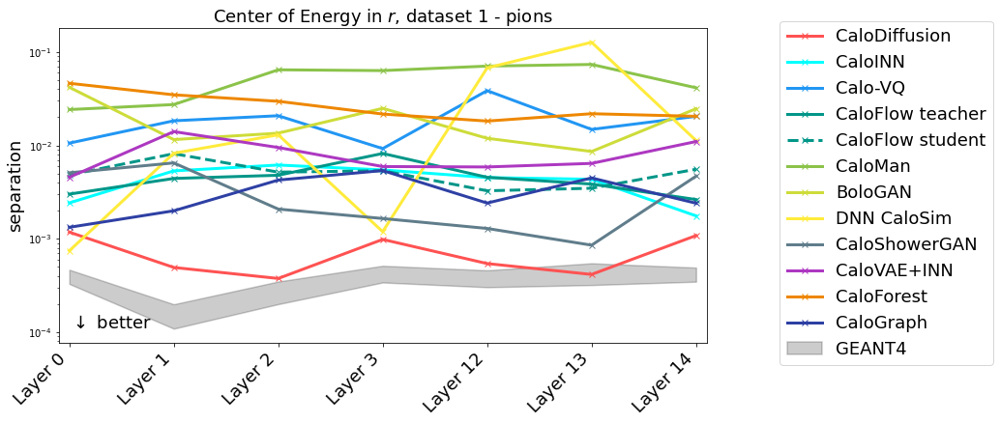

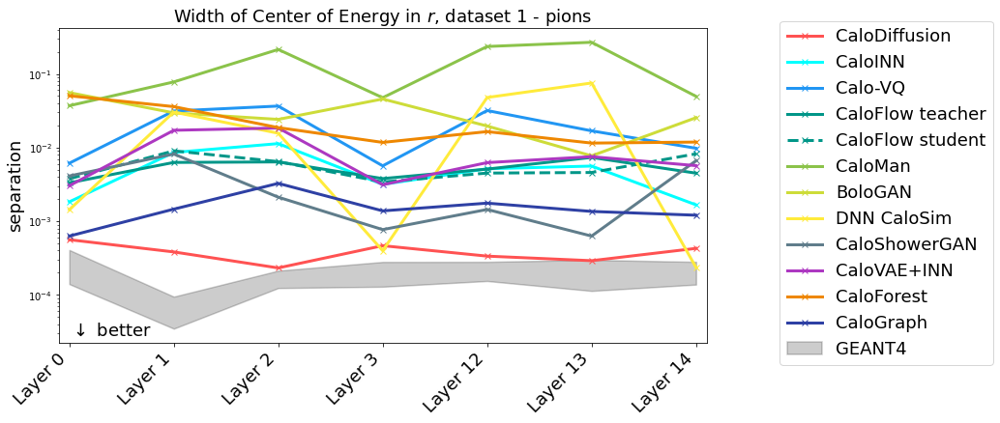

In [18]:
# EC and its width in r

plt.figure(figsize=(12,6), facecolor='white')
x_scan = np.arange(7)

for run_id, entry in enumerate(ds1_pions['sep EC r'].to_dict()):
    if entry == 0:
        continue
    plt.plot(x_scan, ds1_pions['sep EC r'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds1_pions['sep EC r'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])
    
plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels(['Layer 0', 'Layer 1', 'Layer 2', 'Layer 3', 'Layer 12', 'Layer 13', 'Layer 14'], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.05), fontsize=FS)
plt.title(f"Center of Energy in $r$, dataset 1 - pions", fontsize=FS)
plt.text(0, 1e-4, r"$\downarrow$ better", fontsize=FS, va='bottom')

plt.savefig(f'results_fig/sep/ds1-pions_CE_r.pdf', dpi=300, bbox_inches='tight')
plt.show()
          
plt.figure(figsize=(12,6), facecolor='white')
x_scan = np.arange(7)

for run_id, entry in enumerate(ds1_pions['sep EC r std'].to_dict()):
    if entry == 0:
        continue
    plt.plot(x_scan, ds1_pions['sep EC r std'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds1_pions['sep EC r std'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels(['Layer 0', 'Layer 1', 'Layer 2', 'Layer 3', 'Layer 12', 'Layer 13', 'Layer 14'], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.05), fontsize=FS)
plt.title(f"Width of Center of Energy in $r$, dataset 1 - pions", fontsize=FS)
plt.text(0, 2.5e-5, r"$\downarrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/sep/ds1-pions_width_CE_r.pdf', dpi=300, bbox_inches='tight')
plt.show()
          


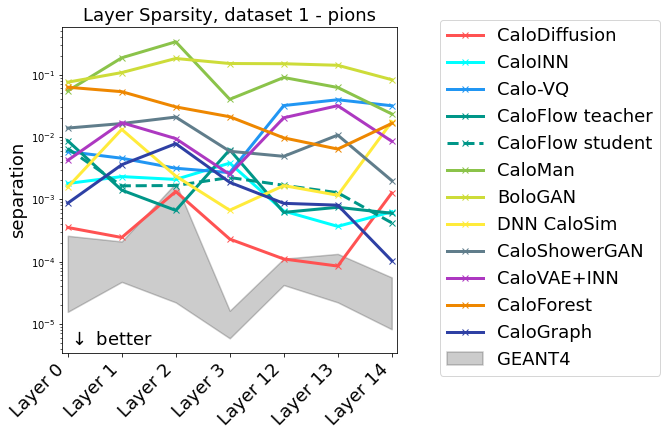

In [19]:
# layer sparsities

plt.figure(figsize=(6,6), facecolor='white')
x_scan = np.arange(7)

for entry in ds1_pions['sep sparsity'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds1_pions['sep sparsity'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
geant_min, geant_max = get_min_max_from_dict(ds1_pions['sep sparsity'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels(['Layer 0', 'Layer 1', 'Layer 2', 'Layer 3', 'Layer 12', 'Layer 13', 'Layer 14'], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.05), fontsize=FS)
plt.title(f"Layer Sparsity, dataset 1 - pions", fontsize=FS)
plt.text(0, 4e-6, r"$\downarrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/sep/ds1-pions_sparsity.pdf', dpi=300, bbox_inches='tight')
plt.show()


working on submission 0
[[0.06773822 0.11453882 0.21171012 0.23874975 0.42076364 0.71918533
  1.        ]
 [0.12156482 0.19240471 0.32719286 0.36333968 0.6696151  1.
  0.71918533]
 [0.16207543 0.24088572 0.40568413 0.53898538 1.         0.6696151
  0.42076364]
 [0.16704639 0.24810446 0.65587849 1.         0.53898538 0.36333968
  0.23874975]
 [0.41793759 0.66917673 1.         0.65587849 0.40568413 0.32719286
  0.21171012]
 [0.77956021 1.         0.66917673 0.24810446 0.24088572 0.19240471
  0.11453882]
 [1.         0.77956021 0.41793759 0.16704639 0.16207543 0.12156482
  0.06773822]]


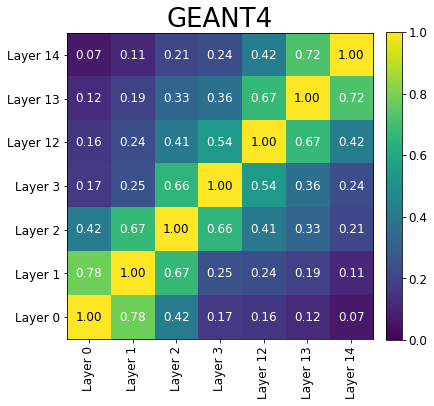

working on submission 1
[[0.07506359 0.11648933 0.20257552 0.24813325 0.40828418 0.71951721
  1.        ]
 [0.12705973 0.1898401  0.32750082 0.38570321 0.66355987 1.
  0.71951721]
 [0.16635818 0.23291444 0.41607373 0.57509577 1.         0.66355987
  0.40828418]
 [0.16292384 0.23461999 0.62859393 1.         0.57509577 0.38570321
  0.24813325]
 [0.43863409 0.6747381  1.         0.62859393 0.41607373 0.32750082
  0.20257552]
 [0.79349468 1.         0.6747381  0.23461999 0.23291444 0.1898401
  0.11648933]
 [1.         0.79349468 0.43863409 0.16292384 0.16635818 0.12705973
  0.07506359]]


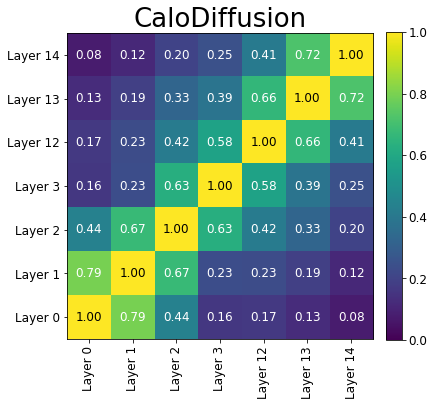

working on submission 4
[[0.01183728 0.10449681 0.20506847 0.27640587 0.46461875 0.7635009
  1.        ]
 [0.01834013 0.14923122 0.29271279 0.37587953 0.68470357 1.
  0.7635009 ]
 [0.02416075 0.17975643 0.36734792 0.54385418 1.         0.68470357
  0.46461875]
 [0.02969727 0.21619181 0.63510512 1.         0.54385418 0.37587953
  0.27640587]
 [0.08310846 0.65484792 1.         0.63510512 0.36734792 0.29271279
  0.20506847]
 [0.1488653  1.         0.65484792 0.21619181 0.17975643 0.14923122
  0.10449681]
 [1.         0.1488653  0.08310846 0.02969727 0.02416075 0.01834013
  0.01183728]]


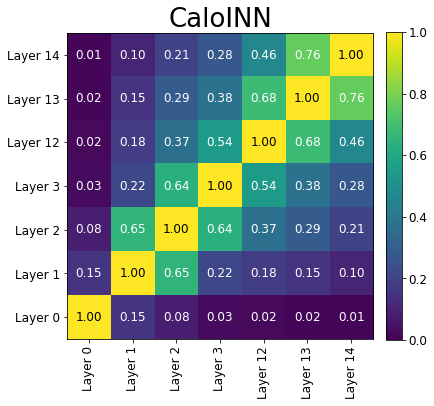

working on submission 7
[[0.05715072 0.09356058 0.15312441 0.18840636 0.32788728 0.61696383
  1.        ]
 [0.10384227 0.18006508 0.30019523 0.36785118 0.65629406 1.
  0.61696383]
 [0.14644436 0.24546781 0.40408871 0.52522779 1.         0.65629406
  0.32788728]
 [0.15737844 0.24938608 0.61947228 1.         0.52522779 0.36785118
  0.18840636]
 [0.38643049 0.64499065 1.         0.61947228 0.40408871 0.30019523
  0.15312441]
 [0.73575273 1.         0.64499065 0.24938608 0.24546781 0.18006508
  0.09356058]
 [1.         0.73575273 0.38643049 0.15737844 0.14644436 0.10384227
  0.05715072]]


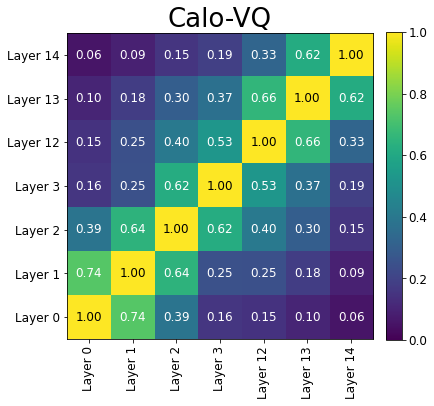

working on submission 11
[[0.08243476 0.13413392 0.23858741 0.28242836 0.44785438 0.74737332
  1.        ]
 [0.13630737 0.2031566  0.35288792 0.41546107 0.70237385 1.
  0.74737332]
 [0.17183637 0.24252357 0.42646397 0.57070042 1.         0.70237385
  0.44785438]
 [0.18027734 0.26081266 0.66446097 1.         0.57070042 0.41546107
  0.28242836]
 [0.4211755  0.67082788 1.         0.66446097 0.42646397 0.35288792
  0.23858741]
 [0.78835103 1.         0.67082788 0.26081266 0.24252357 0.2031566
  0.13413392]
 [1.         0.78835103 0.4211755  0.18027734 0.17183637 0.13630737
  0.08243476]]


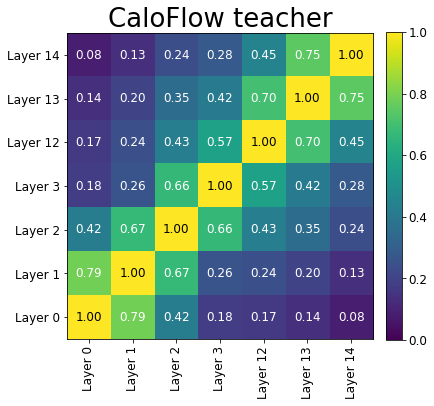

working on submission 12
[[0.08346749 0.13742165 0.24454089 0.27740534 0.43646652 0.73369375
  1.        ]
 [0.14017168 0.20756658 0.36220526 0.41517308 0.703854   1.
  0.73369375]
 [0.17574162 0.24808028 0.43946073 0.57395975 1.         0.703854
  0.43646652]
 [0.17323274 0.24936332 0.6602183  1.         0.57395975 0.41517308
  0.27740534]
 [0.42654487 0.67045442 1.         0.6602183  0.43946073 0.36220526
  0.24454089]
 [0.78853136 1.         0.67045442 0.24936332 0.24808028 0.20756658
  0.13742165]
 [1.         0.78853136 0.42654487 0.17323274 0.17574162 0.14017168
  0.08346749]]


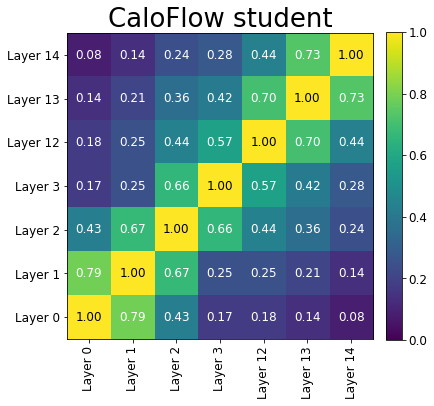

working on submission 16
[[0.07541164 0.1183436  0.22147514 0.27866423 0.43658807 0.72206319
  1.        ]
 [0.12248361 0.18131045 0.33089595 0.41141363 0.69992135 1.
  0.72206319]
 [0.16366062 0.2298945  0.4317797  0.59623037 1.         0.69992135
  0.43658807]
 [0.16324606 0.22810106 0.65867777 1.         0.59623037 0.41141363
  0.27866423]
 [0.40386736 0.61847082 1.         0.65867777 0.4317797  0.33089595
  0.22147514]
 [0.77804302 1.         0.61847082 0.22810106 0.2298945  0.18131045
  0.1183436 ]
 [1.         0.77804302 0.40386736 0.16324606 0.16366062 0.12248361
  0.07541164]]


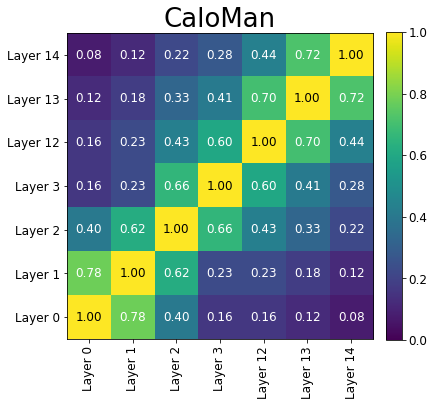

working on submission 17
[[0.14536719 0.11473613 0.22927706 0.25326309 0.4034969  0.68428558
  1.        ]
 [0.19008092 0.14787721 0.33497528 0.37868575 0.65449164 1.
  0.68428558]
 [0.14257603 0.20862494 0.45806291 0.62789156 1.         0.65449164
  0.4034969 ]
 [0.06767883 0.28637518 0.654198   1.         0.62789156 0.37868575
  0.25326309]
 [0.18902705 0.6497608  1.         0.654198   0.45806291 0.33497528
  0.22927706]
 [0.44676132 1.         0.6497608  0.28637518 0.20862494 0.14787721
  0.11473613]
 [1.         0.44676132 0.18902705 0.06767883 0.14257603 0.19008092
  0.14536719]]


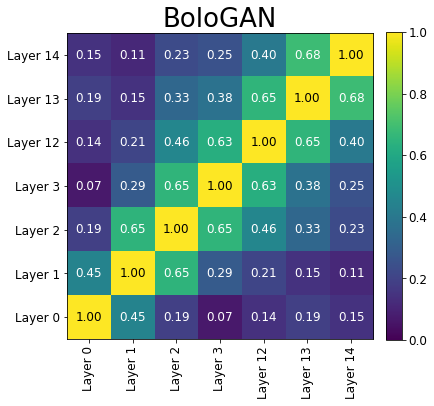

working on submission 20
[[0.0628389  0.11128681 0.20332742 0.22893836 0.40402553 0.70436073
  1.        ]
 [0.12193698 0.19672314 0.33216702 0.37381559 0.66741302 1.
  0.70436073]
 [0.16437957 0.24633818 0.41836218 0.5550747  1.         0.66741302
  0.40402553]
 [0.16964677 0.25420224 0.6546787  1.         0.5550747  0.37381559
  0.22893836]
 [0.41484198 0.67379002 1.         0.6546787  0.41836218 0.33216702
  0.20332742]
 [0.77704415 1.         0.67379002 0.25420224 0.24633818 0.19672314
  0.11128681]
 [1.         0.77704415 0.41484198 0.16964677 0.16437957 0.12193698
  0.0628389 ]]


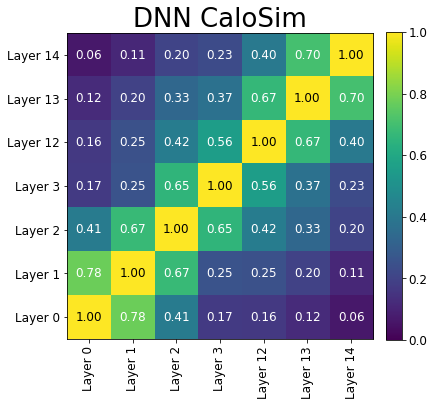

working on submission 24
[[0.11802436 0.1175581  0.21220385 0.25477269 0.39953931 0.67057951
  1.        ]
 [0.17150007 0.19739867 0.33053147 0.38218379 0.68838446 1.
  0.67057951]
 [0.21142935 0.2462109  0.42491501 0.57004466 1.         0.68838446
  0.39953931]
 [0.21758408 0.26438028 0.62464122 1.         0.57004466 0.38218379
  0.25477269]
 [0.50158075 0.72339691 1.         0.62464122 0.42491501 0.33053147
  0.21220385]
 [0.75324915 1.         0.72339691 0.26438028 0.2462109  0.19739867
  0.1175581 ]
 [1.         0.75324915 0.50158075 0.21758408 0.21142935 0.17150007
  0.11802436]]


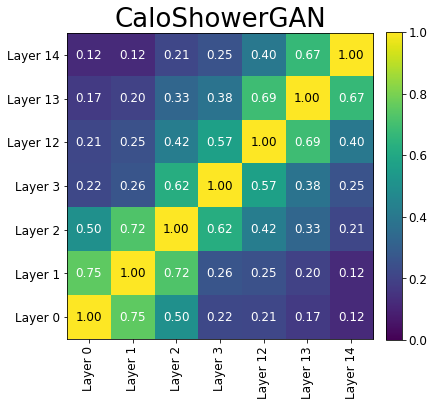

working on submission 27
[[0.01528635 0.05503184 0.15573245 0.20131361 0.27393574 0.40906097
  1.        ]
 [0.06081498 0.18493453 0.39539076 0.45442023 0.66543929 1.
  0.40906097]
 [0.07683351 0.21106768 0.47639779 0.61491436 1.         0.66543929
  0.27393574]
 [0.08642181 0.21721694 0.67521448 1.         0.61491436 0.45442023
  0.20131361]
 [0.21040394 0.58970251 1.         0.67521448 0.47639779 0.39539076
  0.15573245]
 [0.38492023 1.         0.58970251 0.21721694 0.21106768 0.18493453
  0.05503184]
 [1.         0.38492023 0.21040394 0.08642181 0.07683351 0.06081498
  0.01528635]]


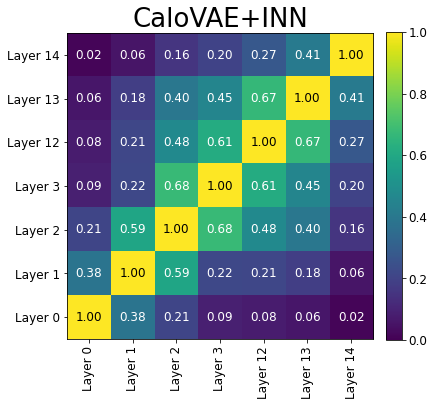

working on submission 28
[[0.14375059 0.28147954 0.49848187 0.54399005 0.70401859 0.84891004
  1.        ]
 [0.19728153 0.37020726 0.61079946 0.64600783 0.86045751 1.
  0.84891004]
 [0.22148088 0.39809398 0.64602327 0.73599161 1.         0.86045751
  0.70401859]
 [0.21499437 0.38270844 0.74290224 1.         0.73599161 0.64600783
  0.54399005]
 [0.41091394 0.72473817 1.         0.74290224 0.64602327 0.61079946
  0.49848187]
 [0.69223309 1.         0.72473817 0.38270844 0.39809398 0.37020726
  0.28147954]
 [1.         0.69223309 0.41091394 0.21499437 0.22148088 0.19728153
  0.14375059]]


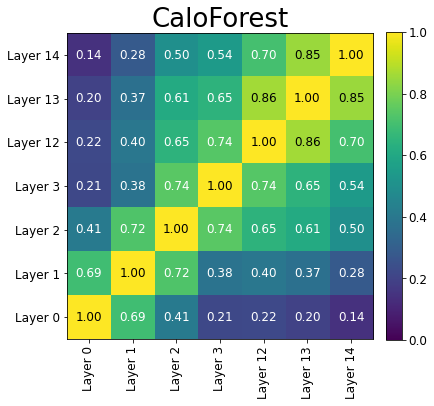

working on submission 29
[[0.17564941 0.24060648 0.36018073 0.43500075 0.60394422 0.86314435
  1.        ]
 [0.21993236 0.29710043 0.43641677 0.53554313 0.7704728  1.
  0.86314435]
 [0.29548394 0.3763377  0.54681089 0.72137707 1.         0.7704728
  0.60394422]
 [0.34009614 0.44976608 0.75664878 1.         0.72137707 0.53554313
  0.43500075]
 [0.55880031 0.77485071 1.         0.75664878 0.54681089 0.43641677
  0.36018073]
 [0.80999465 1.         0.77485071 0.44976608 0.3763377  0.29710043
  0.24060648]
 [1.         0.80999465 0.55880031 0.34009614 0.29548394 0.21993236
  0.17564941]]


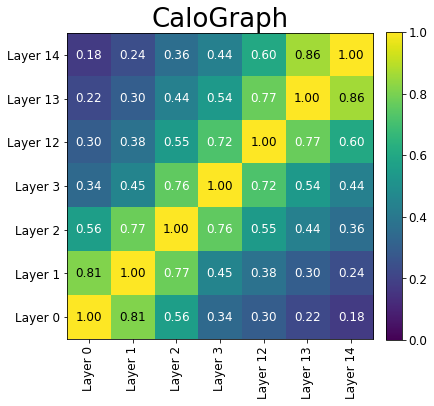

In [20]:
# layer correlations based on 2406.12898


for iter_id, submission_id in enumerate(ds1_pions['PCC Layer Energies'].to_dict()):
    plt.figure(figsize=(6,6), facecolor='white')
    print(f"working on submission {submission_id}")
    labels = ['Layer 0', 'Layer 1', 'Layer 2', 'Layer 3', 'Layer 12', 'Layer 13', 'Layer 14']
    E_corr = np.array(ds1_pions['PCC Layer Energies'].to_dict()[submission_id]).astype(float)
    print(E_corr)
    plot_corr(E_corr, id_dict[submission_id], labels, f'results_fig/corr/ds1-pions_{submission_id}.pdf')


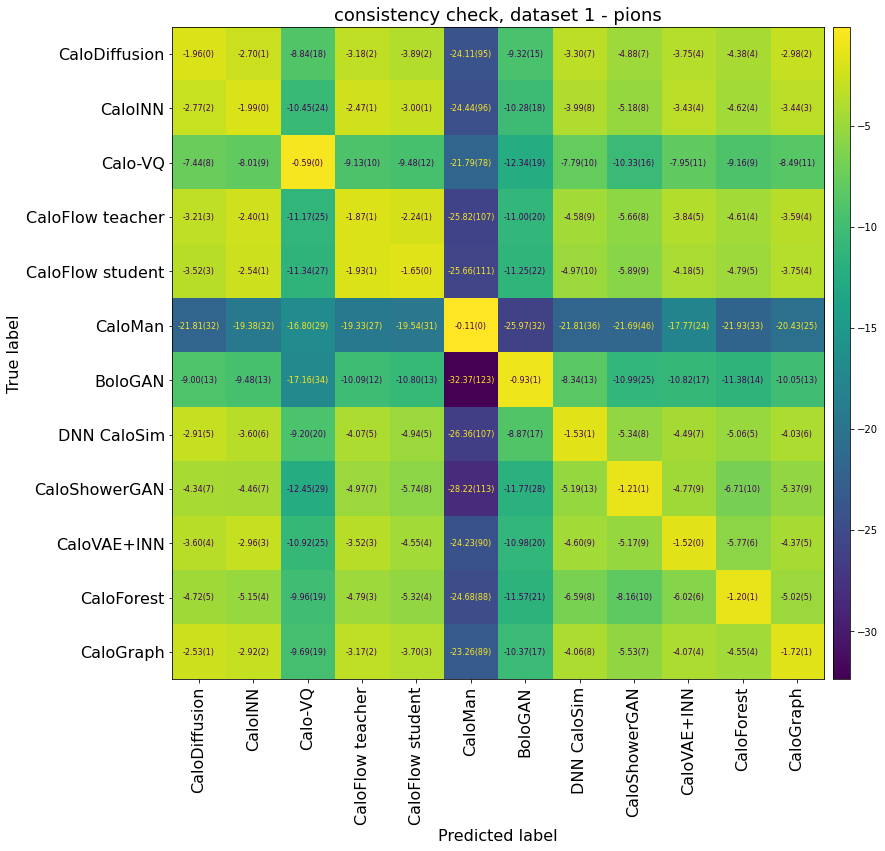

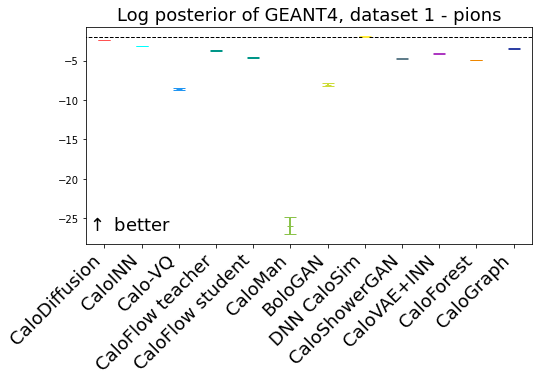

In [21]:
# multiclass classifier

log_post_by_model = []
log_post_by_model_std = []
label = []
for entry in ds1_pions['multi cls CC'].to_dict():
    if entry == 0:
        continue
    log_post_by_model.append(ds1_pions['multi cls CC'].to_dict()[entry])
    log_post_by_model_std.append(ds1_pions['multi cls CC std'].to_dict()[entry])
    label.append(id_dict[entry])

log_post_by_model = np.array(log_post_by_model).astype(float)    
log_post_by_model_std = np.array(log_post_by_model_std).astype(float)    
    
plt.figure(figsize=(12,12))
disp = ConfusionMatrixDisplayError(confusion_matrix=log_post_by_model, 
                              display_labels=label, errors=log_post_by_model_std)
disp.plot(xticks_rotation='vertical', ax=plt.gca(), colorbar=False, values_format=".2f", include_errors=True, text_kw={'fontsize': 8})
plt.title(f"consistency check, dataset 1 - pions", fontsize=FS)
cax = plt.gcf().add_axes([plt.gca().get_position().x1+0.01,plt.gca().get_position().y0,0.02,plt.gca().get_position().height])
plt.colorbar(disp.im_,  cax=cax)
plt.savefig(f'results_fig/cls/ds1-pions_confusion.pdf', dpi=300, bbox_inches='tight')
plt.show()

log_truth = []
log_truth_std = []
color = []
for entry in ds1_pions['multi cls'].to_dict():
    if entry == 0:
        continue
    log_truth.append(ds1_pions['multi cls'].to_dict()[entry])
    log_truth_std.append(ds1_pions['multi cls std'].to_dict()[entry])
    color.append(kwargs_dict[entry]['color'])

log_truth = np.array(log_truth).astype(float)    
log_truth_std = np.array(log_truth_std).astype(float)    

plt.figure(figsize=(8,4))
for x, y, yerr, col in zip(np.arange(len(label)), log_truth, log_truth_std, color):
    plt.errorbar(x, y, yerr=yerr, elinewidth=2, marker='_', capsize=6, linestyle='None', color=col)
#plt.errorbar(np.arange(len(label)), log_truth, yerr=log_truth_std, elinewidth=2, marker='_', capsize=6, linestyle='None')
plt.hlines(np.max(log_truth), xmin=-1, xmax=len(label), color = 'k', linestyle='dashed', linewidth=1)
plt.xlim(-0.5, len(label)-0.5)
plt.title(f"Log posterior of GEANT4, dataset 1 - pions", fontsize=FS)
plt.gca().set_xticks(np.arange(len(label)))
plt.gca().set_xticklabels(label, rotation=45, ha='right', fontsize=FS)
plt.text(-0.5, -27., r"$\uparrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/cls/ds1-pions_truth.pdf', dpi=300, bbox_inches='tight')
plt.show()


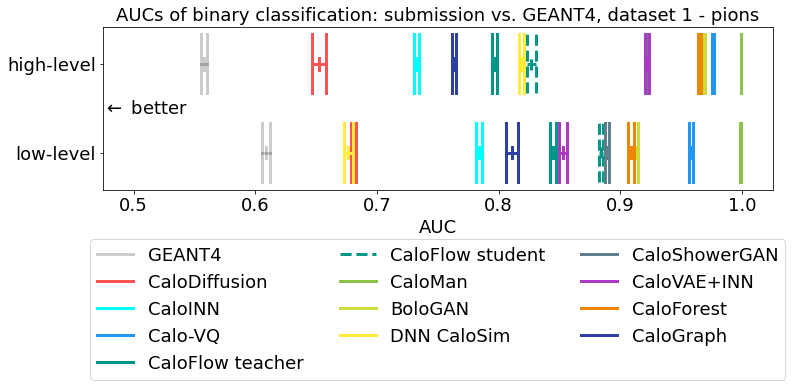

In [22]:
# binary AUCs

plt.figure(figsize=(12,3), facecolor='white')

for run_id, entry in enumerate(ds1_pions['binary cls low'].to_dict()):
    plot_with_errors([ds1_pions['binary cls high'].to_dict()[entry], 1.75], ds1_pions['binary cls high std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds1_pions['binary cls low'].to_dict()[entry], 1.], ds1_pions['binary cls low std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([0.475, 1.025])
plt.xlabel('AUC', fontsize=FS)
plt.legend(bbox_to_anchor=(0.5, -0.25), fontsize=FS, ncol=3, loc='upper center')
plt.title(f"AUCs of binary classification: submission vs. GEANT4, dataset 1 - pions", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75])
plt.gca().set_yticklabels(['low-level', 'high-level'], ha='right', fontsize=FS)
plt.text(0.475, 1.375, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/cls/ds1-pions_binary_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()

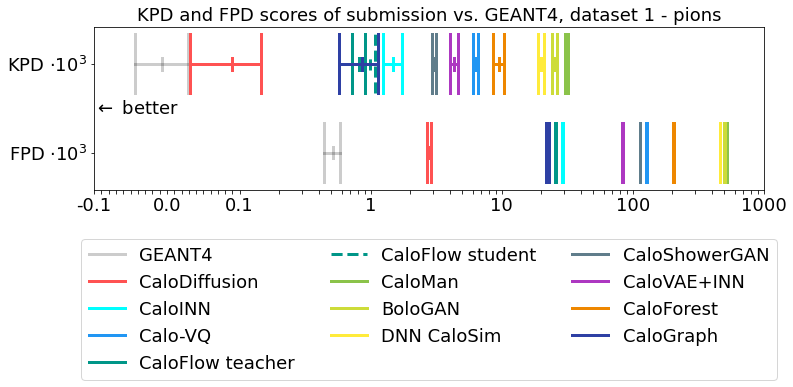

In [23]:
# KPD/FPD

symlog_ticks = [-0.1, *[-0.1+0.01* i for i in range(1,10)], *[0.01* i for i in range(10)],*[0.1*i for i in range(1,10)],*[i for i in range(1,10)],*[10*i for i in range(1,10)],*[100*i for i in range(1,10)], 1000]
symlog_labels = []
for tick in symlog_ticks:
    if tick in [-0.1, 0., 0.1, 1., 10, 100, 1000]:
        symlog_labels.append(str(tick))
    else:
        symlog_labels.append('')

plt.figure(figsize=(12,3), facecolor='white')

for run_id, entry in enumerate(ds1_pions['KPD * 1e3'].to_dict()):
    plot_with_errors([ds1_pions['KPD * 1e3'].to_dict()[entry], 1.75], ds1_pions['KPD * 1e3 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds1_pions['FPD * 1e3'].to_dict()[entry], 1.], ds1_pions['FPD * 1e3 std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('symlog', linthresh=0.1, linscale=0.5)
plt.legend(bbox_to_anchor=(0.5, -0.25), fontsize=FS, ncol=3, loc='upper center')
plt.title(f"KPD and FPD scores of submission vs. GEANT4, dataset 1 - pions", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75])
plt.gca().set_yticklabels([r'FPD $\cdot 10^{3}$', r'KPD $\cdot 10^{3}$'], ha='right', fontsize=FS)
plt.gca().set_xticks(symlog_ticks)
plt.gca().set_xticklabels(symlog_labels)
plt.text(-0.1, 1.375, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/cls/ds1-pions_KPD_FPD.pdf', dpi=300, bbox_inches='tight')
plt.show()

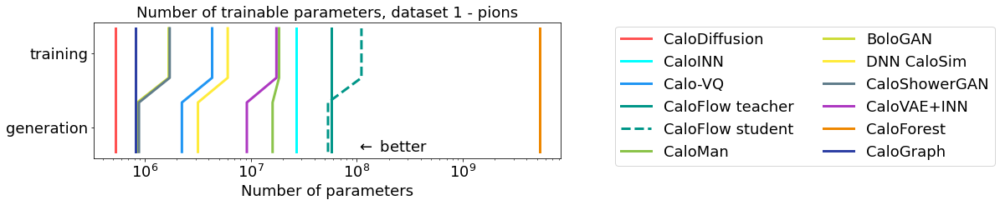

In [24]:
# number of parameters

connected = True

plt.figure(figsize=(10,3), facecolor='white')

for run_id, entry in enumerate(ds1_pions['Parameters training'].to_dict()):
    if entry == 0:
        continue
    if not connected:
        plt.plot(np.repeat(ds1_pions['Parameters generation'].to_dict()[entry], 2), [0.75, 1.25], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])
        plt.plot(np.repeat(ds1_pions['Parameters training'].to_dict()[entry], 2), [1.5, 2.], marker=None, label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    else:
        plt.plot([*np.repeat(ds1_pions['Parameters generation'].to_dict()[entry], 2), *np.repeat(ds1_pions['Parameters training'].to_dict()[entry], 2)], [0.75, 1.25, 1.5, 2.], marker=None, label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

    
plt.xscale('log')
plt.xlabel('Number of parameters', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Number of trainable parameters, dataset 1 - pions", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75])
plt.gca().set_yticklabels(['generation', 'training'], ha='right', fontsize=FS)
plt.text(1e8, 0.8, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/ds1-pions_num_param.pdf', dpi=300, bbox_inches='tight')
plt.show()

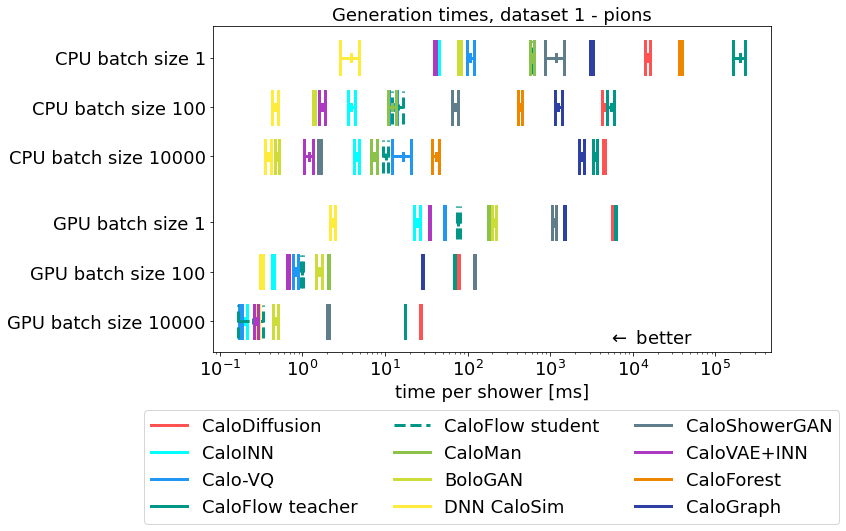

In [25]:
# timings

plt.figure(figsize=(10,6), facecolor='white')

for run_id, entry in enumerate(ds1_pions['time CPU 1'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors([ds1_pions['time CPU 1'].to_dict()[entry], 5.], ds1_pions['time CPU 1 std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])
    plot_with_errors([ds1_pions['time CPU 100'].to_dict()[entry], 4.25], ds1_pions['time CPU 100 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds1_pions['time CPU 10000'].to_dict()[entry], 3.5], ds1_pions['time CPU 10000 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds1_pions['time GPU 1'].to_dict()[entry], 2.5], ds1_pions['time GPU 1 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds1_pions['time GPU 100'].to_dict()[entry], 1.75], ds1_pions['time GPU 100 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds1_pions['time GPU 10000'].to_dict()[entry], 1.], ds1_pions['time GPU 10000 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])

plt.xscale('log')
plt.xlabel('time per shower [ms]', fontsize=FS)
plt.legend(bbox_to_anchor=(0.5, -0.15), fontsize=FS, ncol=3, loc='upper center')
plt.title(f"Generation times, dataset 1 - pions", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75, 2.5, 3.5, 4.25, 5.])
plt.gca().set_yticklabels(['GPU batch size 10000', 'GPU batch size 100', 'GPU batch size 1','CPU batch size 10000', 'CPU batch size 100', 'CPU batch size 1'], ha='right', fontsize=FS)
plt.text(5e3, .75, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/time/ds1-pions.pdf', dpi=300, bbox_inches='tight')
plt.show()


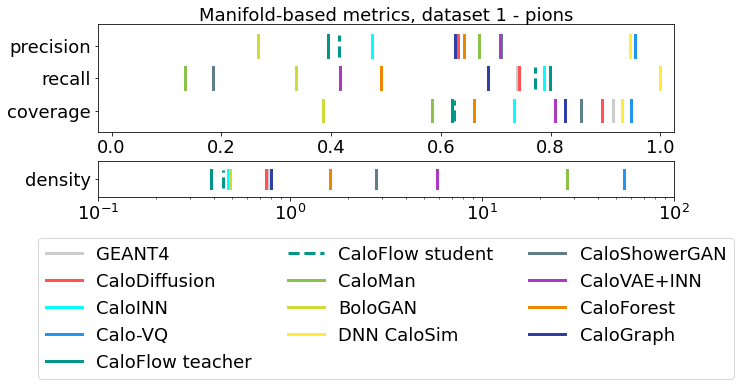

In [26]:
# manifold based metrics

fig, axs = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]},figsize=(10,3), facecolor='white')

for run_id, entry in enumerate(ds1_pions['precision'].to_dict()):
    axs[0].plot(np.repeat(ds1_pions['precision'].to_dict()[entry], 2), [2.25, 2.75], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])
    axs[0].plot(np.repeat(ds1_pions['recall'].to_dict()[entry], 2), [1.5, 2.], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])
    axs[0].plot(np.repeat(ds1_pions['coverage'].to_dict()[entry], 2), [0.75, 1.25], marker=None, label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    axs[1].plot(np.repeat(ds1_pions['density'].to_dict()[entry], 2), [0., 0.5], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])

axs[0].set_xlim([-0.025, 1.025])
axs[0].set_ylim([0.5, 3.])
axs[0].set_yticks([1,1.75, 2.5])
axs[0].set_yticklabels(['coverage', 'recall', 'precision'], ha='right', fontsize=FS)
axs[0].xaxis.set_tick_params(labelsize=FS)

axs[1].set_xlim([0.1, 1e2])
axs[1].set_ylim([-0.25,0.75])
axs[1].set_xscale('log')
axs[1].set_yticks([0.25])
axs[1].set_yticklabels(['density'], ha='right', fontsize=FS)
axs[1].xaxis.set_tick_params(labelsize=FS)

fig.legend(bbox_to_anchor=(0.5, -0.05), fontsize=FS, ncol=3, loc='upper center')

fig.suptitle(f"Manifold-based metrics, dataset 1 - pions", fontsize=FS)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.savefig(f'results_fig/man/ds1-pions.pdf', dpi=300, bbox_inches='tight')
plt.show()


### dataset 2

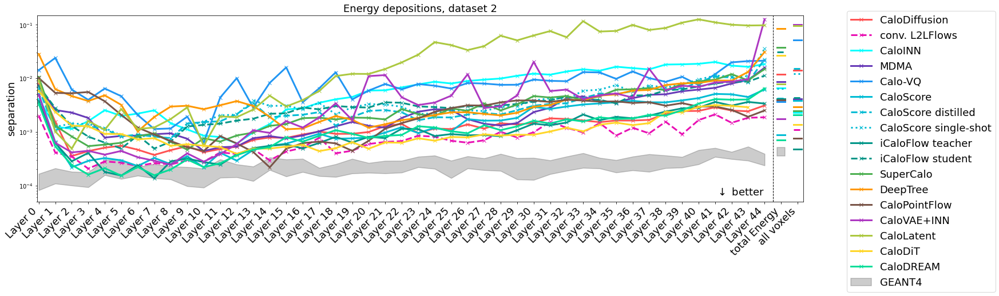

In [27]:
# energy depositions

plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45+2)

for entry in ds2['sep E layer'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan[:45], ds2['sep E layer'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    plt.plot([x_scan[45]-0.25, x_scan[45]+0.25], np.repeat([ds2['sep E total'].to_dict()[entry]], 2), marker=None, label="_please_dont", linewidth=3., **kwargs_dict[entry])
    plt.plot([x_scan[46]-0.25, x_scan[46]+0.25], np.repeat([ds2['sep cell'].to_dict()[entry]], 2), marker=None, label="_please_dont", linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds2['sep E layer'].to_dict(), 0)
plt.fill_between(x_scan[:45], geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])
geant_min, geant_max = get_min_max_from_dict(ds2['sep E total'].to_dict(), 0)
plt.fill_between([x_scan[45]-0.25, x_scan[45]+0.25], np.repeat([geant_min], 2), np.repeat([geant_max], 2), label="_please_dont", linewidth=1.5, **kwargs_dict[0])
geant_min, geant_max = get_min_max_from_dict(ds2['sep cell'].to_dict(), 0)
plt.fill_between([x_scan[46]-0.25, x_scan[46]+0.25], np.repeat([geant_min], 2), np.repeat([geant_max], 2), label="_please_dont", linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.35])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.ylim(5e-5,1.5e-1)
plt.gca().set_xticks(x_scan)
labels = [f'Layer {i}' for i in range(45)]
labels.append('total Energy')
labels.append('all voxels')
plt.gca().set_xticklabels(labels, rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Energy depositions, dataset 2", fontsize=FS)
plt.axvline(x = 44.5, color = 'k', linestyle='dashed', linewidth=1)
plt.text(44, 6e-5, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')

plt.savefig('results_fig/sep/ds2_depositions.pdf', dpi=300, bbox_inches='tight')
plt.show()
         


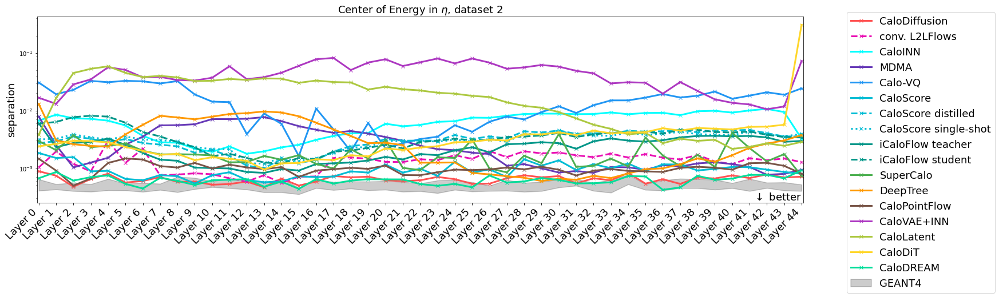

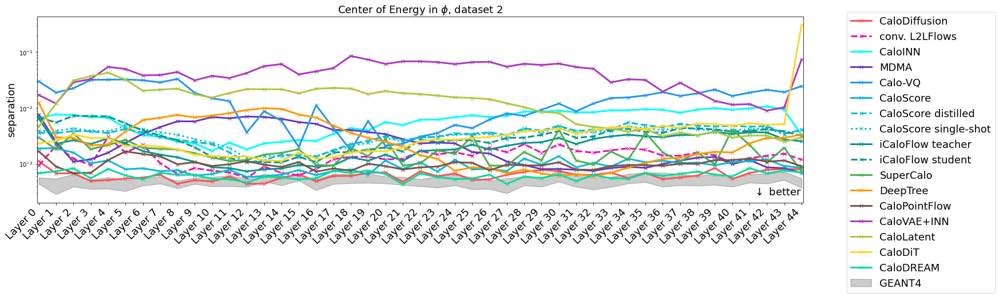

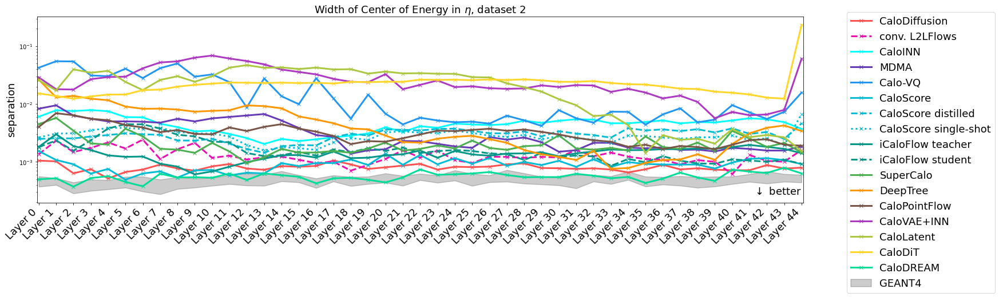

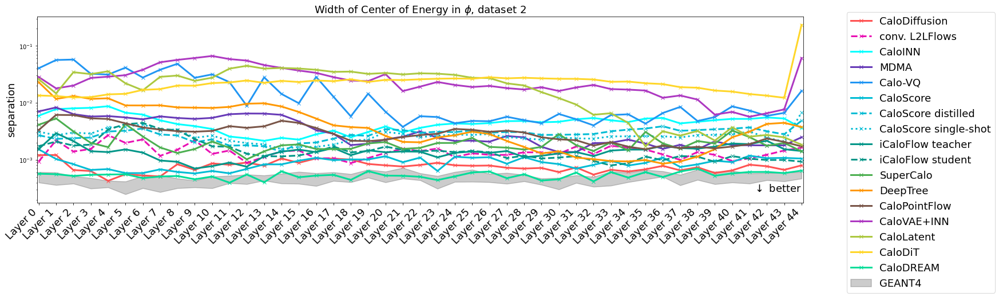

In [28]:
# EC and its width

plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45)

for entry in ds2['sep EC eta'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds2['sep EC eta'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds2['sep EC eta'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([f'Layer {i}' for i in range(45)], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Center of Energy in $\eta$, dataset 2", fontsize=FS)
plt.text(44, 2.5e-4, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')
plt.savefig('results_fig/sep/ds2_CE_eta.pdf', dpi=300, bbox_inches='tight')
plt.show()
          
          
plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45)

for entry in ds2['sep EC phi'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds2['sep EC phi'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds2['sep EC phi'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([f'Layer {i}' for i in range(45)], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Center of Energy in $\phi$, dataset 2", fontsize=FS)
plt.text(44, 2.5e-4, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')
plt.savefig('results_fig/sep/ds2_CE_phi.pdf', dpi=300, bbox_inches='tight')
plt.show()


plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45)

for entry in ds2['sep EC eta std'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds2['sep EC eta std'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds2['sep EC eta std'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([f'Layer {i}' for i in range(45)], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Width of Center of Energy in $\eta$, dataset 2", fontsize=FS)
plt.text(44, 2.5e-4, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')
plt.savefig('results_fig/sep/ds2_width_CE_eta.pdf', dpi=300, bbox_inches='tight')
plt.show()
          
          
plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45)

for entry in ds2['sep EC phi std'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds2['sep EC phi std'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds2['sep EC phi std'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([f'Layer {i}' for i in range(45)], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Width of Center of Energy in $\phi$, dataset 2", fontsize=FS)
plt.text(44, 2.5e-4, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')
plt.savefig('results_fig/sep/ds2_width_CE_phi.pdf', dpi=300, bbox_inches='tight')
plt.show()




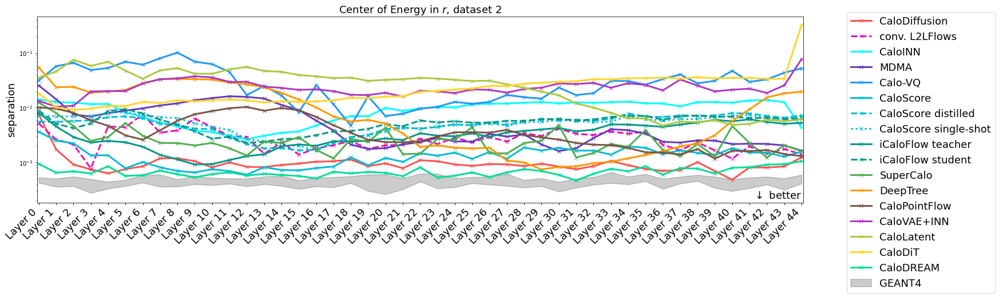

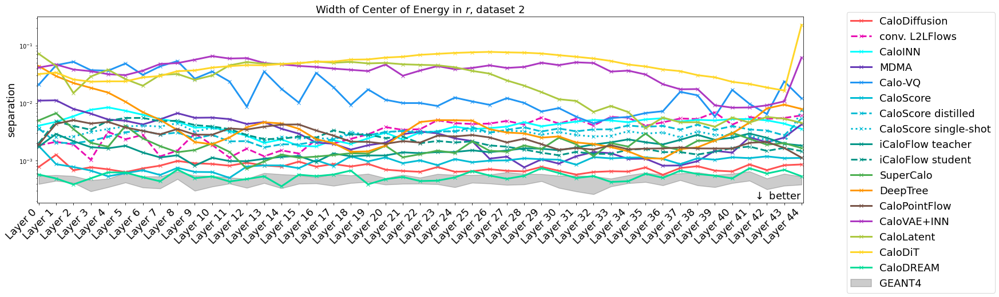

In [29]:
# EC and its width in r


plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45)

for entry in ds2['sep EC r'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds2['sep EC r'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds2['sep EC r'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([f'Layer {i}' for i in range(45)], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Center of Energy in $r$, dataset 2", fontsize=FS)
plt.text(44, 2e-4, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')
plt.savefig('results_fig/sep/ds2_CE_r.pdf', dpi=300, bbox_inches='tight')
plt.show()


plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45)

for entry in ds2['sep EC r std'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds2['sep EC r std'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds2['sep EC r std'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([f'Layer {i}' for i in range(45)], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Width of Center of Energy in $r$, dataset 2", fontsize=FS)
plt.text(44, 2e-4, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')
plt.savefig('results_fig/sep/ds2_width_CE_r.pdf', dpi=300, bbox_inches='tight')
plt.show()



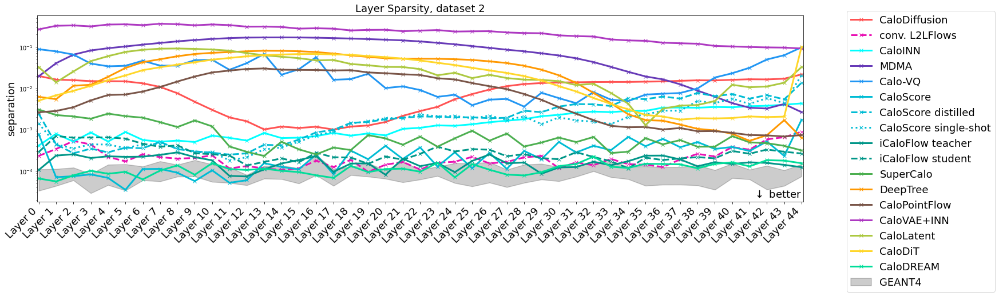

In [30]:
# layer sparsities

plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45)

for entry in ds2['sep sparsity'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds2['sep sparsity'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds2['sep sparsity'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([f'Layer {i}' for i in range(45)], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Layer Sparsity, dataset 2", fontsize=FS)
plt.text(44, 2e-5, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')
plt.savefig('results_fig/sep/ds2_sparsity.pdf', dpi=300, bbox_inches='tight')
plt.show()


working on submission 0
[[0.44638143 0.45953024 0.48697984 ... 0.70986237 0.71786247 1.        ]
 [0.46644926 0.47267474 0.50223799 ... 0.76713472 1.         0.71786247]
 [0.46799577 0.47705359 0.50437986 ... 1.         0.76713472 0.70986237]
 ...
 [0.7453869  0.83599169 1.         ... 0.50437986 0.50223799 0.48697984]
 [0.73546163 1.         0.83599169 ... 0.47705359 0.47267474 0.45953024]
 [1.         0.73546163 0.7453869  ... 0.46799577 0.46644926 0.44638143]]


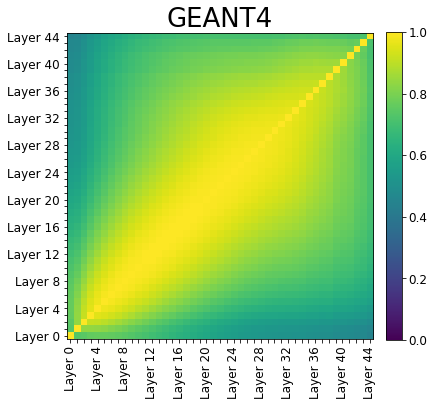

working on submission 1
[[0.41749897 0.45847193 0.49435845 ... 0.71044092 0.71851431 1.        ]
 [0.43456852 0.47571645 0.51467009 ... 0.75799457 1.         0.71851431]
 [0.44012282 0.47834071 0.52194924 ... 1.         0.75799457 0.71044092]
 ...
 [0.68435201 0.79197575 1.         ... 0.52194924 0.51467009 0.49435845]
 [0.65759441 1.         0.79197575 ... 0.47834071 0.47571645 0.45847193]
 [1.         0.65759441 0.68435201 ... 0.44012282 0.43456852 0.41749897]]


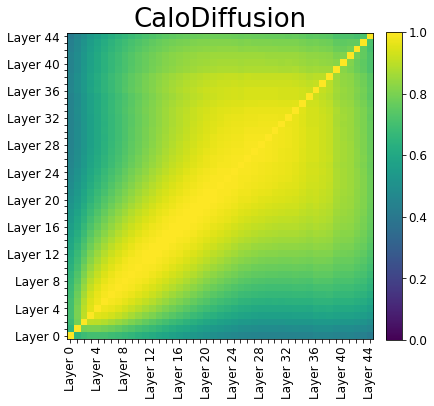

working on submission 3
[[0.43211787 0.43700333 0.46940746 ... 0.58429157 0.58109757 1.        ]
 [0.4680089  0.4738511  0.5076484  ... 0.67626387 1.         0.58109757]
 [0.49190705 0.49611043 0.53402557 ... 1.         0.67626387 0.58429157]
 ...
 [0.73726536 0.82056339 1.         ... 0.53402557 0.5076484  0.46940746]
 [0.7226824  1.         0.82056339 ... 0.49611043 0.4738511  0.43700333]
 [1.         0.7226824  0.73726536 ... 0.49190705 0.4680089  0.43211787]]


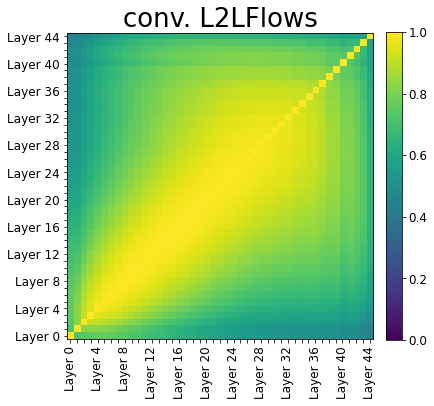

working on submission 4
[[0.53105799 0.56560012 0.58955125 ... 0.78289581 0.80777502 1.        ]
 [0.54404905 0.57737995 0.60438811 ... 0.80927188 1.         0.80777502]
 [0.54560855 0.57974068 0.604321   ... 1.         0.80927188 0.78289581]
 ...
 [0.74655869 0.85053925 1.         ... 0.604321   0.60438811 0.58955125]
 [0.74443276 1.         0.85053925 ... 0.57974068 0.57737995 0.56560012]
 [1.         0.74443276 0.74655869 ... 0.54560855 0.54404905 0.53105799]]


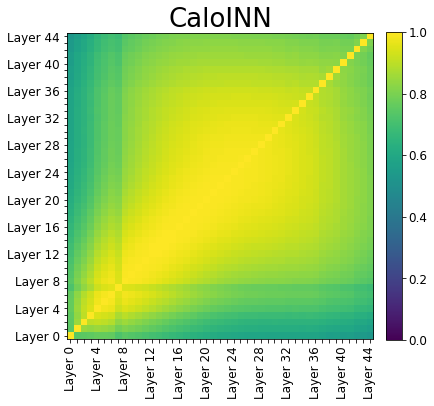

working on submission 5
[[0.37246869 0.36741345 0.39305574 ... 0.45541864 0.40155141 1.        ]
 [0.39682838 0.38948036 0.41795633 ... 0.52304886 1.         0.40155141]
 [0.44001594 0.42608942 0.46382327 ... 1.         0.52304886 0.45541864]
 ...
 [0.77783586 0.87554978 1.         ... 0.46382327 0.41795633 0.39305574]
 [0.77943135 1.         0.87554978 ... 0.42608942 0.38948036 0.36741345]
 [1.         0.77943135 0.77783586 ... 0.44001594 0.39682838 0.37246869]]


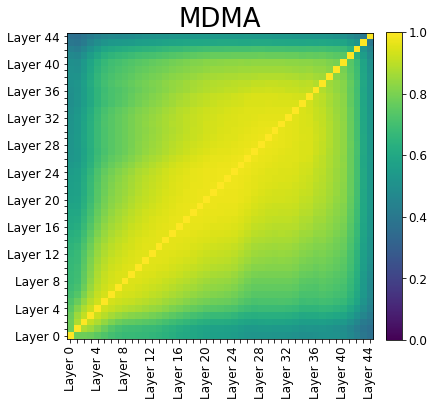

working on submission 7
[[0.60488389 0.60124228 0.5911063  ... 0.86525413 0.87509293 1.        ]
 [0.60229688 0.59891387 0.58681496 ... 0.87617401 1.         0.87509293]
 [0.62325381 0.61823212 0.6087225  ... 1.         0.87617401 0.86525413]
 ...
 [0.77656476 0.85986841 1.         ... 0.6087225  0.58681496 0.5911063 ]
 [0.80695409 1.         0.85986841 ... 0.61823212 0.59891387 0.60124228]
 [1.         0.80695409 0.77656476 ... 0.62325381 0.60229688 0.60488389]]


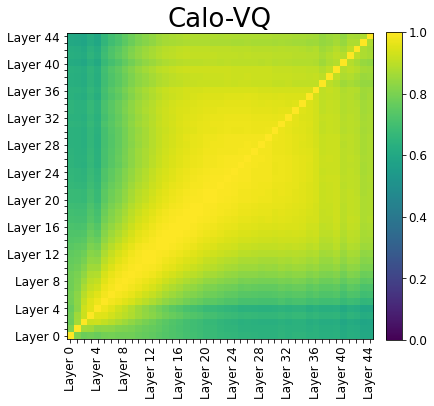

working on submission 8
[[0.47566613 0.49009816 0.51783236 ... 0.74567396 0.77590444 1.        ]
 [0.49868321 0.51192526 0.54550987 ... 0.79521868 1.         0.77590444]
 [0.50779136 0.52162412 0.55395611 ... 1.         0.79521868 0.74567396]
 ...
 [0.74283345 0.83467098 1.         ... 0.55395611 0.54550987 0.51783236]
 [0.73590621 1.         0.83467098 ... 0.52162412 0.51192526 0.49009816]
 [1.         0.73590621 0.74283345 ... 0.50779136 0.49868321 0.47566613]]


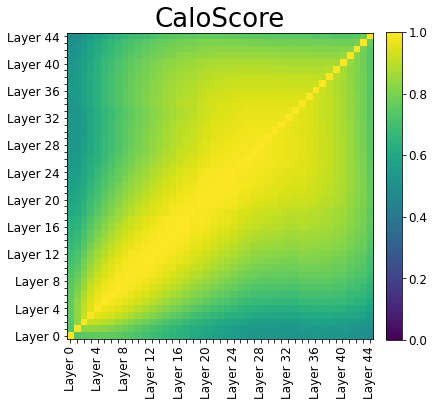

working on submission 9
[[0.41275902 0.42306598 0.44814036 ... 0.52260598 0.62450167 1.        ]
 [0.4298873  0.44145323 0.47112787 ... 0.54356293 1.         0.62450167]
 [0.38366536 0.39371287 0.41775884 ... 1.         0.54356293 0.52260598]
 ...
 [0.74896665 0.83850995 1.         ... 0.41775884 0.47112787 0.44814036]
 [0.75722448 1.         0.83850995 ... 0.39371287 0.44145323 0.42306598]
 [1.         0.75722448 0.74896665 ... 0.38366536 0.4298873  0.41275902]]


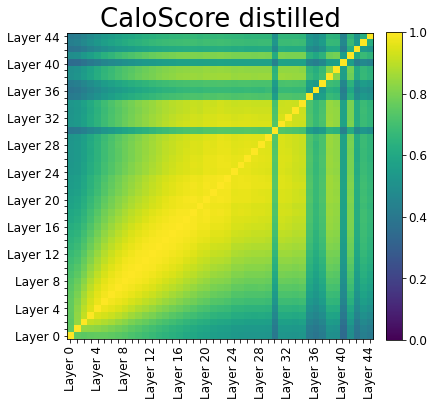

working on submission 10
[[0.41332676 0.42635956 0.45215    ... 0.54994364 0.64466844 1.        ]
 [0.42301785 0.43861054 0.46895661 ... 0.56070782 1.         0.64466844]
 [0.37632218 0.39121578 0.4164725  ... 1.         0.56070782 0.54994364]
 ...
 [0.73787284 0.8299086  1.         ... 0.4164725  0.46895661 0.45215   ]
 [0.74350172 1.         0.8299086  ... 0.39121578 0.43861054 0.42635956]
 [1.         0.74350172 0.73787284 ... 0.37632218 0.42301785 0.41332676]]


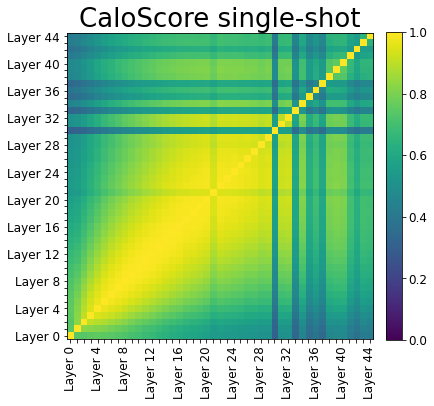

working on submission 13
[[0.42731297 0.45825766 0.4829642  ... 0.65555689 0.6513959  1.        ]
 [0.43651366 0.469883   0.49694719 ... 0.71404657 1.         0.6513959 ]
 [0.4614738  0.50051075 0.53069369 ... 1.         0.71404657 0.65555689]
 ...
 [0.69295575 0.82081516 1.         ... 0.53069369 0.49694719 0.4829642 ]
 [0.68569065 1.         0.82081516 ... 0.50051075 0.469883   0.45825766]
 [1.         0.68569065 0.69295575 ... 0.4614738  0.43651366 0.42731297]]


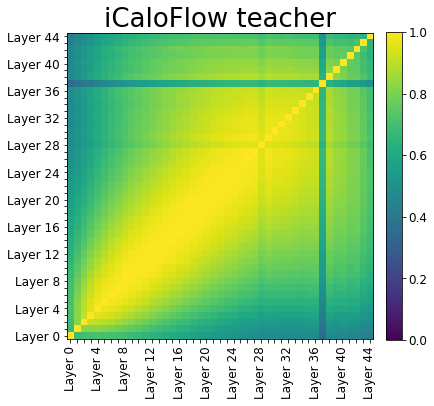

working on submission 14
[[0.41124793 0.45093273 0.48457096 ... 0.62469029 0.64614593 1.        ]
 [0.4406499  0.48669152 0.51918575 ... 0.70144017 1.         0.64614593]
 [0.44026834 0.48589354 0.52024832 ... 1.         0.70144017 0.62469029]
 ...
 [0.6850615  0.81145126 1.         ... 0.52024832 0.51918575 0.48457096]
 [0.67373435 1.         0.81145126 ... 0.48589354 0.48669152 0.45093273]
 [1.         0.67373435 0.6850615  ... 0.44026834 0.4406499  0.41124793]]


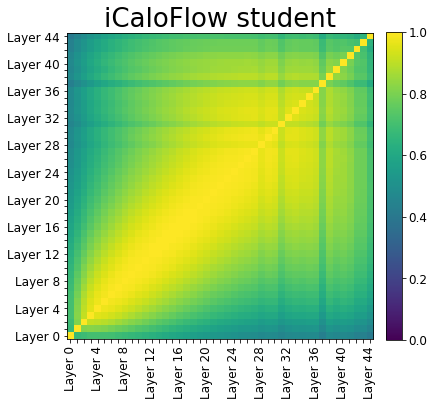

working on submission 15
[[0.45085463 0.45127713 0.46171869 ... 0.59227868 0.56145365 1.        ]
 [0.48253166 0.48012828 0.48727301 ... 0.62974856 1.         0.56145365]
 [0.52616044 0.5251555  0.53290664 ... 1.         0.62974856 0.59227868]
 ...
 [0.74347607 0.84665023 1.         ... 0.53290664 0.48727301 0.46171869]
 [0.73146848 1.         0.84665023 ... 0.5251555  0.48012828 0.45127713]
 [1.         0.73146848 0.74347607 ... 0.52616044 0.48253166 0.45085463]]


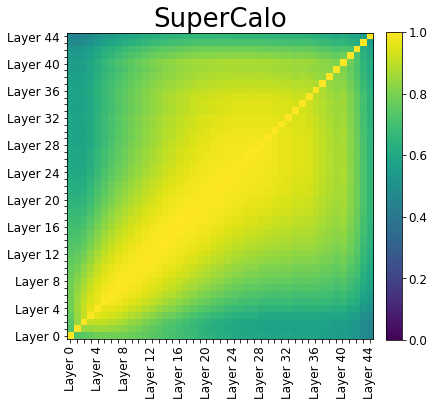

working on submission 22
[[0.27381301 0.37538279 0.40198588 ... 0.78079272 0.81138791 1.        ]
 [0.30544521 0.42791589 0.45763436 ... 0.85644072 1.         0.81138791]
 [0.32083637 0.45849894 0.49493301 ... 1.         0.85644072 0.78079272]
 ...
 [0.47673397 0.79676201 1.         ... 0.49493301 0.45763436 0.40198588]
 [0.51995856 1.         0.79676201 ... 0.45849894 0.42791589 0.37538279]
 [1.         0.51995856 0.47673397 ... 0.32083637 0.30544521 0.27381301]]


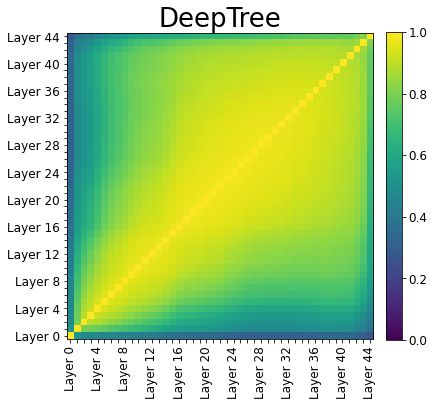

working on submission 23
[[0.33176274 0.13958476 0.28250017 ... 0.469715   0.16989861 1.        ]
 [0.17616981 0.07587644 0.15092348 ... 0.24311283 1.         0.16989861]
 [0.54054516 0.22899907 0.45950633 ... 1.         0.24311283 0.469715  ]
 ...
 [0.49528776 0.21605107 1.         ... 0.45950633 0.15092348 0.28250017]
 [0.24190136 1.         0.21605107 ... 0.22899907 0.07587644 0.13958476]
 [1.         0.24190136 0.49528776 ... 0.54054516 0.17616981 0.33176274]]


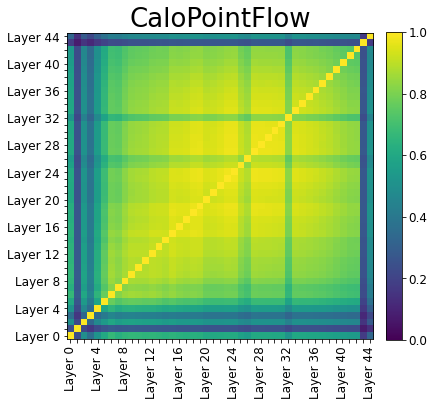

working on submission 27
[[0.42147298 0.43481116 0.46860467 ... 0.72471972 0.78168863 1.        ]
 [0.48615622 0.50695594 0.54262851 ... 0.79344513 1.         0.78168863]
 [0.50389844 0.52827683 0.56666281 ... 1.         0.79344513 0.72471972]
 ...
 [0.70883016 0.82340041 1.         ... 0.56666281 0.54262851 0.46860467]
 [0.71233755 1.         0.82340041 ... 0.52827683 0.50695594 0.43481116]
 [1.         0.71233755 0.70883016 ... 0.50389844 0.48615622 0.42147298]]


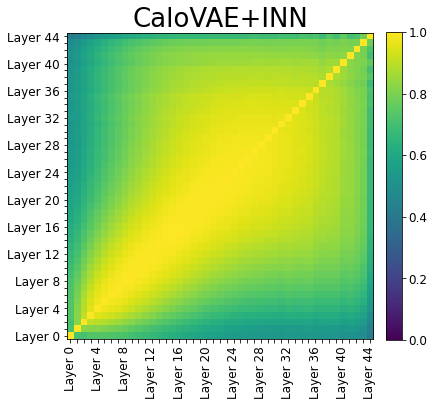

working on submission 30
[[0.11201172 0.12383148 0.13394228 ... 0.12351032 0.10302759 1.        ]
 [0.25015024 0.26995169 0.29108443 ... 0.28922638 1.         0.10302759]
 [0.31416198 0.35529492 0.37704539 ... 1.         0.28922638 0.12351032]
 ...
 [0.76960719 0.87460188 1.         ... 0.37704539 0.29108443 0.13394228]
 [0.75624661 1.         0.87460188 ... 0.35529492 0.26995169 0.12383148]
 [1.         0.75624661 0.76960719 ... 0.31416198 0.25015024 0.11201172]]


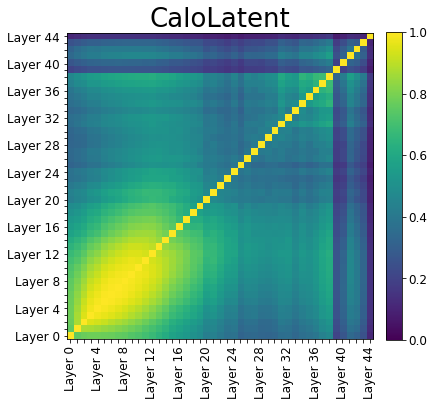

working on submission 32
[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   0.00000000e+00  1.00000000e+00]
 [-1.02622941e-04  1.27165710e-02  1.27939051e-03 ...  8.50674030e-01
   1.00000000e+00  0.00000000e+00]
 [ 3.14917907e-04  1.28884192e-02  2.75854476e-03 ...  1.00000000e+00
   8.50674030e-01  0.00000000e+00]
 ...
 [ 4.82118531e-04  6.54771779e-04  1.00000000e+00 ...  2.75854476e-03
   1.27939051e-03  0.00000000e+00]
 [ 7.77347157e-01  1.00000000e+00  6.54771779e-04 ...  1.28884192e-02
   1.27165710e-02  0.00000000e+00]
 [ 1.00000000e+00  7.77347157e-01  4.82118531e-04 ...  3.14917907e-04
  -1.02622941e-04  0.00000000e+00]]


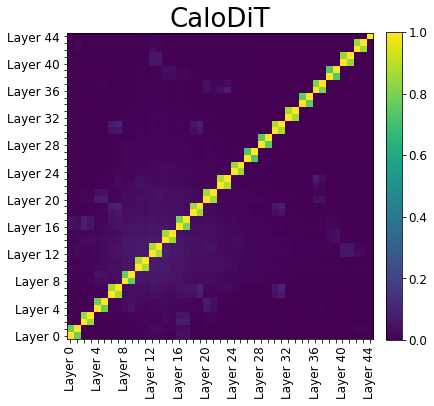

working on submission 33
[[0.4584154  0.46439353 0.48845208 ... 0.70126982 0.73920323 1.        ]
 [0.49921809 0.50549965 0.5341463  ... 0.77151573 1.         0.73920323]
 [0.50571117 0.51346106 0.54106147 ... 1.         0.77151573 0.70126982]
 ...
 [0.74316727 0.83468031 1.         ... 0.54106147 0.5341463  0.48845208]
 [0.73398522 1.         0.83468031 ... 0.51346106 0.50549965 0.46439353]
 [1.         0.73398522 0.74316727 ... 0.50571117 0.49921809 0.4584154 ]]


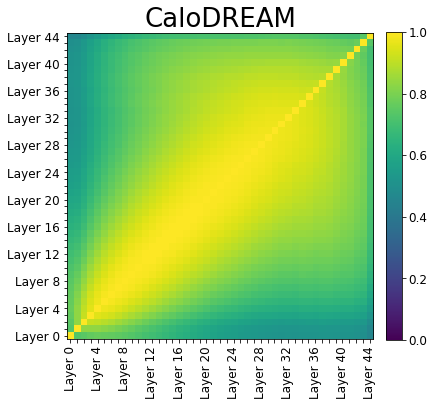

In [31]:
# layer correlations based on 2406.12898

for iter_id, submission_id in enumerate(ds2['PCC Layer Energies'].to_dict()):
    plt.figure(figsize=(6,6), facecolor='white')
    print(f"working on submission {submission_id}")
    labels = [f'Layer {i}' for i in range(45)]
    E_corr = np.array(ds2['PCC Layer Energies'].to_dict()[submission_id]).astype(float)
    print(E_corr)
    plot_corr(E_corr, id_dict[submission_id], labels, f'results_fig/corr/ds2_{submission_id}.pdf', ds1=False)


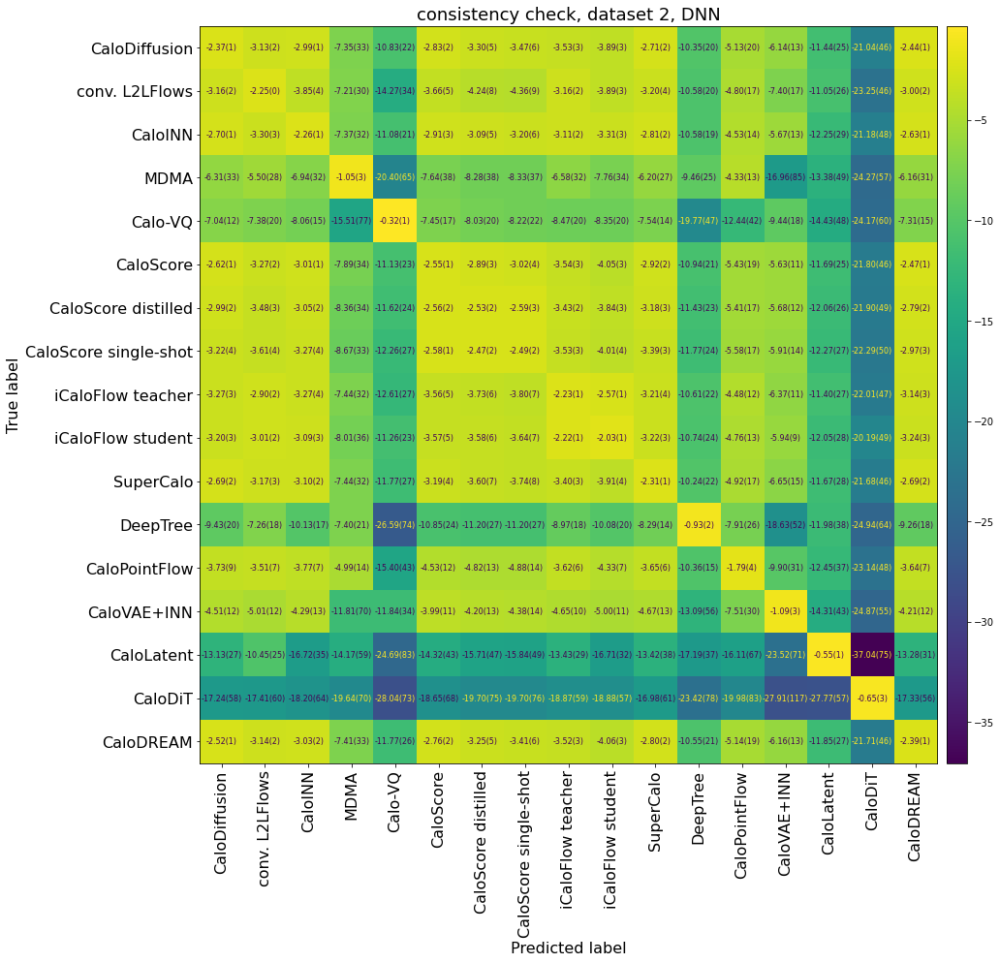

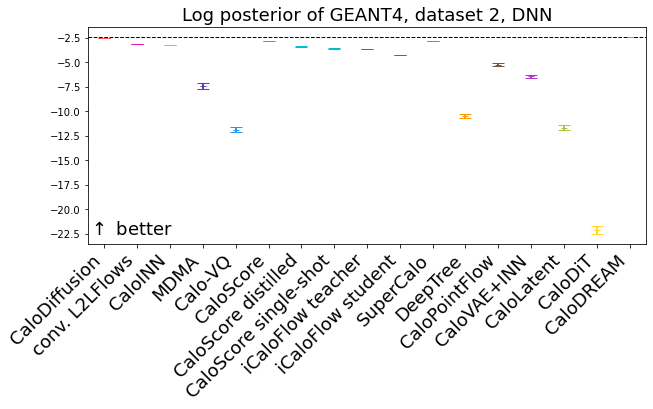

In [32]:
# multiclass classifier

log_post_by_model = []
log_post_by_model_std = []
label = []
for entry in ds2['multi cls CC'].to_dict():
    if entry == 0:
        continue
    log_post_by_model.append(ds2['multi cls CC'].to_dict()[entry])
    log_post_by_model_std.append(ds2['multi cls CC std'].to_dict()[entry])
    label.append(id_dict[entry])

log_post_by_model = np.array(log_post_by_model).astype(float)    
log_post_by_model_std = np.array(log_post_by_model_std).astype(float)    
    
plt.figure(figsize=(14,14))
disp = ConfusionMatrixDisplayError(confusion_matrix=log_post_by_model, 
                              display_labels=label, errors=log_post_by_model_std)
disp.plot(xticks_rotation='vertical', ax=plt.gca(), colorbar=False, values_format=".2f", include_errors=True, text_kw={'fontsize': 8})
plt.title(f"consistency check, dataset 2, DNN", fontsize=FS)
cax = plt.gcf().add_axes([plt.gca().get_position().x1+0.01,plt.gca().get_position().y0,0.02,plt.gca().get_position().height])
plt.colorbar(disp.im_,  cax=cax)
plt.savefig(f'results_fig/cls/ds2_confusion.pdf', dpi=300, bbox_inches='tight')
plt.show()

log_truth = []
log_truth_std = []
color = []
for entry in ds2['multi cls'].to_dict():
    if entry == 0:
        continue
    log_truth.append(ds2['multi cls'].to_dict()[entry])
    log_truth_std.append(ds2['multi cls std'].to_dict()[entry])
    color.append(kwargs_dict[entry]['color'])

log_truth = np.array(log_truth).astype(float)    
log_truth_std = np.array(log_truth_std).astype(float)    

plt.figure(figsize=(10,4))
for x, y, yerr, col in zip(np.arange(len(label)), log_truth, log_truth_std, color):
    plt.errorbar(x, y, yerr=yerr, elinewidth=2, marker='_', capsize=6, linestyle='None', color=col)
#plt.errorbar(np.arange(len(label)), log_truth, yerr=log_truth_std, elinewidth=2, marker='_', capsize=6, linestyle='None')
plt.hlines(np.max(log_truth), xmin=-1, xmax=len(label), color = 'k', linestyle='dashed', linewidth=1)
plt.xlim(-0.5, len(label)-0.5)
plt.title(f"Log posterior of GEANT4, dataset 2, DNN", fontsize=FS)
plt.gca().set_xticks(np.arange(len(label)))
plt.gca().set_xticklabels(label, rotation=45, ha='right', fontsize=FS)
plt.text(-0.5, -23., r"$\uparrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/cls/ds2_truth.pdf', dpi=300, bbox_inches='tight')
plt.show()


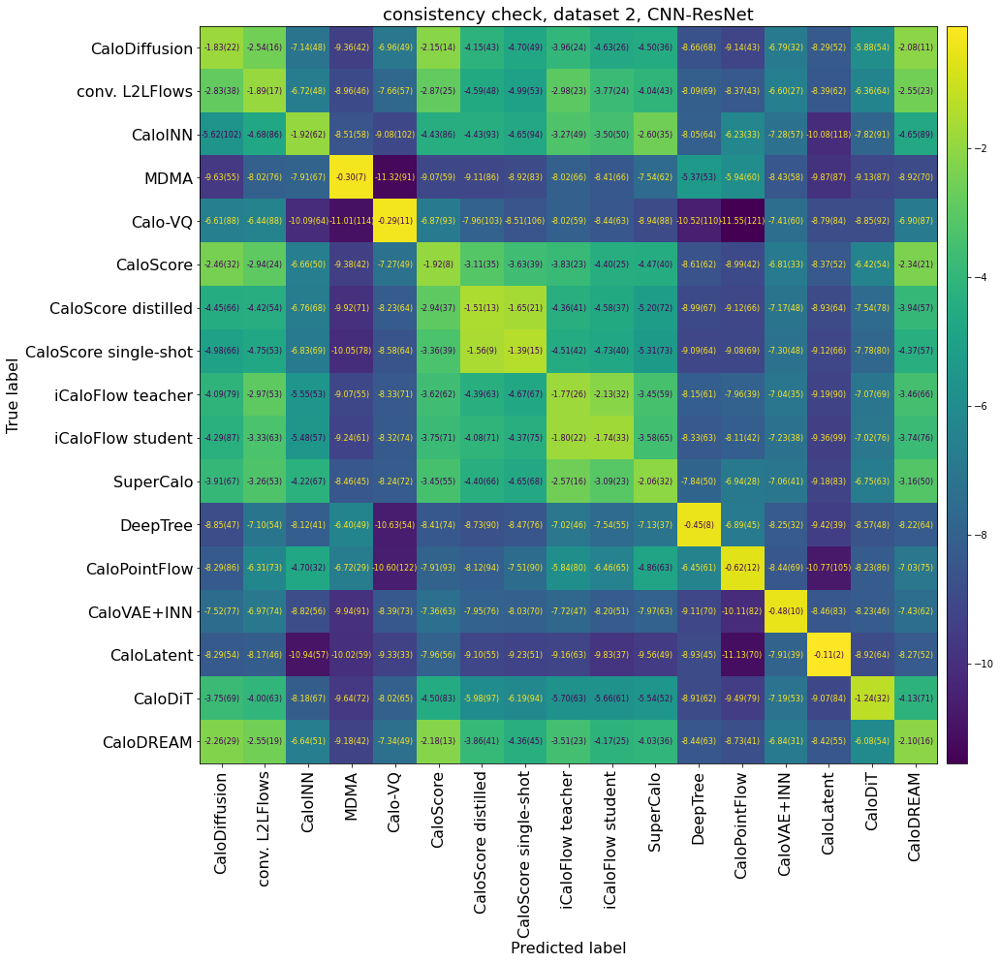

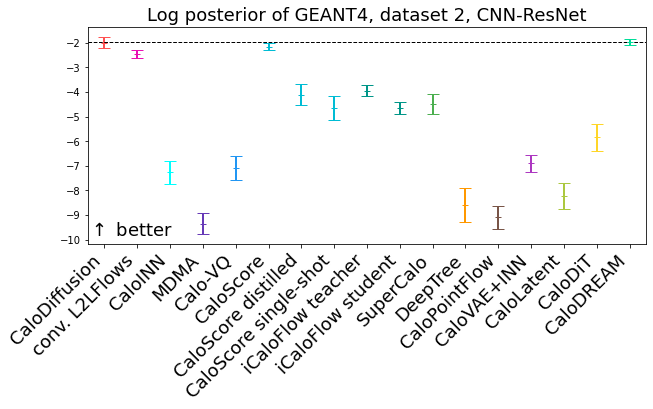

In [33]:
# multiclass classifier

log_post_by_model = []
log_post_by_model_std = []
label = []
for entry in ds2['multi cls cnn CC'].to_dict():
    if entry == 0:
        continue
    log_post_by_model.append(ds2['multi cls cnn CC'].to_dict()[entry])
    log_post_by_model_std.append(ds2['multi cls cnn CC std'].to_dict()[entry])
    label.append(id_dict[entry])

log_post_by_model = np.array(log_post_by_model).astype(float)    
log_post_by_model_std = np.array(log_post_by_model_std).astype(float)    
    
plt.figure(figsize=(14,14))
disp = ConfusionMatrixDisplayError(confusion_matrix=log_post_by_model, 
                              display_labels=label, errors=log_post_by_model_std)
disp.plot(xticks_rotation='vertical', ax=plt.gca(), colorbar=False, values_format=".2f", include_errors=True, text_kw={'fontsize': 8})
plt.title(f"consistency check, dataset 2, CNN-ResNet", fontsize=FS)
cax = plt.gcf().add_axes([plt.gca().get_position().x1+0.01,plt.gca().get_position().y0,0.02,plt.gca().get_position().height])
plt.colorbar(disp.im_,  cax=cax)
plt.savefig(f'results_fig/cls/ds2_ResNet_confusion.pdf', dpi=300, bbox_inches='tight')
plt.show()

log_truth = []
log_truth_std = []
color = []
for entry in ds2['multi cls cnn'].to_dict():
    if entry == 0:
        continue
    log_truth.append(ds2['multi cls cnn'].to_dict()[entry])
    log_truth_std.append(ds2['multi cls cnn std'].to_dict()[entry])
    color.append(kwargs_dict[entry]['color'])


log_truth = np.array(log_truth).astype(float)    
log_truth_std = np.array(log_truth_std).astype(float)    

plt.figure(figsize=(10,4))
for x, y, yerr, col in zip(np.arange(len(label)), log_truth, log_truth_std, color):
    plt.errorbar(x, y, yerr=yerr, elinewidth=2, marker='_', capsize=6, linestyle='None', color=col)
#plt.errorbar(np.arange(len(label)), log_truth, yerr=log_truth_std, elinewidth=2, marker='_', capsize=6, linestyle='None')
plt.hlines(np.max(log_truth), xmin=-1, xmax=len(label), color = 'k', linestyle='dashed', linewidth=1)
plt.xlim(-0.5, len(label)-0.5)
plt.title(f"Log posterior of GEANT4, dataset 2, CNN-ResNet", fontsize=FS)
plt.gca().set_xticks(np.arange(len(label)))
plt.gca().set_xticklabels(label, rotation=45, ha='right', fontsize=FS)
plt.text(-0.5, -10., r"$\uparrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/cls/ds2_ResNet_truth.pdf', dpi=300, bbox_inches='tight')
plt.show()


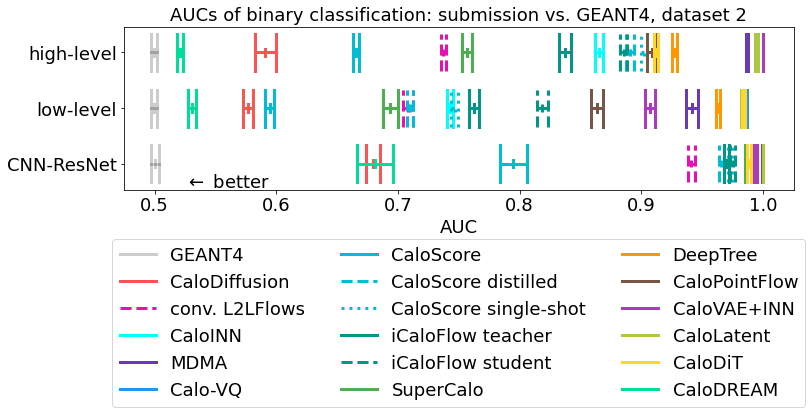

In [34]:
# binary AUCs

plt.figure(figsize=(12,3), facecolor='white')

for run_id, entry in enumerate(ds2['binary cls low'].to_dict()):
    plot_with_errors([ds2['binary cls high'].to_dict()[entry], 2.5], ds2['binary cls high std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds2['binary cls low'].to_dict()[entry], 1.75], ds2['binary cls low std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])
    plot_with_errors([ds2['binary cls cnn'].to_dict()[entry], 1.], ds2['binary cls cnn std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])

plt.xlim([0.475, 1.025])
plt.xlabel('AUC', fontsize=FS)
plt.legend(bbox_to_anchor=(0.5, -0.25), fontsize=FS, ncol=3, loc='upper center')
plt.title(f"AUCs of binary classification: submission vs. GEANT4, dataset 2", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75, 2.5])
plt.gca().set_yticklabels(['CNN-ResNet', 'low-level', 'high-level'], ha='right', fontsize=FS)
plt.text(0.525, 0.75, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/cls/ds2_binary_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()

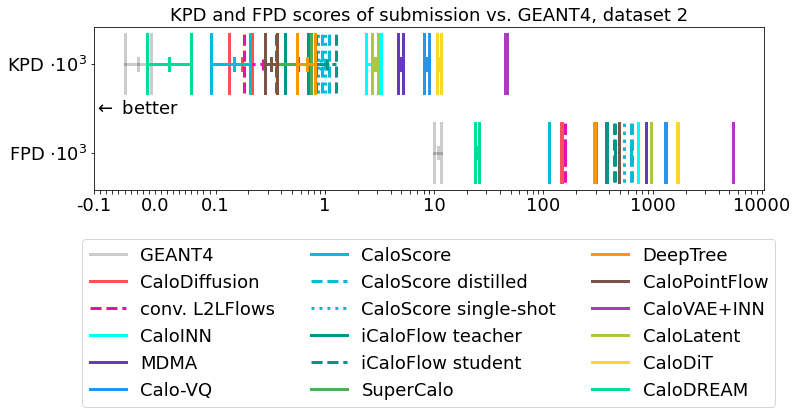

In [35]:
# KPD/FPD

symlog_ticks = [-0.1, *[-0.1+0.01* i for i in range(1,10)], *[0.01* i for i in range(10)],*[0.1*i for i in range(1,10)],*[i for i in range(1,10)],*[10*i for i in range(1,10)],*[100*i for i in range(1,10)], *[1000*i for i in range(1,11)]]
symlog_labels = []
for tick in symlog_ticks:
    if tick in [-0.1, 0., 0.1, 1., 10, 100, 1000, 10000]:
        symlog_labels.append(str(tick))
    else:
        symlog_labels.append('')

plt.figure(figsize=(12,3), facecolor='white')

for run_id, entry in enumerate(ds2['KPD * 1e3'].to_dict()):
    plot_with_errors([ds2['KPD * 1e3'].to_dict()[entry], 1.75], ds2['KPD * 1e3 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds2['FPD * 1e3'].to_dict()[entry], 1.], ds2['FPD * 1e3 std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('symlog', linthresh=0.1, linscale=0.5)
plt.legend(bbox_to_anchor=(0.5, -0.25), fontsize=FS, ncol=3, loc='upper center')
plt.title(f"KPD and FPD scores of submission vs. GEANT4, dataset 2", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75])
plt.gca().set_yticklabels([r'FPD $\cdot 10^{3}$', r'KPD $\cdot 10^{3}$'], ha='right', fontsize=FS)
plt.gca().set_xticks(symlog_ticks)
plt.gca().set_xticklabels(symlog_labels)
plt.text(-0.1, 1.375, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/cls/ds2_KPD_FPD.pdf', dpi=300, bbox_inches='tight')
plt.show()

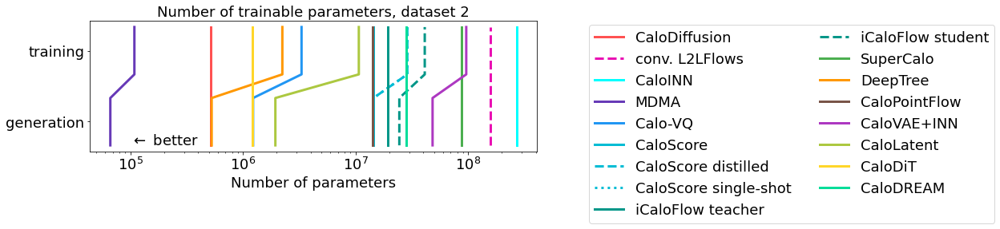

In [36]:
# number of parameters

connected = True

plt.figure(figsize=(10,3), facecolor='white')

for run_id, entry in enumerate(ds2['Parameters training'].to_dict()):
    if entry == 0:
        continue
    if not connected:
        plt.plot(np.repeat(ds2['Parameters generation'].to_dict()[entry], 2), [0.75, 1.25], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])
        plt.plot(np.repeat(ds2['Parameters training'].to_dict()[entry], 2), [1.5, 2.], marker=None, label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    else:
        plt.plot([*np.repeat(ds2['Parameters generation'].to_dict()[entry], 2), *np.repeat(ds2['Parameters training'].to_dict()[entry], 2)], [0.75, 1.25, 1.5, 2.], marker=None, label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

    
plt.xscale('log')
plt.xlabel('Number of parameters', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Number of trainable parameters, dataset 2", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75])
plt.gca().set_yticklabels(['generation', 'training'], ha='right', fontsize=FS)
plt.text(1e5, 0.8, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/ds2_num_param.pdf', dpi=300, bbox_inches='tight')
plt.show()

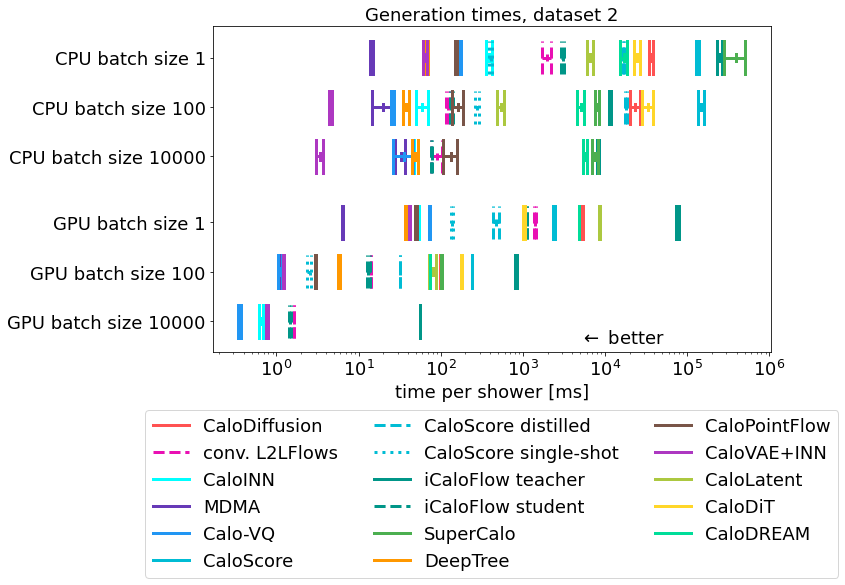

In [37]:
# timings

plt.figure(figsize=(10,6), facecolor='white')

for run_id, entry in enumerate(ds2['time CPU 1'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors([ds2['time CPU 1'].to_dict()[entry], 5.], ds2['time CPU 1 std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])
    plot_with_errors([ds2['time CPU 100'].to_dict()[entry], 4.25], ds2['time CPU 100 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds2['time CPU 10000'].to_dict()[entry], 3.5], ds2['time CPU 10000 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds2['time GPU 1'].to_dict()[entry], 2.5], ds2['time GPU 1 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds2['time GPU 100'].to_dict()[entry], 1.75], ds2['time GPU 100 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds2['time GPU 10000'].to_dict()[entry], 1.], ds2['time GPU 10000 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])

plt.xscale('log')
plt.xlabel('time per shower [ms]', fontsize=FS)
plt.legend(bbox_to_anchor=(0.5, -0.15), fontsize=FS, ncol=3, loc='upper center')
plt.title(f"Generation times, dataset 2", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75, 2.5, 3.5, 4.25, 5.])
plt.gca().set_yticklabels(['GPU batch size 10000', 'GPU batch size 100', 'GPU batch size 1','CPU batch size 10000', 'CPU batch size 100', 'CPU batch size 1'], ha='right', fontsize=FS)
plt.text(5e3, .75, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/time/ds2.pdf', dpi=300, bbox_inches='tight')
plt.show()


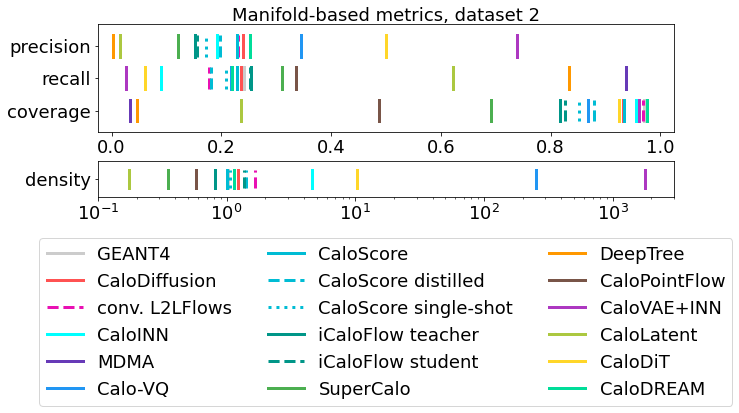

In [38]:
# manifold based metrics

fig, axs = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]},figsize=(10,3), facecolor='white')

for run_id, entry in enumerate(ds2['precision'].to_dict()):
    axs[0].plot(np.repeat(ds2['precision'].to_dict()[entry], 2), [2.25, 2.75], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])
    axs[0].plot(np.repeat(ds2['recall'].to_dict()[entry], 2), [1.5, 2.], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])
    axs[0].plot(np.repeat(ds2['coverage'].to_dict()[entry], 2), [0.75, 1.25], marker=None, label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    axs[1].plot(np.repeat(ds2['density'].to_dict()[entry], 2), [0., 0.5], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])

axs[0].set_xlim([-0.025, 1.025])
axs[0].set_ylim([0.5, 3.])
axs[0].set_yticks([1,1.75, 2.5])
axs[0].set_yticklabels(['coverage', 'recall', 'precision'], ha='right', fontsize=FS)
axs[0].xaxis.set_tick_params(labelsize=FS)

axs[1].set_xlim([0.1, 3e3])
axs[1].set_ylim([-0.25,0.75])
axs[1].set_xscale('log')
axs[1].set_yticks([0.25])
axs[1].set_yticklabels(['density'], ha='right', fontsize=FS)
axs[1].xaxis.set_tick_params(labelsize=FS)

fig.legend(bbox_to_anchor=(0.5, -0.05), fontsize=FS, ncol=3, loc='upper center')

fig.suptitle(f"Manifold-based metrics, dataset 2", fontsize=FS)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.savefig(f'results_fig/man/ds2.pdf', dpi=300, bbox_inches='tight')
plt.show()


### dataset 3

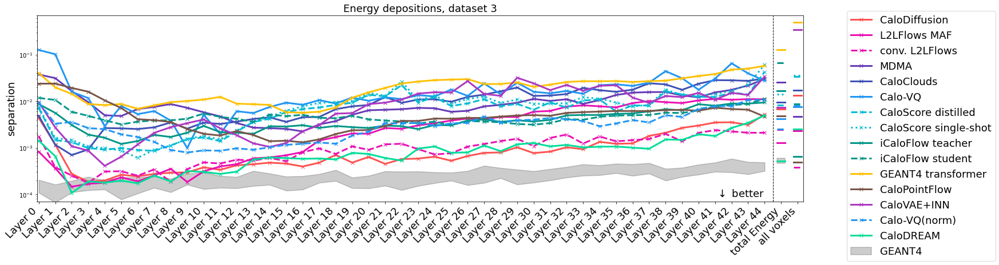

In [39]:
# energy depositions

plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45+2)

for entry in ds3['sep E layer'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan[:45], ds3['sep E layer'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    plt.plot([x_scan[45]-0.25, x_scan[45]+0.25], np.repeat([ds3['sep E total'].to_dict()[entry]], 2), marker=None, label="_please_dont", linewidth=3., **kwargs_dict[entry])
    plt.plot([x_scan[46]-0.25, x_scan[46]+0.25], np.repeat([ds3['sep cell'].to_dict()[entry]], 2), marker=None, label="_please_dont", linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds3['sep E layer'].to_dict(), 0)
plt.fill_between(x_scan[:45], geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])
geant_min, geant_max = get_min_max_from_dict(ds3['sep E total'].to_dict(), 0)
plt.fill_between([x_scan[45]-0.25, x_scan[45]+0.25], np.repeat([geant_min], 2), np.repeat([geant_max], 2), label="_please_dont", linewidth=1.5, **kwargs_dict[0])
geant_min, geant_max = get_min_max_from_dict(ds3['sep cell'].to_dict(), 0)
plt.fill_between([x_scan[46]-0.25, x_scan[46]+0.25], np.repeat([geant_min], 2), np.repeat([geant_max], 2), label="_please_dont", linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.35])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.ylim(7e-5, 7e-1)
plt.gca().set_xticks(x_scan)
labels = [f'Layer {i}' for i in range(45)]
labels.append('total Energy')
labels.append('all voxels')
plt.gca().set_xticklabels(labels, rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Energy depositions, dataset 3", fontsize=FS)
plt.axvline(x = 44.5, color = 'k', linestyle='dashed', linewidth=1)
plt.text(44, 8e-5, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')

plt.savefig('results_fig/sep/ds3_depositions.pdf', dpi=300, bbox_inches='tight')
plt.show()


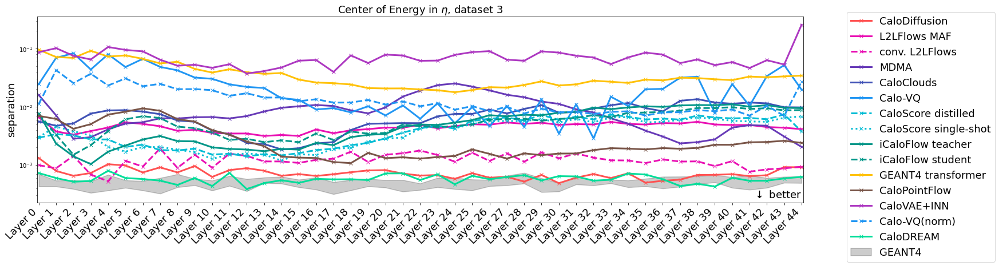

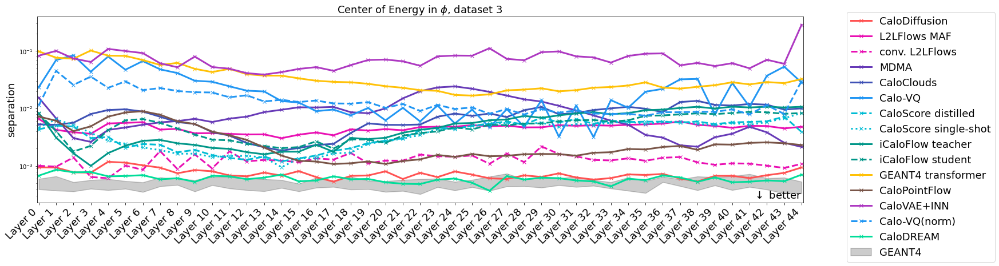

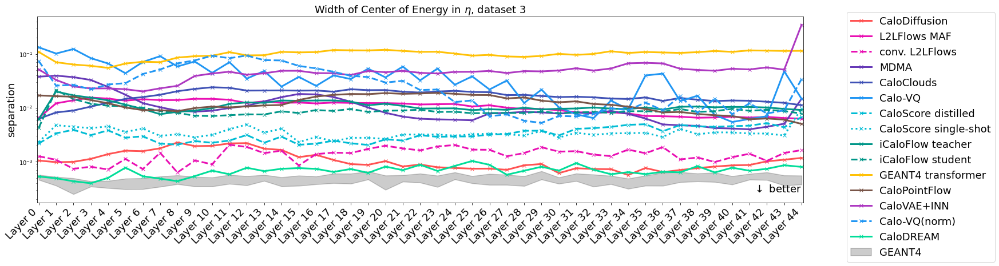

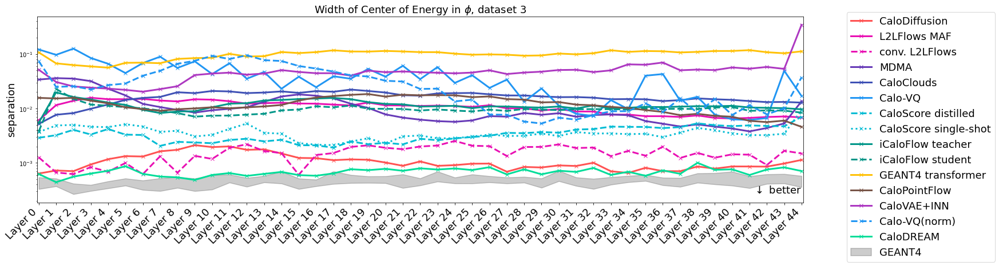

In [40]:
# EC and its width

plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45)

for entry in ds3['sep EC eta'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds3['sep EC eta'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds3['sep EC eta'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([f'Layer {i}' for i in range(45)], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Center of Energy in $\eta$, dataset 3", fontsize=FS)
plt.text(44, 2.5e-4, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')
plt.savefig('results_fig/sep/ds3_CE_eta.pdf', dpi=300, bbox_inches='tight')
plt.show()
          
          
plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45)

for entry in ds3['sep EC phi'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds3['sep EC phi'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds3['sep EC phi'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([f'Layer {i}' for i in range(45)], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Center of Energy in $\phi$, dataset 3", fontsize=FS)
plt.text(44, 2.5e-4, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')
plt.savefig('results_fig/sep/ds3_CE_phi.pdf', dpi=300, bbox_inches='tight')
plt.show()


plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45)

for entry in ds3['sep EC eta std'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds3['sep EC eta std'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds3['sep EC eta std'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([f'Layer {i}' for i in range(45)], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Width of Center of Energy in $\eta$, dataset 3", fontsize=FS)
plt.text(44, 2.5e-4, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')
plt.savefig('results_fig/sep/ds3_width_CE_eta.pdf', dpi=300, bbox_inches='tight')
plt.show()
          
          
plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45)

for entry in ds3['sep EC phi std'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds3['sep EC phi std'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds3['sep EC phi std'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([f'Layer {i}' for i in range(45)], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Width of Center of Energy in $\phi$, dataset 3", fontsize=FS)
plt.text(44, 2.5e-4, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')
plt.savefig('results_fig/sep/ds3_width_CE_phi.pdf', dpi=300, bbox_inches='tight')
plt.show()


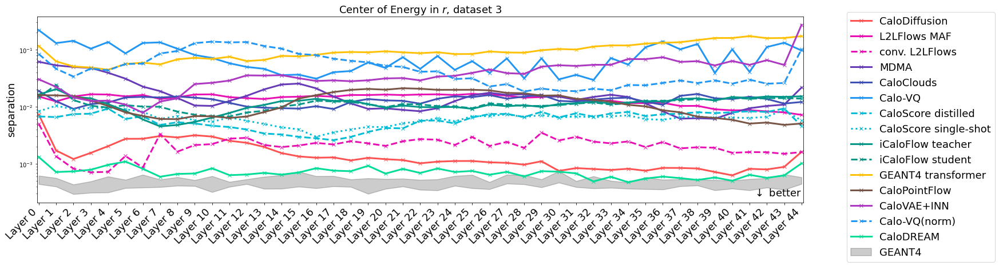

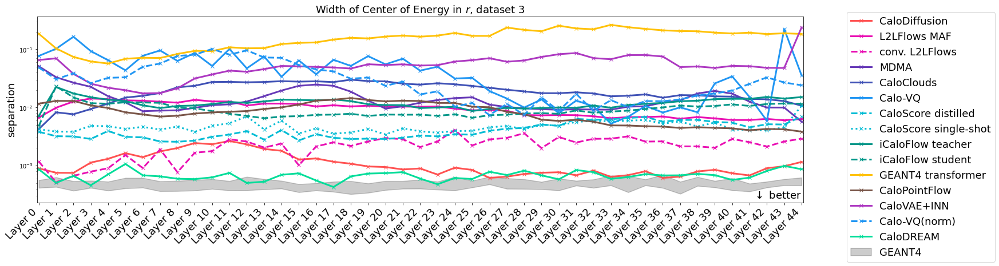

In [41]:
# EC and its width in r


plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45)

for entry in ds3['sep EC r'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds3['sep EC r'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds3['sep EC r'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([f'Layer {i}' for i in range(45)], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Center of Energy in $r$, dataset 3", fontsize=FS)
plt.text(44, 2.5e-4, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')
plt.savefig('results_fig/sep/ds3_CE_r.pdf', dpi=300, bbox_inches='tight')
plt.show()


plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45)

for entry in ds3['sep EC r std'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds3['sep EC r std'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds3['sep EC r std'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([f'Layer {i}' for i in range(45)], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Width of Center of Energy in $r$, dataset 3", fontsize=FS)
plt.text(44, 2.5e-4, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')
plt.savefig('results_fig/sep/ds3_width_CE_r.pdf', dpi=300, bbox_inches='tight')
plt.show()



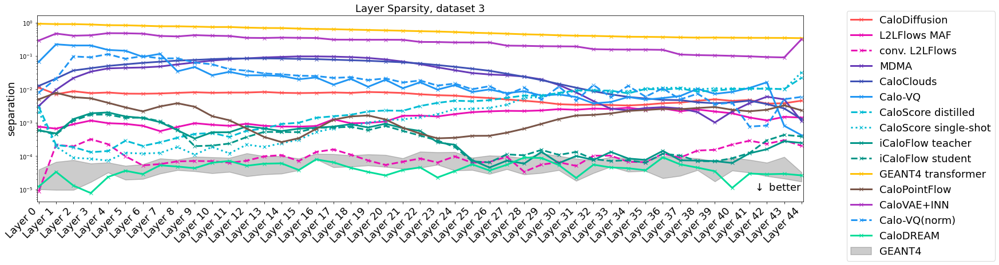

In [42]:
# layer sparsities

plt.figure(figsize=(24,6), facecolor='white')
x_scan = np.arange(45)

for entry in ds3['sep sparsity'].to_dict():
    if entry == 0:
        continue
    plt.plot(x_scan, ds3['sep sparsity'].to_dict()[entry], marker='x', label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

geant_min, geant_max = get_min_max_from_dict(ds3['sep sparsity'].to_dict(), 0)
plt.fill_between(x_scan, geant_min, geant_max, label=id_dict[0], linewidth=1.5, **kwargs_dict[0])

plt.xlim([x_scan[0]-0.1, x_scan[-1]+0.1])
plt.yscale("log")
plt.ylabel('separation', fontsize=FS)
plt.gca().set_xticks(x_scan)
plt.gca().set_xticklabels([f'Layer {i}' for i in range(45)], rotation=45, ha='right', fontsize=FS)
plt.legend(bbox_to_anchor=(1.05, 1.05), fontsize=FS)
plt.title(f"Layer Sparsity, dataset 3", fontsize=FS)
plt.text(44, 8e-6, r"$\downarrow$ better", fontsize=FS, va='bottom', ha='right')
plt.savefig('results_fig/sep/ds3_sparsity.pdf', dpi=300, bbox_inches='tight')
plt.show()


working on submission 0
[[0.47335753 0.48664081 0.51523642 ... 0.69688609 0.7015574  1.        ]
 [0.48087177 0.49186313 0.51980167 ... 0.73901658 1.         0.7015574 ]
 [0.48780834 0.4991139  0.53040817 ... 1.         0.73901658 0.69688609]
 ...
 [0.73703331 0.83551114 1.         ... 0.53040817 0.51980167 0.51523642]
 [0.72856381 1.         0.83551114 ... 0.4991139  0.49186313 0.48664081]
 [1.         0.72856381 0.73703331 ... 0.48780834 0.48087177 0.47335753]]


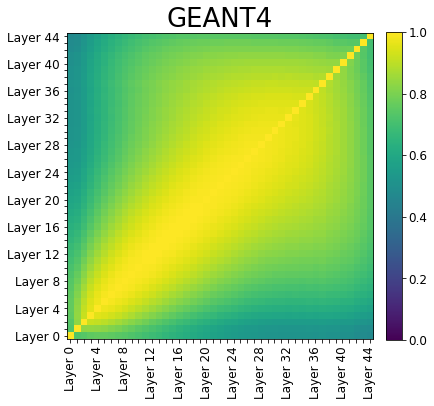

working on submission 1
[[0.47433099 0.47792046 0.52587994 ... 0.63920359 0.64906136 1.        ]
 [0.44845079 0.45036799 0.49738807 ... 0.62595597 1.         0.64906136]
 [0.4526808  0.45310109 0.49669925 ... 1.         0.62595597 0.63920359]
 ...
 [0.73448285 0.80530508 1.         ... 0.49669925 0.49738807 0.52587994]
 [0.70742619 1.         0.80530508 ... 0.45310109 0.45036799 0.47792046]
 [1.         0.70742619 0.73448285 ... 0.4526808  0.44845079 0.47433099]]


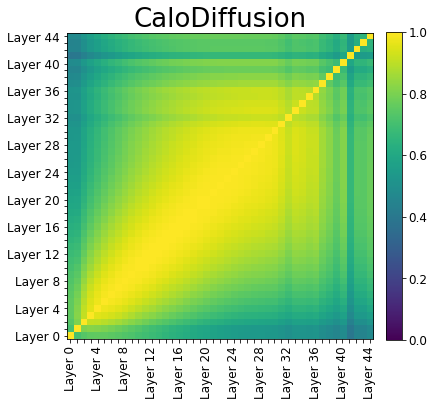

working on submission 2
[[0.4519552  0.45916022 0.49692882 ... 0.65837723 0.66986912 1.        ]
 [0.48678917 0.49360422 0.53420791 ... 0.72711058 1.         0.66986912]
 [0.49367804 0.49982431 0.53837709 ... 1.         0.72711058 0.65837723]
 ...
 [0.74299869 0.83249166 1.         ... 0.53837709 0.53420791 0.49692882]
 [0.72931591 1.         0.83249166 ... 0.49982431 0.49360422 0.45916022]
 [1.         0.72931591 0.74299869 ... 0.49367804 0.48678917 0.4519552 ]]


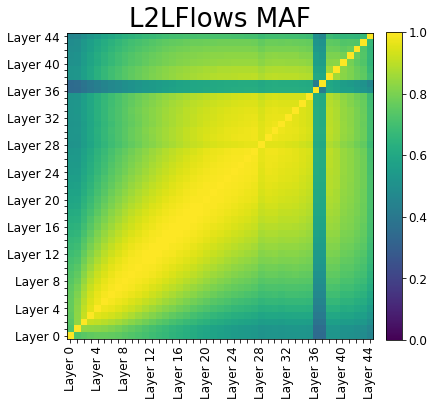

working on submission 3
[[0.10255844 0.10717937 0.1142427  ... 0.17804257 0.17444648 1.        ]
 [0.46237417 0.46654151 0.50218426 ... 0.68094677 1.         0.17444648]
 [0.49031676 0.49497111 0.53309877 ... 1.         0.68094677 0.17804257]
 ...
 [0.73124995 0.82835844 1.         ... 0.53309877 0.50218426 0.1142427 ]
 [0.71641146 1.         0.82835844 ... 0.49497111 0.46654151 0.10717937]
 [1.         0.71641146 0.73124995 ... 0.49031676 0.46237417 0.10255844]]


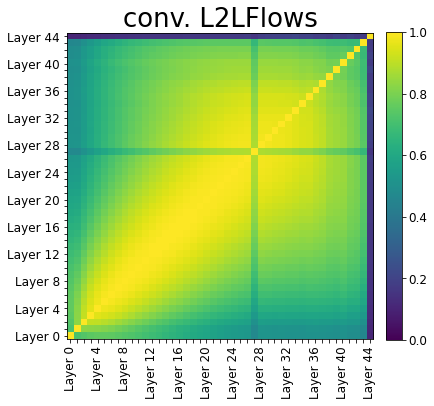

working on submission 5
[[0.67813399 0.76017295 0.82023656 ... 0.82812435 0.82924008 1.        ]
 [0.6665147  0.74631128 0.80396568 ... 0.79994687 1.         0.82924008]
 [0.66963288 0.74590026 0.80343817 ... 1.         0.79994687 0.82812435]
 ...
 [0.82441272 0.88541705 1.         ... 0.80343817 0.80396568 0.82023656]
 [0.82129295 1.         0.88541705 ... 0.74590026 0.74631128 0.76017295]
 [1.         0.82129295 0.82441272 ... 0.66963288 0.6665147  0.67813399]]


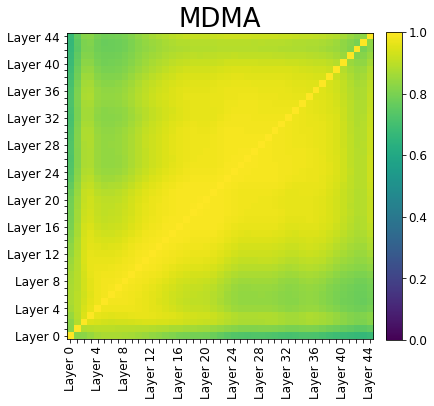

working on submission 6
[[0.46835722 0.46983006 0.49123034 ... 0.62064077 0.66655287 1.        ]
 [0.49549262 0.48994434 0.51414647 ... 0.69316651 1.         0.66655287]
 [0.47213748 0.46365524 0.48776905 ... 1.         0.69316651 0.62064077]
 ...
 [0.75561248 0.83570498 1.         ... 0.48776905 0.51414647 0.49123034]
 [0.75433742 1.         0.83570498 ... 0.46365524 0.48994434 0.46983006]
 [1.         0.75433742 0.75561248 ... 0.47213748 0.49549262 0.46835722]]


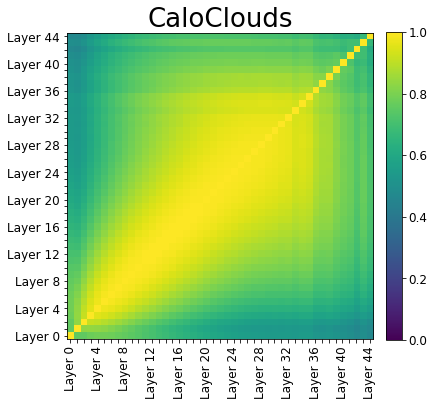

working on submission 7
[[0.34445977 0.35696811 0.66721774 ... 0.88240557 0.88642948 1.        ]
 [0.39646529 0.4216475  0.7589351  ... 0.90116308 1.         0.88642948]
 [0.37823685 0.39626034 0.7289154  ... 1.         0.90116308 0.88240557]
 ...
 [0.66572875 0.71949779 1.         ... 0.7289154  0.7589351  0.66721774]
 [0.67752828 1.         0.71949779 ... 0.39626034 0.4216475  0.35696811]
 [1.         0.67752828 0.66572875 ... 0.37823685 0.39646529 0.34445977]]


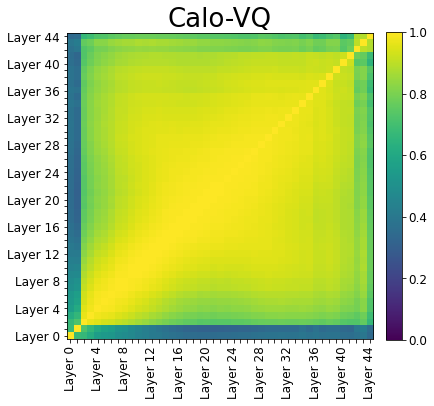

working on submission 9
[[0.31926084 0.31745886 0.34185421 ... 0.35631972 0.52968773 1.        ]
 [0.43018465 0.43581234 0.47248063 ... 0.48315017 1.         0.52968773]
 [0.31341641 0.31343137 0.3412553  ... 1.         0.48315017 0.35631972]
 ...
 [0.73895167 0.82947842 1.         ... 0.3412553  0.47248063 0.34185421]
 [0.75045268 1.         0.82947842 ... 0.31343137 0.43581234 0.31745886]
 [1.         0.75045268 0.73895167 ... 0.31341641 0.43018465 0.31926084]]


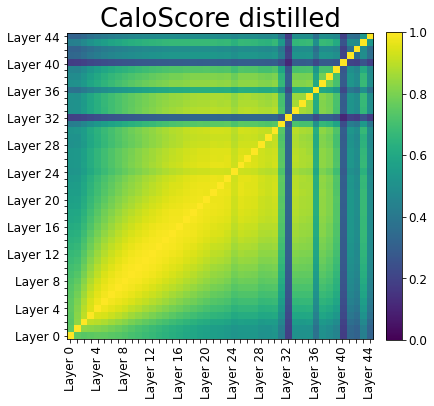

working on submission 10
[[0.10033864 0.10102427 0.11035678 ... 0.05396722 0.14954059 1.        ]
 [0.35068727 0.36802199 0.4019861  ... 0.18590214 1.         0.14954059]
 [0.13891793 0.14156556 0.15392227 ... 1.         0.18590214 0.05396722]
 ...
 [0.71026971 0.81960328 1.         ... 0.15392227 0.4019861  0.11035678]
 [0.7181276  1.         0.81960328 ... 0.14156556 0.36802199 0.10102427]
 [1.         0.7181276  0.71026971 ... 0.13891793 0.35068727 0.10033864]]


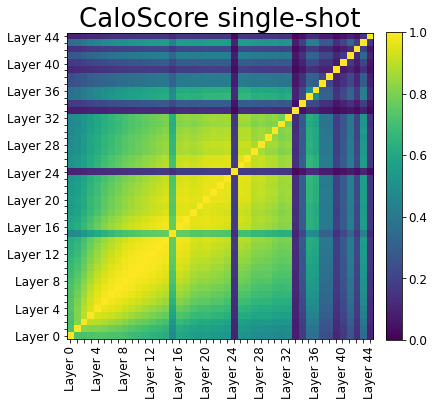

working on submission 13
[[0.26988356 0.28445512 0.31055175 ... 0.09798334 0.33904489 1.        ]
 [0.36824533 0.38958269 0.42461489 ... 0.13616342 1.         0.33904489]
 [0.10718402 0.11284939 0.12409785 ... 1.         0.13616342 0.09798334]
 ...
 [0.63994594 0.72192483 1.         ... 0.12409785 0.42461489 0.31055175]
 [0.59004219 1.         0.72192483 ... 0.11284939 0.38958269 0.28445512]
 [1.         0.59004219 0.63994594 ... 0.10718402 0.36824533 0.26988356]]


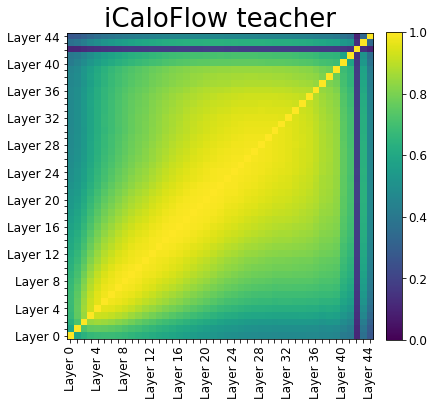

working on submission 14
[[0.36805356 0.39123459 0.41816104 ... 0.52639325 0.48781407 1.        ]
 [0.41528192 0.44374557 0.47497231 ... 0.589581   1.         0.48781407]
 [0.44302123 0.47040364 0.50655175 ... 1.         0.589581   0.52639325]
 ...
 [0.65641354 0.7377879  1.         ... 0.50655175 0.47497231 0.41816104]
 [0.59889699 1.         0.7377879  ... 0.47040364 0.44374557 0.39123459]
 [1.         0.59889699 0.65641354 ... 0.44302123 0.41528192 0.36805356]]


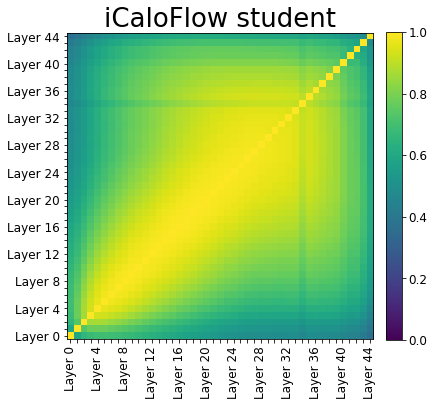

working on submission 21
[[0.77709036 0.73239832 0.73505128 ... 0.99770298 0.99909415 1.        ]
 [0.77370439 0.72902549 0.73152447 ... 0.99874321 1.         0.99909415]
 [0.77498145 0.73011999 0.73276245 ... 1.         0.99874321 0.99770298]
 ...
 [0.97374055 0.99103552 1.         ... 0.73276245 0.73152447 0.73505128]
 [0.98826038 1.         0.99103552 ... 0.73011999 0.72902549 0.73239832]
 [1.         0.98826038 0.97374055 ... 0.77498145 0.77370439 0.77709036]]


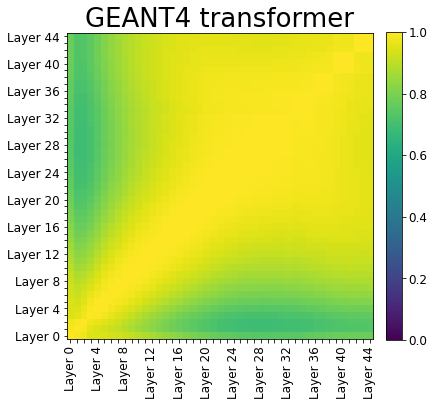

working on submission 23
[[0.03870765 0.07362115 0.07194609 ... 0.02409483 0.0774972  1.        ]
 [0.18156136 0.33914947 0.3289521  ... 0.10370591 1.         0.0774972 ]
 [0.05271604 0.09584523 0.0928508  ... 1.         0.10370591 0.02409483]
 ...
 [0.20499286 0.40269636 1.         ... 0.0928508  0.3289521  0.07194609]
 [0.21502588 1.         0.40269636 ... 0.09584523 0.33914947 0.07362115]
 [1.         0.21502588 0.20499286 ... 0.05271604 0.18156136 0.03870765]]


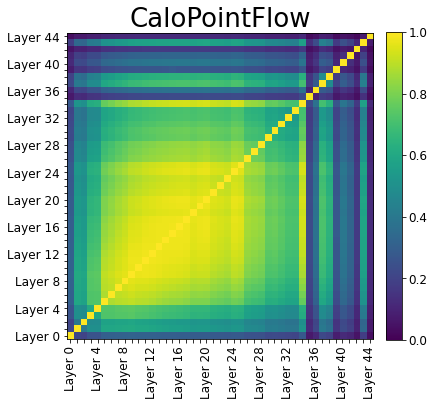

working on submission 27
[[0.29184117 0.32330398 0.3866722  ... 0.68630496 0.70912406 1.        ]
 [0.41127709 0.45419304 0.53985624 ... 0.76488078 1.         0.70912406]
 [0.42782817 0.46839694 0.55053227 ... 1.         0.76488078 0.68630496]
 ...
 [0.62792228 0.73497726 1.         ... 0.55053227 0.53985624 0.3866722 ]
 [0.57582426 1.         0.73497726 ... 0.46839694 0.45419304 0.32330398]
 [1.         0.57582426 0.62792228 ... 0.42782817 0.41127709 0.29184117]]


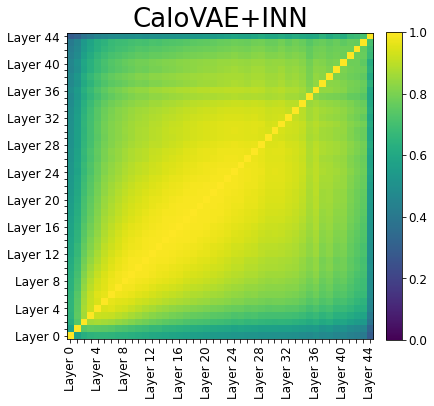

working on submission 31
[[0.4736783  0.50580211 0.2471095  ... 0.65234185 0.61668188 1.        ]
 [0.46812323 0.49168677 0.24492518 ... 0.66346605 1.         0.61668188]
 [0.50376488 0.53130052 0.26081952 ... 1.         0.66346605 0.65234185]
 ...
 [0.27943768 0.35140782 1.         ... 0.26081952 0.24492518 0.2471095 ]
 [0.62265361 1.         0.35140782 ... 0.53130052 0.49168677 0.50580211]
 [1.         0.62265361 0.27943768 ... 0.50376488 0.46812323 0.4736783 ]]


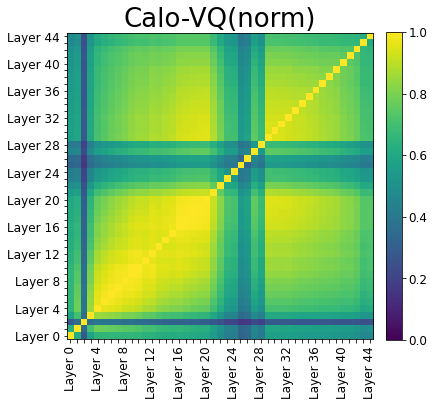

working on submission 33
[[0.45922095 0.46294639 0.49798609 ... 0.69024534 0.7306988  1.        ]
 [0.49179938 0.49181883 0.52882957 ... 0.76947703 1.         0.7306988 ]
 [0.50912565 0.51135348 0.54961053 ... 1.         0.76947703 0.69024534]
 ...
 [0.74825406 0.8300037  1.         ... 0.54961053 0.52882957 0.49798609]
 [0.73191467 1.         0.8300037  ... 0.51135348 0.49181883 0.46294639]
 [1.         0.73191467 0.74825406 ... 0.50912565 0.49179938 0.45922095]]


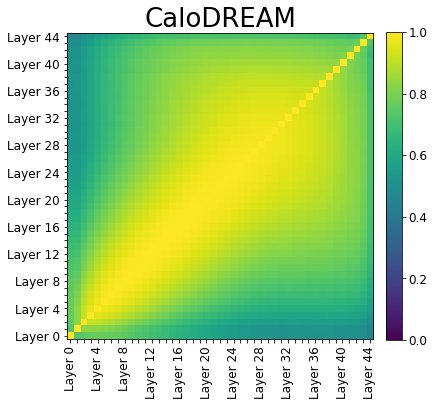

In [43]:
# layer correlations based on 2406.12898

for iter_id, submission_id in enumerate(ds3['PCC Layer Energies'].to_dict()):
    plt.figure(figsize=(6,6), facecolor='white')
    print(f"working on submission {submission_id}")
    labels = [f'Layer {i}' for i in range(45)]
    E_corr = np.array(ds3['PCC Layer Energies'].to_dict()[submission_id]).astype(float)
    print(E_corr)
    plot_corr(E_corr, id_dict[submission_id], labels, f'results_fig/corr/ds3_{submission_id}.pdf', ds1=False)


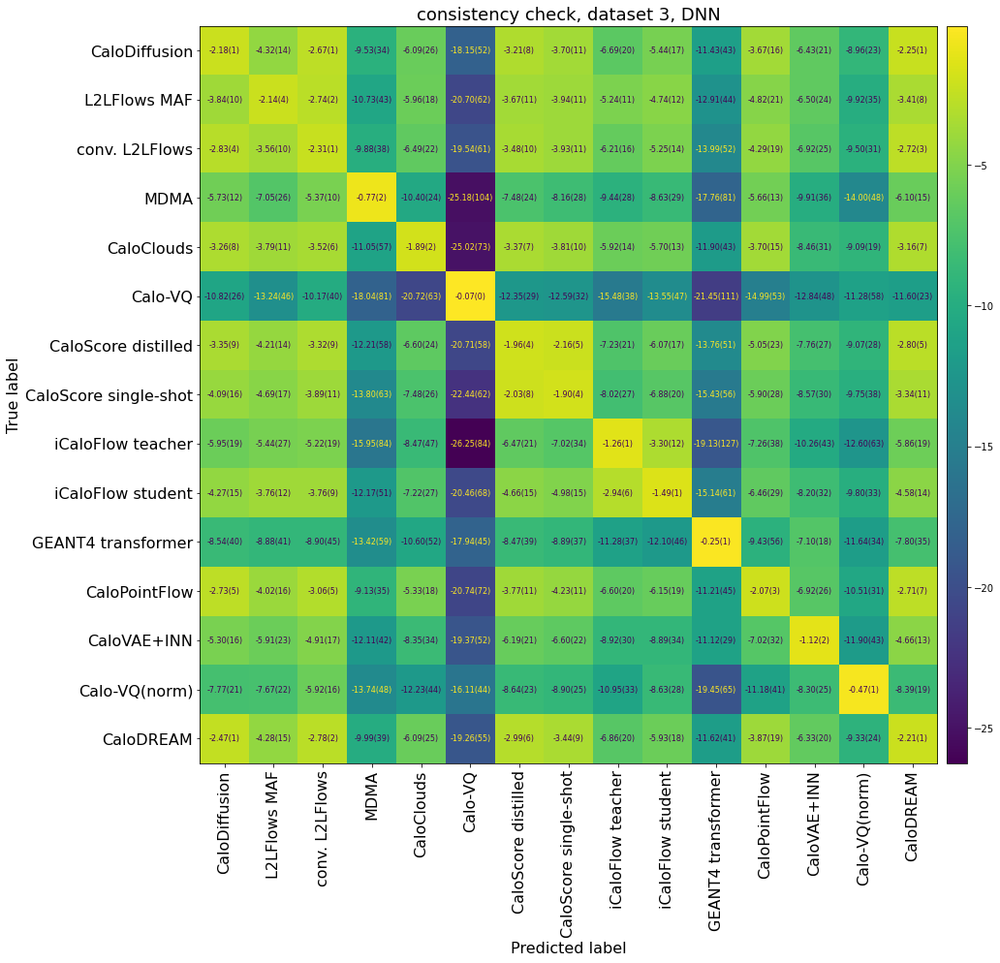

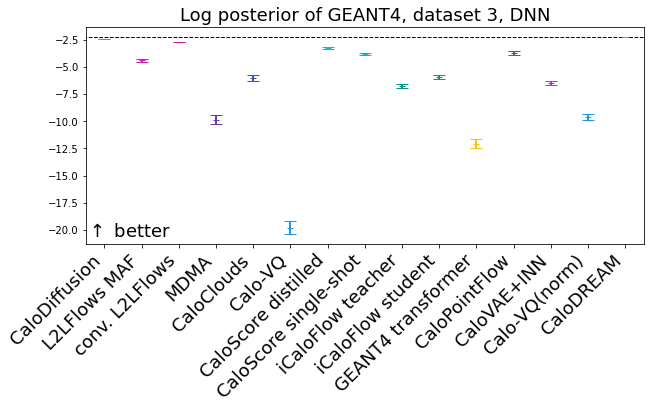

In [44]:
# multiclass classifier

log_post_by_model = []
log_post_by_model_std = []
label = []
for entry in ds3['multi cls CC'].to_dict():
    if entry == 0:
        continue
    log_post_by_model.append(ds3['multi cls CC'].to_dict()[entry])
    log_post_by_model_std.append(ds3['multi cls CC std'].to_dict()[entry])
    label.append(id_dict[entry])

log_post_by_model = np.array(log_post_by_model).astype(float)    
log_post_by_model_std = np.array(log_post_by_model_std).astype(float)    
    
plt.figure(figsize=(14,14))
disp = ConfusionMatrixDisplayError(confusion_matrix=log_post_by_model, 
                              display_labels=label, errors=log_post_by_model_std)
disp.plot(xticks_rotation='vertical', ax=plt.gca(), colorbar=False, values_format=".2f", include_errors=True, text_kw={'fontsize': 8})
plt.title(f"consistency check, dataset 3, DNN", fontsize=FS)
cax = plt.gcf().add_axes([plt.gca().get_position().x1+0.01,plt.gca().get_position().y0,0.02,plt.gca().get_position().height])
plt.colorbar(disp.im_,  cax=cax)
plt.savefig(f'results_fig/cls/ds3_confusion.pdf', dpi=300, bbox_inches='tight')
plt.show()

log_truth = []
log_truth_std = []
color = []
for entry in ds3['multi cls'].to_dict():
    if entry == 0:
        continue
    log_truth.append(ds3['multi cls'].to_dict()[entry])
    log_truth_std.append(ds3['multi cls std'].to_dict()[entry])
    color.append(kwargs_dict[entry]['color'])

log_truth = np.array(log_truth).astype(float)    
log_truth_std = np.array(log_truth_std).astype(float)    

plt.figure(figsize=(10,4))
for x, y, yerr, col in zip(np.arange(len(label)), log_truth, log_truth_std, color):
    plt.errorbar(x, y, yerr=yerr, elinewidth=2, marker='_', capsize=6, linestyle='None', color=col)

#plt.errorbar(np.arange(len(label)), log_truth, yerr=log_truth_std, elinewidth=2, marker='_', capsize=6, linestyle='None')
plt.hlines(np.max(log_truth), xmin=-1, xmax=len(label), color = 'k', linestyle='dashed', linewidth=1)
plt.xlim(-0.5, len(label)-0.5)
plt.title(f"Log posterior of GEANT4, dataset 3, DNN", fontsize=FS)
plt.gca().set_xticks(np.arange(len(label)))
plt.gca().set_xticklabels(label, rotation=45, ha='right', fontsize=FS)
plt.text(-0.5, -21., r"$\uparrow$ better", fontsize=FS, va='bottom')
plt.savefig(f'results_fig/cls/ds3_truth.pdf', dpi=300, bbox_inches='tight')
plt.show()


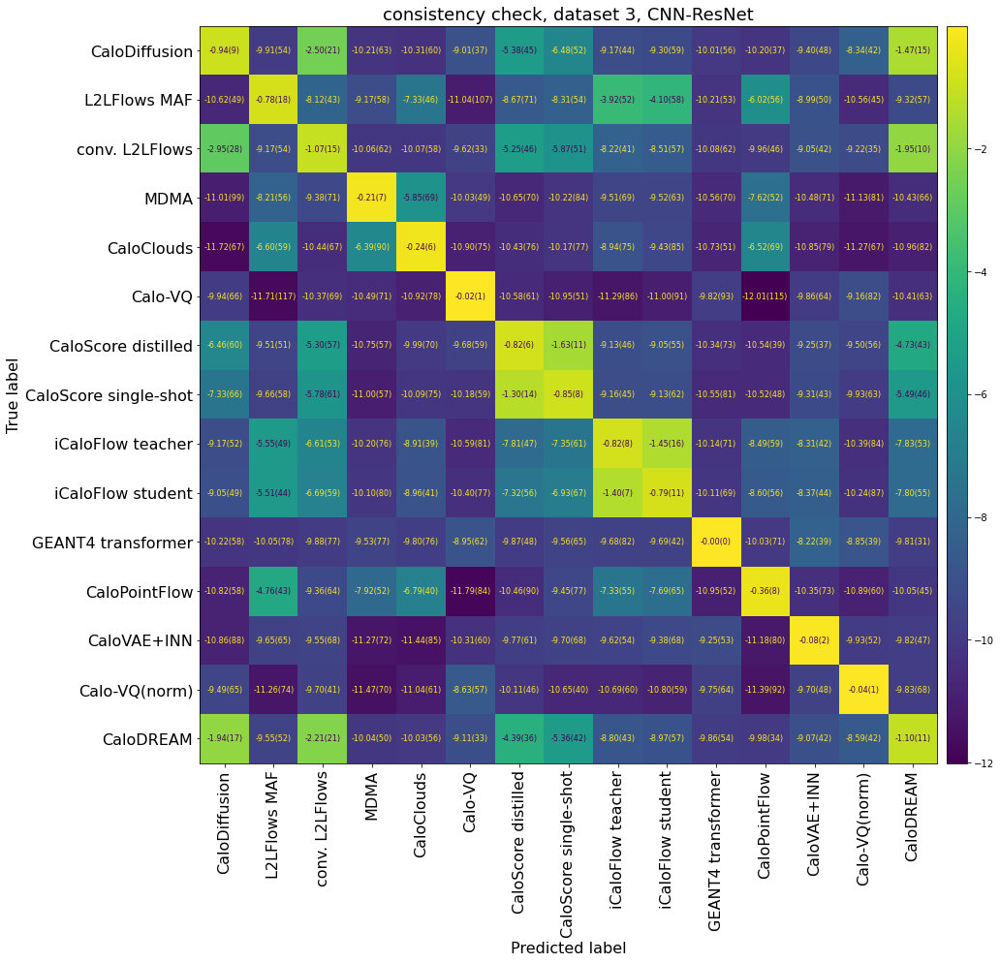

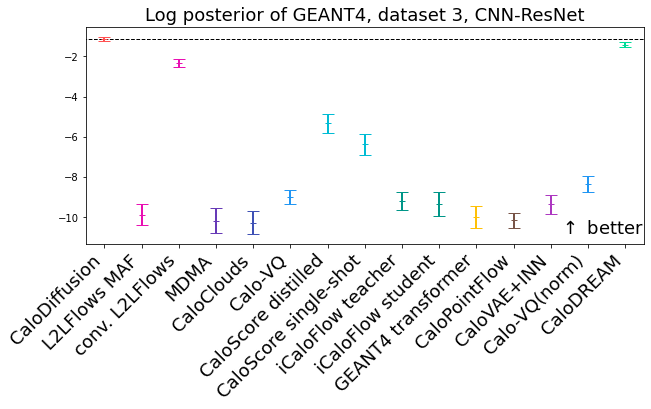

In [45]:
# multiclass classifier

log_post_by_model = []
log_post_by_model_std = []
label = []
for entry in ds3['multi cls cnn CC'].to_dict():
    if entry == 0:
        continue
    log_post_by_model.append(ds3['multi cls cnn CC'].to_dict()[entry])
    log_post_by_model_std.append(ds3['multi cls cnn CC std'].to_dict()[entry])
    label.append(id_dict[entry])

log_post_by_model = np.array(log_post_by_model).astype(float)    
log_post_by_model_std = np.array(log_post_by_model_std).astype(float)    
    
plt.figure(figsize=(14,14))
disp = ConfusionMatrixDisplayError(confusion_matrix=log_post_by_model, 
                              display_labels=label, errors=log_post_by_model_std)
disp.plot(xticks_rotation='vertical', ax=plt.gca(), colorbar=False, values_format=".2f", include_errors=True, text_kw={'fontsize': 8})
plt.title(f"consistency check, dataset 3, CNN-ResNet", fontsize=FS)
cax = plt.gcf().add_axes([plt.gca().get_position().x1+0.01,plt.gca().get_position().y0,0.02,plt.gca().get_position().height])
plt.colorbar(disp.im_,  cax=cax)
plt.savefig(f'results_fig/cls/ds3_ResNet_confusion.pdf', dpi=300, bbox_inches='tight')
plt.show()

log_truth = []
log_truth_std = []
color = []
for entry in ds3['multi cls cnn'].to_dict():
    if entry == 0:
        continue
    log_truth.append(ds3['multi cls cnn'].to_dict()[entry])
    log_truth_std.append(ds3['multi cls cnn std'].to_dict()[entry])
    color.append(kwargs_dict[entry]['color'])
    
log_truth = np.array(log_truth).astype(float)    
log_truth_std = np.array(log_truth_std).astype(float)    

plt.figure(figsize=(10,4))
for x, y, yerr, col in zip(np.arange(len(label)), log_truth, log_truth_std, color):
    plt.errorbar(x, y, yerr=yerr, elinewidth=2, marker='_', capsize=6, linestyle='None', color=col)
#plt.errorbar(np.arange(len(label)), log_truth, yerr=log_truth_std, elinewidth=2, marker='_', capsize=6, linestyle='None')
plt.hlines(np.max(log_truth), xmin=-1, xmax=len(label), color = 'k', linestyle='dashed', linewidth=1)
plt.xlim(-0.5, len(label)-0.5)
plt.title(f"Log posterior of GEANT4, dataset 3, CNN-ResNet", fontsize=FS)
plt.gca().set_xticks(np.arange(len(label)))
plt.gca().set_xticklabels(label, rotation=45, ha='right', fontsize=FS)
plt.text(14.5, -11., r"$\uparrow$ better", fontsize=FS, va='bottom',ha='right')
plt.savefig(f'results_fig/cls/ds3_ResNet_truth.pdf', dpi=300, bbox_inches='tight')
plt.show()


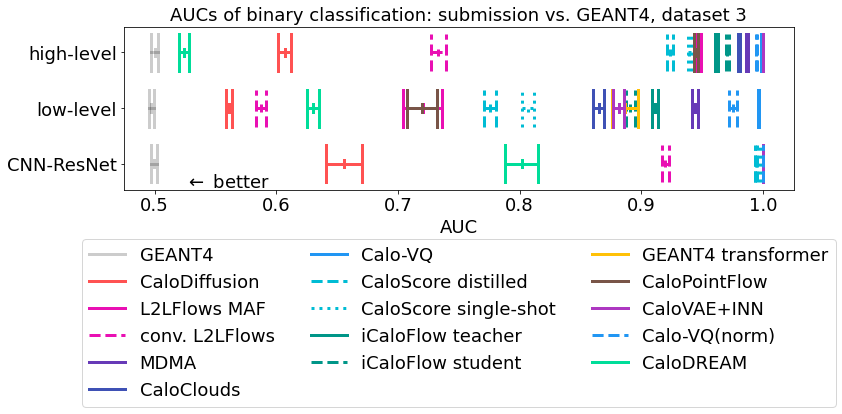

In [46]:
# binary AUCs

plt.figure(figsize=(12,3), facecolor='white')

for run_id, entry in enumerate(ds3['binary cls low'].to_dict()):
    plot_with_errors([ds3['binary cls high'].to_dict()[entry], 2.5], ds3['binary cls high std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds3['binary cls low'].to_dict()[entry], 1.75], ds3['binary cls low std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])
    plot_with_errors([ds3['binary cls cnn'].to_dict()[entry], 1.], ds3['binary cls cnn std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])

plt.xlim([0.475, 1.025])
plt.xlabel('AUC', fontsize=FS)
plt.legend(bbox_to_anchor=(0.5, -0.25), fontsize=FS, ncol=3, loc='upper center')
plt.title(f"AUCs of binary classification: submission vs. GEANT4, dataset 3", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75, 2.5])
plt.gca().set_yticklabels(['CNN-ResNet', 'low-level', 'high-level'], ha='right', fontsize=FS)
plt.text(0.525, 0.75, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/cls/ds3_binary_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()

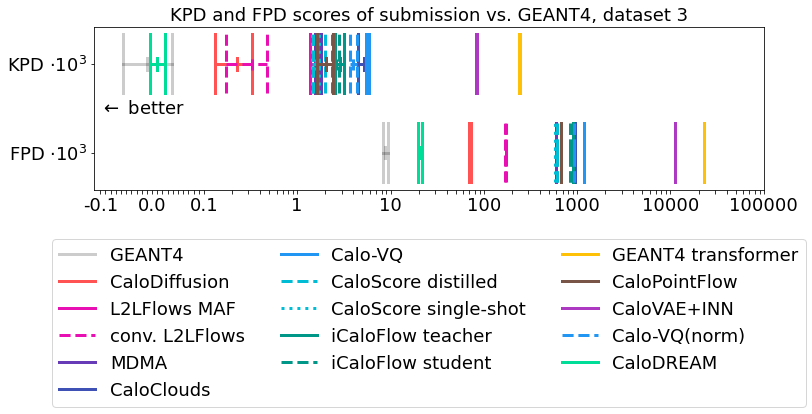

In [47]:
# KPD/FPD

symlog_ticks = [-0.1, *[-0.1+0.01* i for i in range(1,10)], *[0.01* i for i in range(10)],*[0.1*i for i in range(1,10)],*[i for i in range(1,10)],*[10*i for i in range(1,10)],*[100*i for i in range(1,10)], *[1000*i for i in range(1,10)], *[10000*i for i in range(1,11)]]
symlog_labels = []
for tick in symlog_ticks:
    if tick in [-0.1, 0., 0.1, 1., 10, 100, 1000, 10000, 100000]:
        symlog_labels.append(str(tick))
    else:
        symlog_labels.append('')

plt.figure(figsize=(12,3), facecolor='white')

for run_id, entry in enumerate(ds3['KPD * 1e3'].to_dict()):
    plot_with_errors([ds3['KPD * 1e3'].to_dict()[entry], 1.75], ds3['KPD * 1e3 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds3['FPD * 1e3'].to_dict()[entry], 1.], ds3['FPD * 1e3 std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('symlog', linthresh=0.1, linscale=0.5)
plt.legend(bbox_to_anchor=(0.5, -0.25), fontsize=FS, ncol=3, loc='upper center')
plt.title(f"KPD and FPD scores of submission vs. GEANT4, dataset 3", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75])
plt.gca().set_yticklabels([r'FPD $\cdot 10^{3}$', r'KPD $\cdot 10^{3}$'], ha='right', fontsize=FS)
plt.gca().set_xticks(symlog_ticks)
plt.gca().set_xticklabels(symlog_labels)
plt.text(-0.1, 1.375, r"$\leftarrow$ better", fontsize=FS, va='center')
plt.savefig(f'results_fig/cls/ds3_KPD_FPD.pdf', dpi=300, bbox_inches='tight')
plt.show()

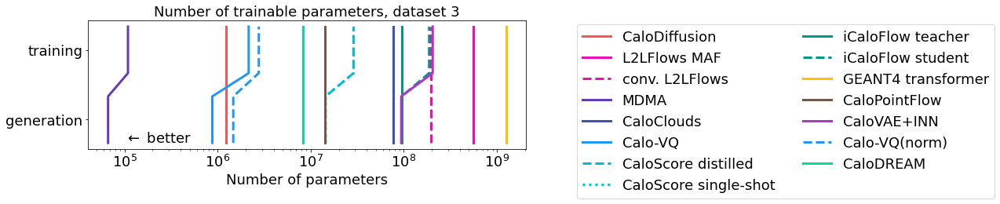

In [48]:
# number of parameters
connected = True

plt.figure(figsize=(10,3), facecolor='white')

for run_id, entry in enumerate(ds3['Parameters training'].to_dict()):
    if entry == 0:
        continue
    if not connected:
        plt.plot(np.repeat(ds3['Parameters generation'].to_dict()[entry], 2), [0.75, 1.25], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])
        plt.plot(np.repeat(ds3['Parameters training'].to_dict()[entry], 2), [1.5, 2.], marker=None, label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    else:
        plt.plot([*np.repeat(ds3['Parameters generation'].to_dict()[entry], 2), *np.repeat(ds3['Parameters training'].to_dict()[entry], 2)], [0.75, 1.25, 1.5, 2.], marker=None, label=id_dict[entry], linewidth=3., **kwargs_dict[entry])

    
plt.xscale('log')
plt.xlabel('Number of parameters', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Number of trainable parameters, dataset 3", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75])
plt.gca().set_yticklabels(['generation', 'training'], ha='right', fontsize=FS)
plt.text(1e5, 0.8, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/ds3_num_param.pdf', dpi=300, bbox_inches='tight')
plt.show()

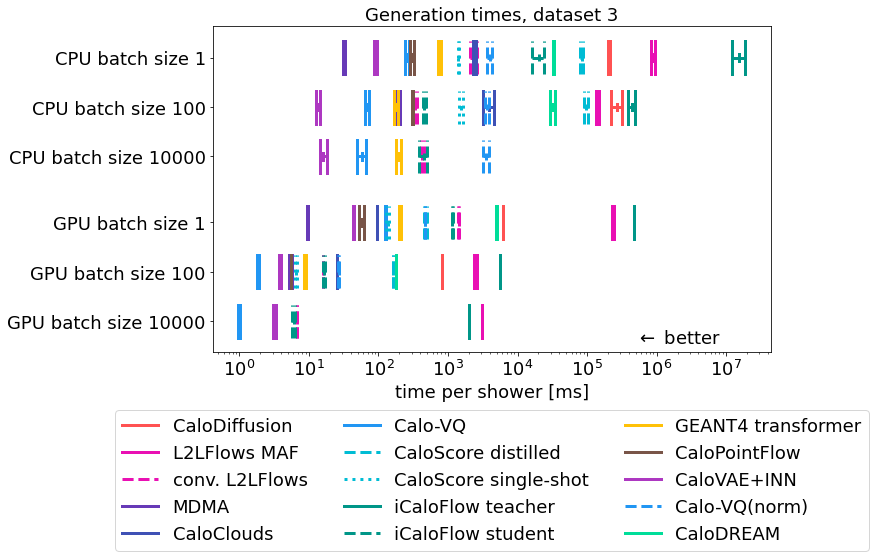

In [49]:
# timings

plt.figure(figsize=(10,6), facecolor='white')

for run_id, entry in enumerate(ds3['time CPU 1'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors([ds3['time CPU 1'].to_dict()[entry], 5.], ds3['time CPU 1 std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])
    plot_with_errors([ds3['time CPU 100'].to_dict()[entry], 4.25], ds3['time CPU 100 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds3['time CPU 10000'].to_dict()[entry], 3.5], ds3['time CPU 10000 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds3['time GPU 1'].to_dict()[entry], 2.5], ds3['time GPU 1 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds3['time GPU 100'].to_dict()[entry], 1.75], ds3['time GPU 100 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])
    plot_with_errors([ds3['time GPU 10000'].to_dict()[entry], 1.], ds3['time GPU 10000 std'].to_dict()[entry], '_please_dont', kwargs_dict[entry])

plt.xscale('log')
plt.xlabel('time per shower [ms]', fontsize=FS)
plt.legend(bbox_to_anchor=(0.5, -0.15), fontsize=FS, ncol=3, loc='upper center')
plt.title(f"Generation times, dataset 3", fontsize=FS)
plt.xticks(fontsize=FS)
plt.gca().set_yticks([1,1.75, 2.5, 3.5, 4.25, 5.])
plt.gca().set_yticklabels(['GPU batch size 10000', 'GPU batch size 100', 'GPU batch size 1','CPU batch size 10000', 'CPU batch size 100', 'CPU batch size 1'], ha='right', fontsize=FS)
plt.text(5e5, .75, r"$\leftarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/time/ds3.pdf', dpi=300, bbox_inches='tight')
plt.show()


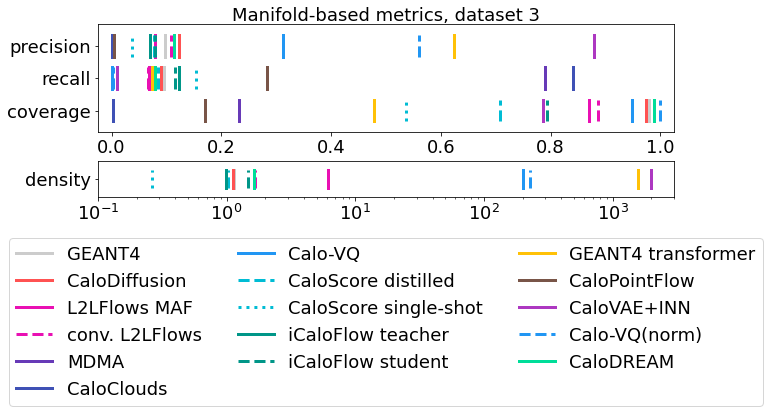

In [50]:
# manifold based metrics

fig, axs = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]},figsize=(10,3), facecolor='white')

for run_id, entry in enumerate(ds3['precision'].to_dict()):
    axs[0].plot(np.repeat(ds3['precision'].to_dict()[entry], 2), [2.25, 2.75], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])
    axs[0].plot(np.repeat(ds3['recall'].to_dict()[entry], 2), [1.5, 2.], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])
    axs[0].plot(np.repeat(ds3['coverage'].to_dict()[entry], 2), [0.75, 1.25], marker=None, label=id_dict[entry], linewidth=3., **kwargs_dict[entry])
    axs[1].plot(np.repeat(ds3['density'].to_dict()[entry], 2), [0., 0.5], marker=None, label='_please_dont', linewidth=3., **kwargs_dict[entry])

axs[0].set_xlim([-0.025, 1.025])
axs[0].set_ylim([0.5, 3.])
axs[0].set_yticks([1,1.75, 2.5])
axs[0].set_yticklabels(['coverage', 'recall', 'precision'], ha='right', fontsize=FS)
axs[0].xaxis.set_tick_params(labelsize=FS)

axs[1].set_xlim([0.1, 3e3])
axs[1].set_ylim([-0.25,0.75])
axs[1].set_xscale('log')
axs[1].set_yticks([0.25])
axs[1].set_yticklabels(['density'], ha='right', fontsize=FS)
axs[1].xaxis.set_tick_params(labelsize=FS)

fig.legend(bbox_to_anchor=(0.5, -0.05), fontsize=FS, ncol=3, loc='upper center')

fig.suptitle(f"Manifold-based metrics, dataset 3", fontsize=FS)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.savefig(f'results_fig/man/ds3.pdf', dpi=300, bbox_inches='tight')
plt.show()


## Multiple Metric Plots / Pareto Fronts / Correlations
This section has 2 different goals. One is showing pareto fronts, basically moneyplots of the write up. The other one is showing how different metrics of the same category correlate with each other. 

In [46]:
def plot_with_errors_2d(location_x, error_x, location_y, error_y, label, kwargs):
    marker = {'solid': 's', 'dashed': 'p', 'dotted': 'H'}[kwargs['linestyle']]
    markersize = {'solid': 5, 'dashed': 7, 'dotted': 7}[kwargs['linestyle']]
    
    if not (np.isnan(location_x).any() or np.isnan(location_y).any()):
        plt.plot(location_x, location_y, marker=marker, label=label, linewidth=3., markersize=markersize, **kwargs)
        
        #plt.plot([location_x-error_x, location_x+error_x, location_x+error_x, location_x-error_x,  location_x-error_x],
        #         [location_y-error_y, location_y-error_y, location_y+error_y, location_y+error_y,  location_y-error_y],
        #         marker=None, label='_please_dont', linewidth=3., **kwargs)
        plt.plot([location_x, location_x], [location_y-error_y, location_y+error_y],
                 marker=None, label='_please_dont', linewidth=4., **kwargs)
        plt.plot([location_x-error_x, location_x+error_x], [location_y, location_y],
                 marker=None, label='_please_dont', linewidth=4., **kwargs)

def get_sep_sum(dataframe, dict_key):
    sep_sum = 0.
    for sep in ['sep E layer', 'sep E total', 'sep cell', 'sep EC eta', 'sep EC phi', 'sep EC r', 'sep EC eta std', 'sep EC phi std', 'sep EC r std', 'sep sparsity']:
        sep_sum += np.sum(dataframe[sep].to_dict()[dict_key])
    return sep_sum

### dataset 1 - photons

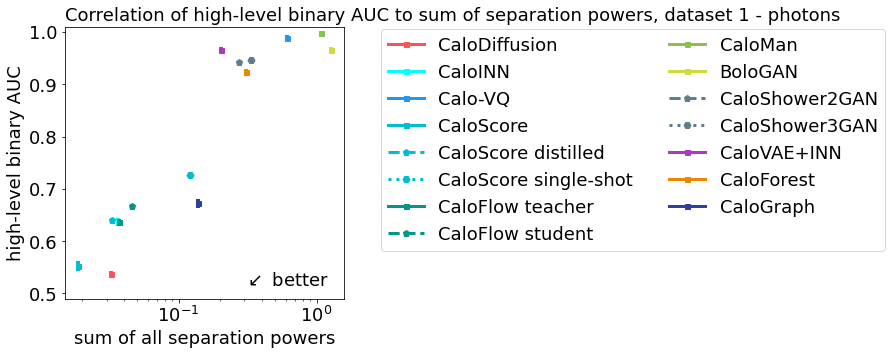

In [47]:
# high-level AUC to separation power

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds1_photons['sep E layer'].to_dict()):
    if entry == 0:
        continue
    sep_sum = get_sep_sum(ds1_photons, entry)
    plot_with_errors_2d(sep_sum, 0., ds1_photons['binary cls high'].to_dict()[entry], ds1_photons['binary cls high std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('log')
plt.xlabel('sum of all separation powers', fontsize=FS)
plt.ylabel('high-level binary AUC', fontsize=FS)
plt.ylim([0.49, 1.01])
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of high-level binary AUC to sum of separation powers, dataset 1 - photons", fontsize=FS,loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(3e-1, .525, r"$\swarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/scatter/ds1_photons_sep_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()


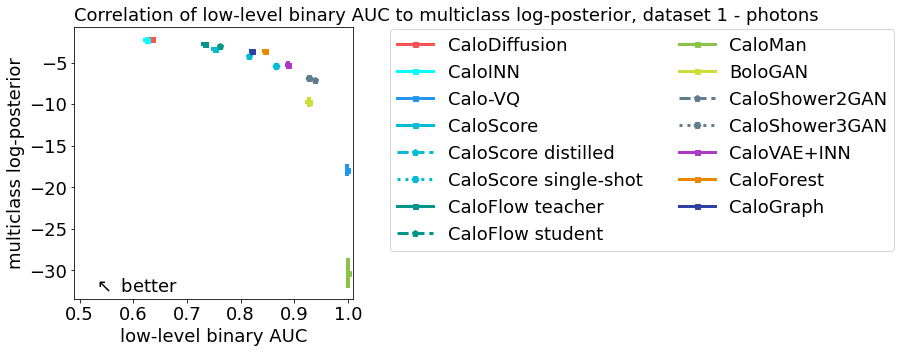

In [48]:
# low-level AUC to log posterior

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds1_photons['binary cls low'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds1_photons['binary cls low'].to_dict()[entry], ds1_photons['binary cls low std'].to_dict()[entry], ds1_photons['multi cls'].to_dict()[entry], ds1_photons['multi cls std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([0.49, 1.01])

plt.xlabel('low-level binary AUC', fontsize=FS)
plt.ylabel('multiclass log-posterior', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of low-level binary AUC to multiclass log-posterior, dataset 1 - photons", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(.525, -32, r"$\nwarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/scatter/ds1_photons_logpost_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()


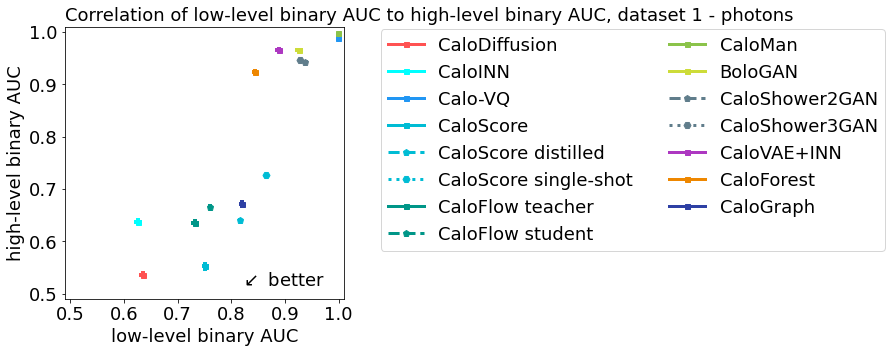

In [49]:
# low level AUC to high-level AUC

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds1_photons['binary cls low'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds1_photons['binary cls low'].to_dict()[entry], ds1_photons['binary cls low std'].to_dict()[entry], ds1_photons['binary cls high'].to_dict()[entry], ds1_photons['binary cls high std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([0.49, 1.01])
plt.ylim([0.49, 1.01])
plt.xlabel('low-level binary AUC', fontsize=FS)
plt.ylabel('high-level binary AUC', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of low-level binary AUC to high-level binary AUC, dataset 1 - photons", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(.975, .525, r"$\swarrow$ better", fontsize=FS, va='center', ha='right')

plt.savefig(f'results_fig/scatter/ds1_photons_AUC_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()


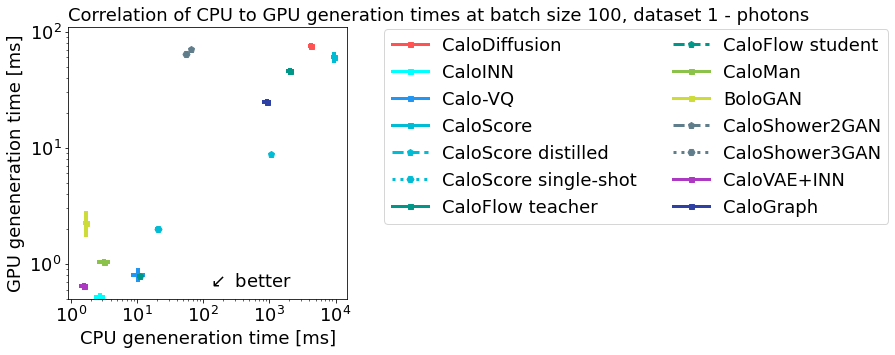

In [50]:
# CPU to GPU timing

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds1_photons['time CPU 100'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds1_photons['time CPU 100'].to_dict()[entry], ds1_photons['time CPU 100 std'].to_dict()[entry], ds1_photons['time GPU 100'].to_dict()[entry], ds1_photons['time GPU 100 std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.ylim([5e-1, 1.1e2])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('CPU geneneration time [ms]', fontsize=FS)
plt.ylabel('GPU geneneration time [ms]', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of CPU to GPU generation times at batch size 100, dataset 1 - photons", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(2.2e3, 7e-1, r"$\swarrow$ better", fontsize=FS, va='center', ha='right')

plt.savefig(f'results_fig/scatter/ds1_photons_time.pdf', dpi=300, bbox_inches='tight')
plt.show()


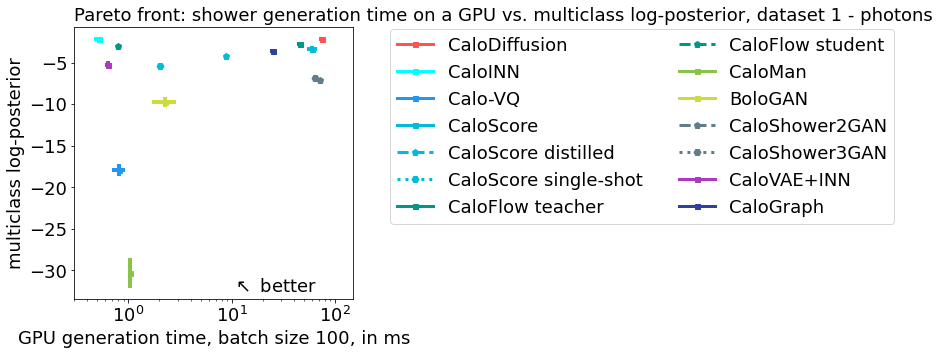

In [51]:
# Pareto front quality time

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds1_photons['time GPU 100'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds1_photons['time GPU 100'].to_dict()[entry], ds1_photons['time GPU 100 std'].to_dict()[entry], ds1_photons['multi cls'].to_dict()[entry], ds1_photons['multi cls std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([3e-1, 1.5e2])
plt.xscale('log')
plt.xlabel('GPU generation time, batch size 100, in ms', fontsize=FS)
plt.ylabel('multiclass log-posterior', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Pareto front: shower generation time on a GPU vs. multiclass log-posterior, dataset 1 - photons", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(1e1, -32, r"$\nwarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/pareto/ds1_photons_logpost_time.pdf', dpi=300, bbox_inches='tight')
plt.show()


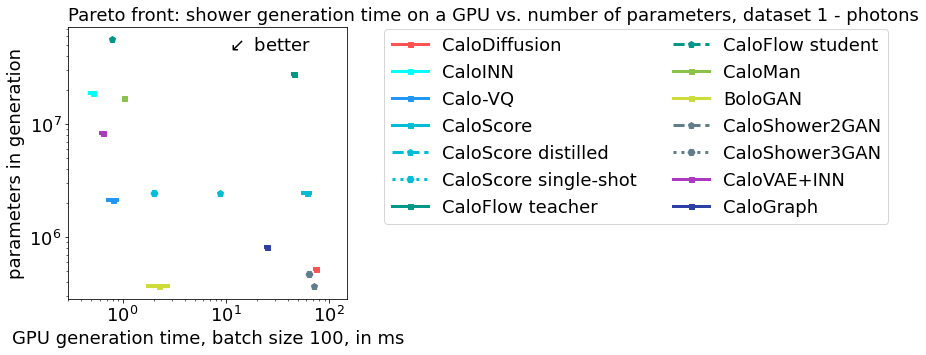

In [52]:
# Pareto front speed size

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds1_photons['time GPU 100'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds1_photons['time GPU 100'].to_dict()[entry], ds1_photons['time GPU 100 std'].to_dict()[entry], ds1_photons['Parameters generation'].to_dict()[entry], 0., id_dict[entry], kwargs_dict[entry])

plt.xlim([3e-1, 1.5e2])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('GPU generation time, batch size 100, in ms', fontsize=FS)
plt.ylabel('parameters in generation', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Pareto front: shower generation time on a GPU vs. number of parameters, dataset 1 - photons", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(1e1, 5e7, r"$\swarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/pareto/ds1_photons_numparam_time.pdf', dpi=300, bbox_inches='tight')
plt.show()


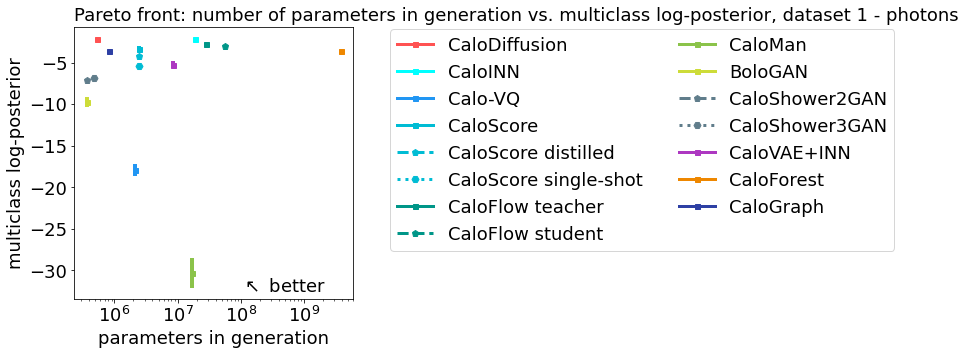

In [53]:
# Pareto front quality size

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds1_photons['Parameters generation'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds1_photons['Parameters generation'].to_dict()[entry], 0., ds1_photons['multi cls'].to_dict()[entry], ds1_photons['multi cls std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('log')
plt.xlabel('parameters in generation', fontsize=FS)
plt.ylabel('multiclass log-posterior', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Pareto front: number of parameters in generation vs. multiclass log-posterior, dataset 1 - photons", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(1e8, -32, r"$\nwarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/pareto/ds1_photons_logpost_numparam.pdf', dpi=300, bbox_inches='tight')
plt.show()


### dataset 1 - pions

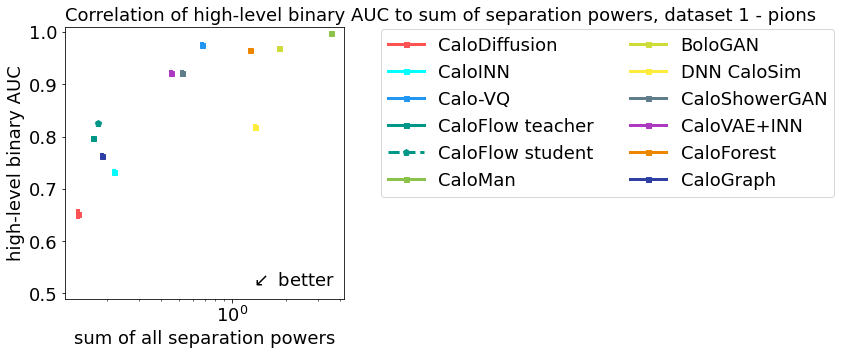

In [54]:
# high-level AUC to separation power

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds1_pions['sep E layer'].to_dict()):
    if entry == 0:
        continue
    sep_sum = get_sep_sum(ds1_pions, entry)
    plot_with_errors_2d(sep_sum, 0., ds1_pions['binary cls high'].to_dict()[entry], ds1_pions['binary cls high std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('log')
plt.xlabel('sum of all separation powers', fontsize=FS)
plt.ylabel('high-level binary AUC', fontsize=FS)
plt.ylim([0.49, 1.01])
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of high-level binary AUC to sum of separation powers, dataset 1 - pions", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(1.25e0, .525, r"$\swarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/scatter/ds1_pions_sep_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()


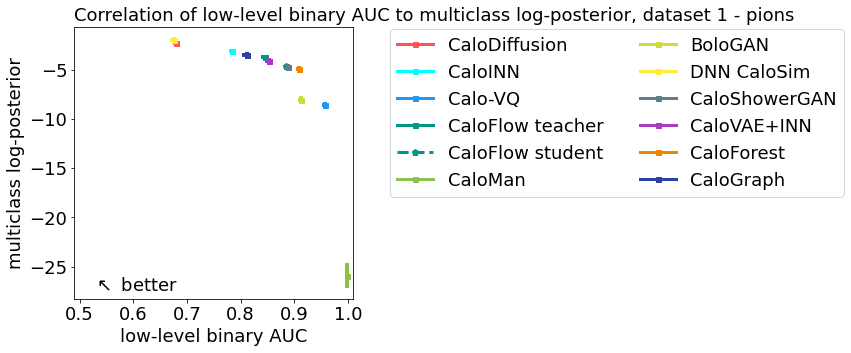

In [55]:
# low-level AUC to log posterior

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds1_pions['binary cls low'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds1_pions['binary cls low'].to_dict()[entry], ds1_pions['binary cls low std'].to_dict()[entry], ds1_pions['multi cls'].to_dict()[entry], ds1_pions['multi cls std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([0.49, 1.01])

plt.xlabel('low-level binary AUC', fontsize=FS)
plt.ylabel('multiclass log-posterior', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of low-level binary AUC to multiclass log-posterior, dataset 1 - pions", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(.525, -27, r"$\nwarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/scatter/ds1_pions_logpost_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()


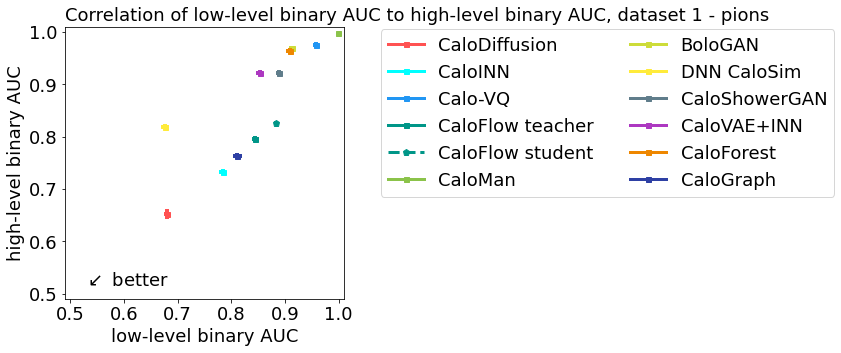

In [56]:
# low level AUC to high-level AUC

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds1_pions['binary cls low'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds1_pions['binary cls low'].to_dict()[entry], ds1_pions['binary cls low std'].to_dict()[entry], ds1_pions['binary cls high'].to_dict()[entry], ds1_pions['binary cls high std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([0.49, 1.01])
plt.ylim([0.49, 1.01])
plt.xlabel('low-level binary AUC', fontsize=FS)
plt.ylabel('high-level binary AUC', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of low-level binary AUC to high-level binary AUC, dataset 1 - pions", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(.525, .525, r"$\swarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/scatter/ds1_pions_AUC_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()

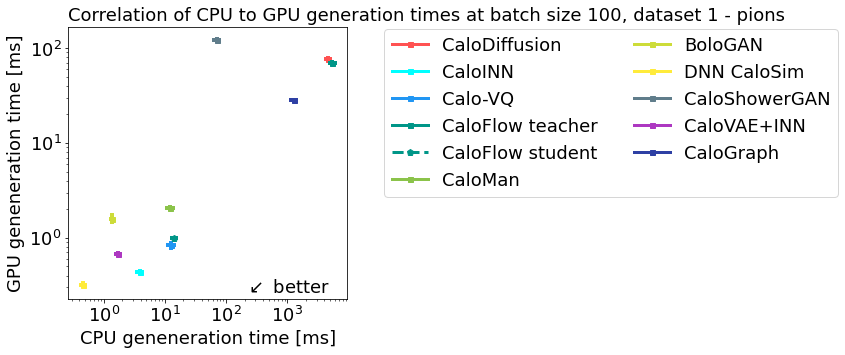

In [57]:
# CPU to GPU timing

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds1_pions['time CPU 100'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds1_pions['time CPU 100'].to_dict()[entry], ds1_pions['time CPU 100 std'].to_dict()[entry], ds1_pions['time GPU 100'].to_dict()[entry], ds1_pions['time GPU 100 std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('log')
plt.yscale('log')
plt.xlabel('CPU geneneration time [ms]', fontsize=FS)
plt.ylabel('GPU geneneration time [ms]', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of CPU to GPU generation times at batch size 100, dataset 1 - pions", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(2e2, 3e-1, r"$\swarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/scatter/ds1_pions_time.pdf', dpi=300, bbox_inches='tight')
plt.show()


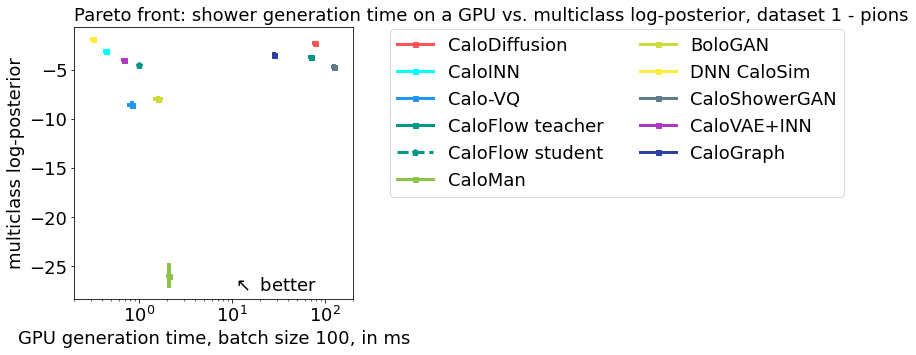

In [58]:
# Pareto front quality time

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds1_pions['time GPU 100'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds1_pions['time GPU 100'].to_dict()[entry], ds1_pions['time GPU 100 std'].to_dict()[entry], ds1_pions['multi cls'].to_dict()[entry], ds1_pions['multi cls std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([2e-1, 2e2])
plt.xscale('log')
plt.xlabel('GPU generation time, batch size 100, in ms', fontsize=FS)
plt.ylabel('multiclass log-posterior', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Pareto front: shower generation time on a GPU vs. multiclass log-posterior, dataset 1 - pions", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(1e1, -27, r"$\nwarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/pareto/ds1_pions_logpost_time.pdf', dpi=300, bbox_inches='tight')
plt.show()


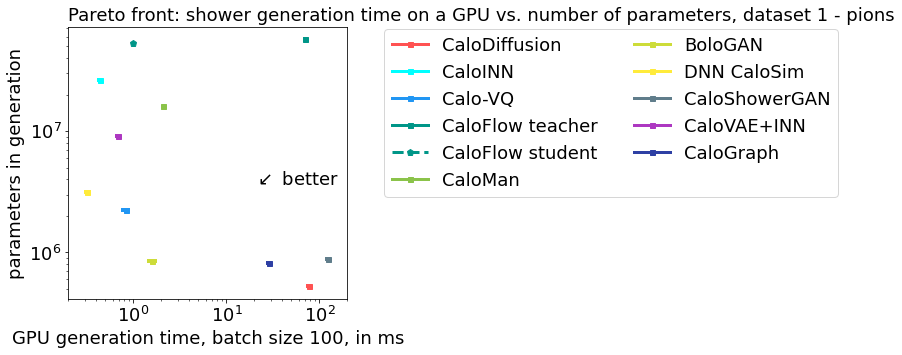

In [59]:
# Pareto front speed size

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds1_pions['time GPU 100'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds1_pions['time GPU 100'].to_dict()[entry], ds1_pions['time GPU 100 std'].to_dict()[entry], ds1_pions['Parameters generation'].to_dict()[entry], 0., id_dict[entry], kwargs_dict[entry])

plt.xlim([2e-1, 2e2])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('GPU generation time, batch size 100, in ms', fontsize=FS)
plt.ylabel('parameters in generation', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Pareto front: shower generation time on a GPU vs. number of parameters, dataset 1 - pions", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(2e1, 4e6, r"$\swarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/pareto/ds1_pions_numparam_time.pdf', dpi=300, bbox_inches='tight')
plt.show()


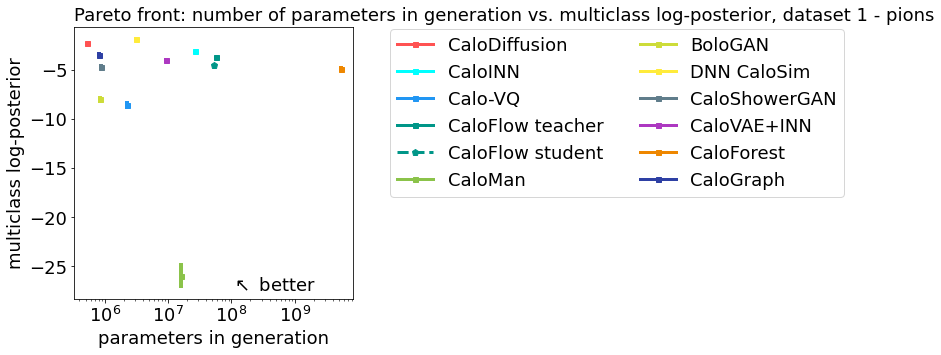

In [60]:
# Pareto front quality size

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds1_pions['Parameters generation'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds1_pions['Parameters generation'].to_dict()[entry], 0., ds1_pions['multi cls'].to_dict()[entry], ds1_pions['multi cls std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('log')
plt.xlabel('parameters in generation', fontsize=FS)
plt.ylabel('multiclass log-posterior', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Pareto front: number of parameters in generation vs. multiclass log-posterior, dataset 1 - pions", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(1e8, -27, r"$\nwarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/pareto/ds1_pions_logpost_numparam.pdf', dpi=300, bbox_inches='tight')
plt.show()


### dataset 2

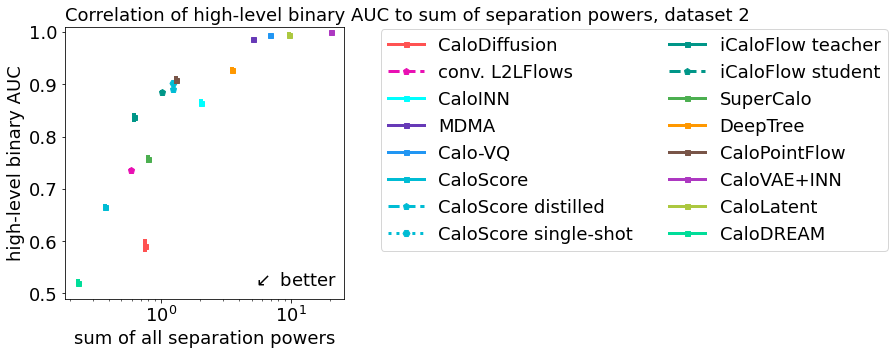

In [61]:
# high-level AUC to separation power

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds2['sep E layer'].to_dict()):
    if entry == 0:
        continue
    sep_sum = get_sep_sum(ds2, entry)
    plot_with_errors_2d(sep_sum, 0., ds2['binary cls high'].to_dict()[entry], ds2['binary cls high std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('log')
plt.xlabel('sum of all separation powers', fontsize=FS)
plt.ylabel('high-level binary AUC', fontsize=FS)
plt.ylim([0.49, 1.01])
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of high-level binary AUC to sum of separation powers, dataset 2", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(5e0, .525, r"$\swarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/scatter/ds2_sep_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()


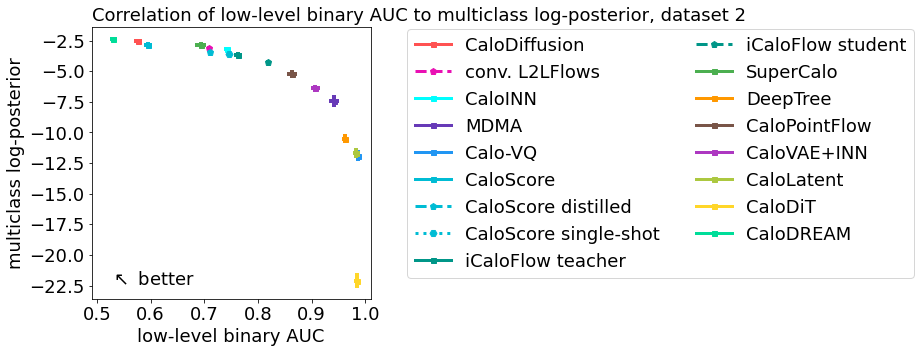

In [62]:
# low-level AUC to log posterior

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds2['binary cls low'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds2['binary cls low'].to_dict()[entry], ds2['binary cls low std'].to_dict()[entry], ds2['multi cls'].to_dict()[entry], ds2['multi cls std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([0.49, 1.01])

plt.xlabel('low-level binary AUC', fontsize=FS)
plt.ylabel('multiclass log-posterior', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of low-level binary AUC to multiclass log-posterior, dataset 2", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(.525, -22, r"$\nwarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/scatter/ds2_logpost_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()


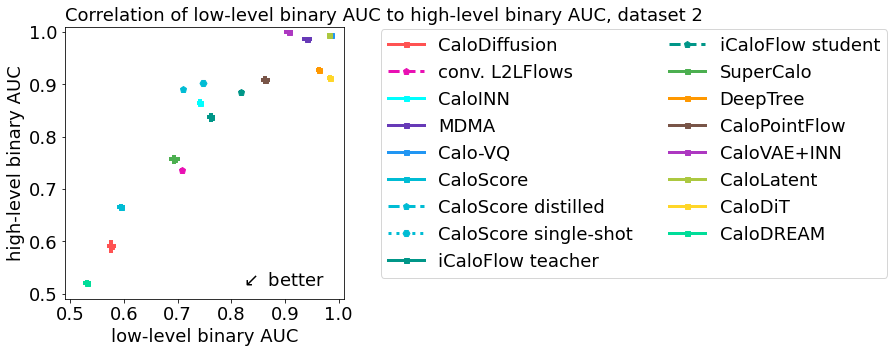

In [63]:
# low level AUC to high-level AUC

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds2['binary cls low'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds2['binary cls low'].to_dict()[entry], ds2['binary cls low std'].to_dict()[entry], ds2['binary cls high'].to_dict()[entry], ds2['binary cls high std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([0.49, 1.01])
plt.ylim([0.49, 1.01])
plt.xlabel('low-level binary AUC', fontsize=FS)
plt.ylabel('high-level binary AUC', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of low-level binary AUC to high-level binary AUC, dataset 2", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(.975, .525, r"$\swarrow$ better", fontsize=FS, va='center', ha='right')

plt.savefig(f'results_fig/scatter/ds2_AUC_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()


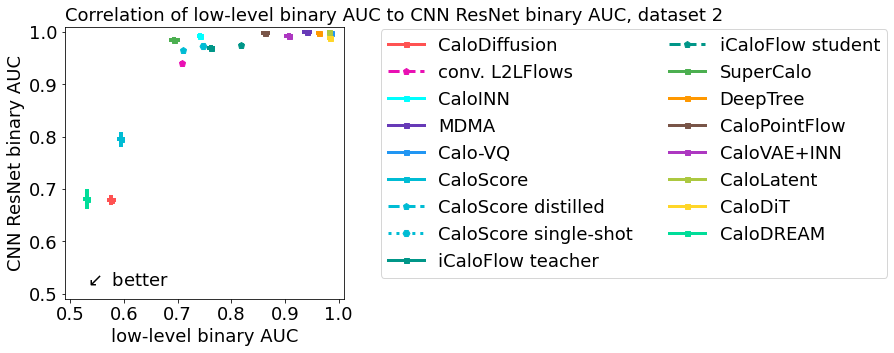

In [64]:
# low level AUC to CNN ResNet AUC

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds2['binary cls low'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds2['binary cls low'].to_dict()[entry], ds2['binary cls low std'].to_dict()[entry], ds2['binary cls cnn'].to_dict()[entry], ds2['binary cls cnn std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([0.49, 1.01])
plt.ylim([0.49, 1.01])
plt.xlabel('low-level binary AUC', fontsize=FS)
plt.ylabel('CNN ResNet binary AUC', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of low-level binary AUC to CNN ResNet binary AUC, dataset 2", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(.525, .525, r"$\swarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/scatter/ds2_CNN_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()


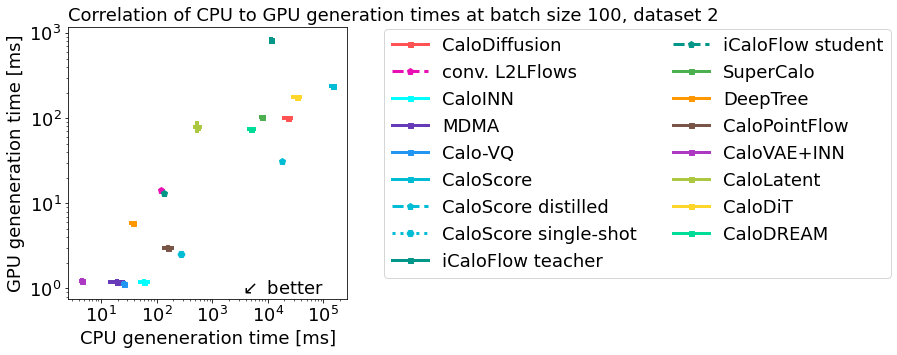

In [65]:
# CPU to GPU timing

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds2['time CPU 100'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds2['time CPU 100'].to_dict()[entry], ds2['time CPU 100 std'].to_dict()[entry], ds2['time GPU 100'].to_dict()[entry], ds2['time GPU 100 std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('log')
plt.yscale('log')
plt.xlabel('CPU geneneration time [ms]', fontsize=FS)
plt.ylabel('GPU geneneration time [ms]', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of CPU to GPU generation times at batch size 100, dataset 2", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(3e3, 1e0, r"$\swarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/scatter/ds2_time.pdf', dpi=300, bbox_inches='tight')
plt.show()


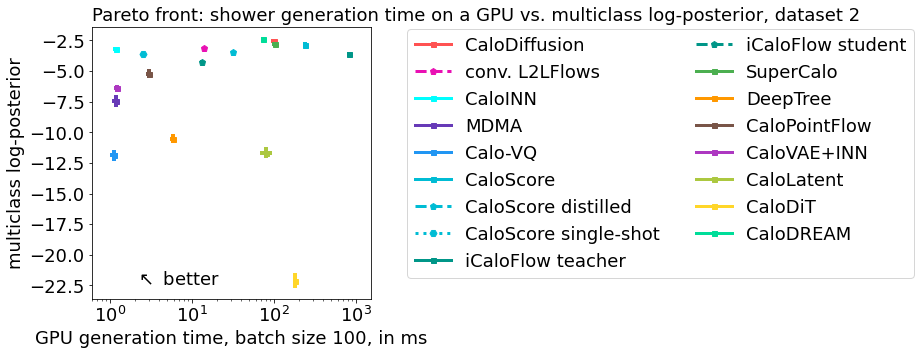

In [66]:
# Pareto front quality time

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds2['time GPU 100'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds2['time GPU 100'].to_dict()[entry], ds2['time GPU 100 std'].to_dict()[entry], ds2['multi cls'].to_dict()[entry], ds2['multi cls std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([6e-1, 1.5e3])
plt.xscale('log')
plt.xlabel('GPU generation time, batch size 100, in ms', fontsize=FS)
plt.ylabel('multiclass log-posterior', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Pareto front: shower generation time on a GPU vs. multiclass log-posterior, dataset 2", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(2e0, -22, r"$\nwarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/pareto/ds2_logpost_time.pdf', dpi=300, bbox_inches='tight')
plt.show()


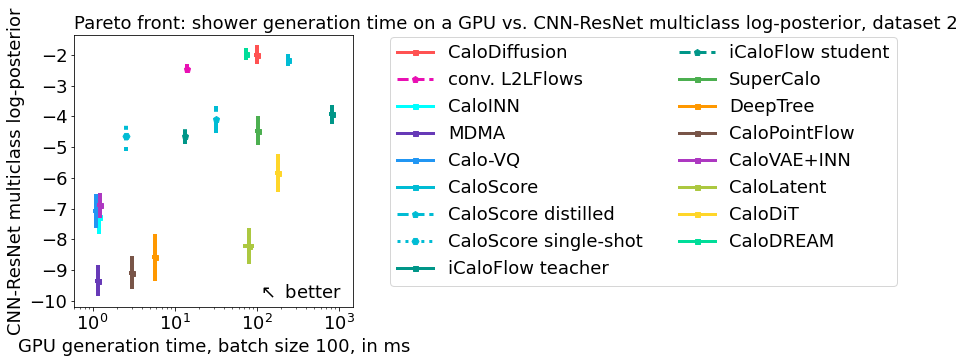

In [67]:
# Pareto front CNN quality time

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds2['time GPU 100'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds2['time GPU 100'].to_dict()[entry], ds2['time GPU 100 std'].to_dict()[entry], ds2['multi cls cnn'].to_dict()[entry], ds2['multi cls cnn std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([6e-1, 1.5e3])
plt.xscale('log')
plt.xlabel('GPU generation time, batch size 100, in ms', fontsize=FS)
plt.ylabel('CNN-ResNet multiclass log-posterior', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Pareto front: shower generation time on a GPU vs. CNN-ResNet multiclass log-posterior, dataset 2", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(1e2, -9.75, r"$\nwarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/pareto/ds2_CNN_logpost_time.pdf', dpi=300, bbox_inches='tight')
plt.show()


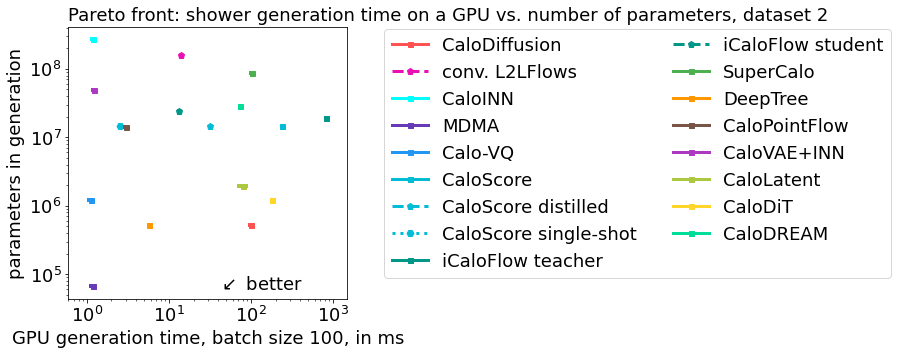

In [68]:
# Pareto front speed size

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds2['time GPU 100'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds2['time GPU 100'].to_dict()[entry], ds2['time GPU 100 std'].to_dict()[entry], ds2['Parameters generation'].to_dict()[entry], 0., id_dict[entry], kwargs_dict[entry])

plt.xlim([6e-1, 1.5e3])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('GPU generation time, batch size 100, in ms', fontsize=FS)
plt.ylabel('parameters in generation', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Pareto front: shower generation time on a GPU vs. number of parameters, dataset 2", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(4e1, 7e4, r"$\swarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/pareto/ds2_numparam_time.pdf', dpi=300, bbox_inches='tight')
plt.show()


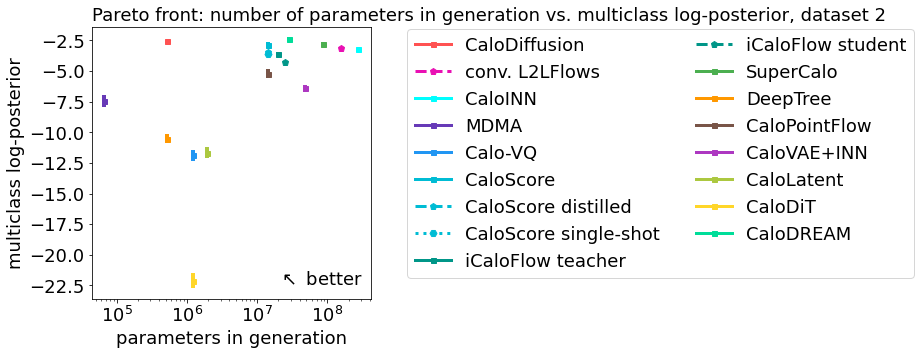

In [69]:
# Pareto front quality size

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds2['Parameters generation'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds2['Parameters generation'].to_dict()[entry], 0., ds2['multi cls'].to_dict()[entry], ds2['multi cls std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('log')
plt.xlabel('parameters in generation', fontsize=FS)
plt.ylabel('multiclass log-posterior', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Pareto front: number of parameters in generation vs. multiclass log-posterior, dataset 2", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(2e7, -22, r"$\nwarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/pareto/ds2_logpost_numparam.pdf', dpi=300, bbox_inches='tight')
plt.show()


### dataset 3

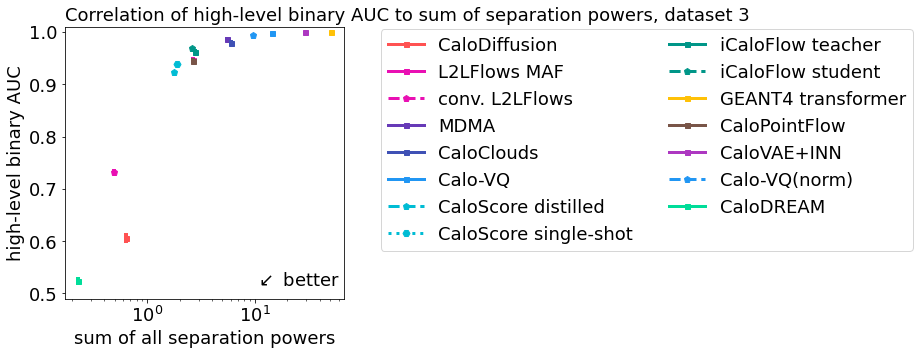

In [70]:
# high-level AUC to separation power

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds3['sep E layer'].to_dict()):
    if entry == 0:
        continue
    sep_sum = get_sep_sum(ds3, entry)
    plot_with_errors_2d(sep_sum, 0., ds3['binary cls high'].to_dict()[entry], ds3['binary cls high std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('log')
plt.xlabel('sum of all separation powers', fontsize=FS)
plt.ylabel('high-level binary AUC', fontsize=FS)
plt.ylim([0.49, 1.01])
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of high-level binary AUC to sum of separation powers, dataset 3", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(1e1, .525, r"$\swarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/scatter/ds3_sep_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()


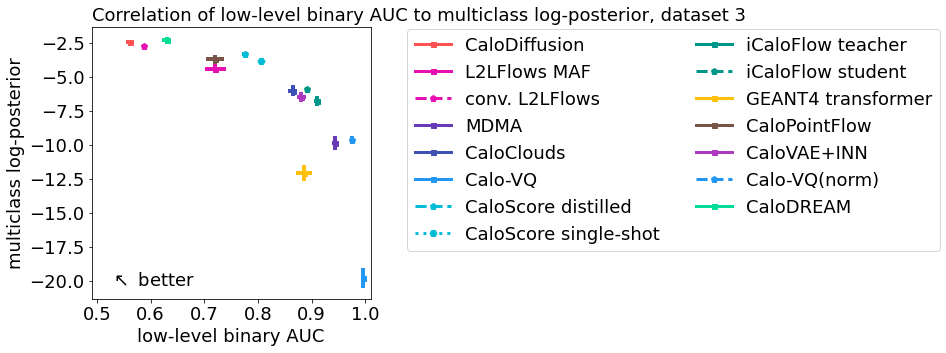

In [71]:
# low-level AUC to log posterior

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds3['binary cls low'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds3['binary cls low'].to_dict()[entry], ds3['binary cls low std'].to_dict()[entry], ds3['multi cls'].to_dict()[entry], ds3['multi cls std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([0.49, 1.01])

plt.xlabel('low-level binary AUC', fontsize=FS)
plt.ylabel('multiclass log-posterior', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of low-level binary AUC to multiclass log-posterior, dataset 3", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(.525, -20, r"$\nwarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/scatter/ds3_logpost_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()


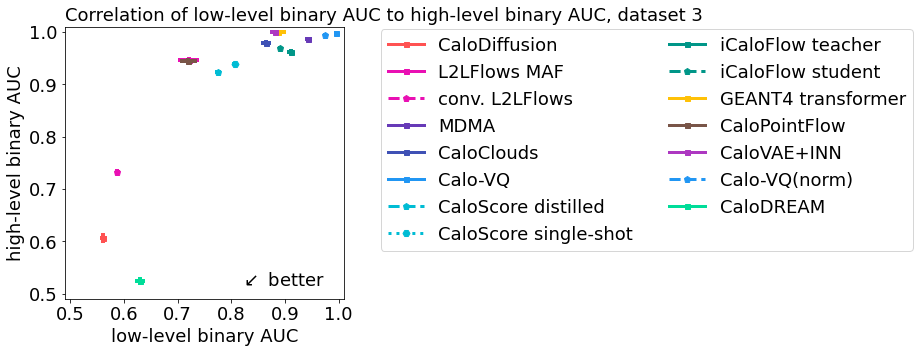

In [72]:
# low level AUC to high-level AUC

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds3['binary cls low'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds3['binary cls low'].to_dict()[entry], ds3['binary cls low std'].to_dict()[entry], ds3['binary cls high'].to_dict()[entry], ds3['binary cls high std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([0.49, 1.01])
plt.ylim([0.49, 1.01])
plt.xlabel('low-level binary AUC', fontsize=FS)
plt.ylabel('high-level binary AUC', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of low-level binary AUC to high-level binary AUC, dataset 3", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(.975, .525, r"$\swarrow$ better", fontsize=FS, va='center', ha='right')

plt.savefig(f'results_fig/scatter/ds3_AUC_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()


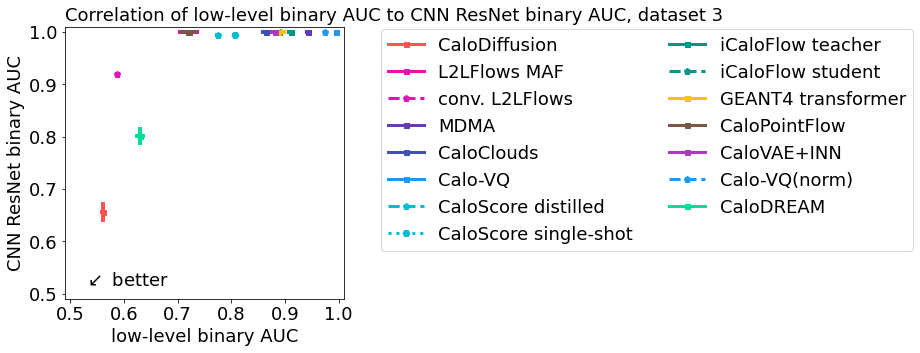

In [73]:
# low level AUC to CNN ResNet AUC

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds3['binary cls low'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds3['binary cls low'].to_dict()[entry], ds3['binary cls low std'].to_dict()[entry], ds3['binary cls cnn'].to_dict()[entry], ds3['binary cls cnn std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xlim([0.49, 1.01])
plt.ylim([0.49, 1.01])
plt.xlabel('low-level binary AUC', fontsize=FS)
plt.ylabel('CNN ResNet binary AUC', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of low-level binary AUC to CNN ResNet binary AUC, dataset 3", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(.525, .525, r"$\swarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/scatter/ds3_CNN_AUC.pdf', dpi=300, bbox_inches='tight')
plt.show()


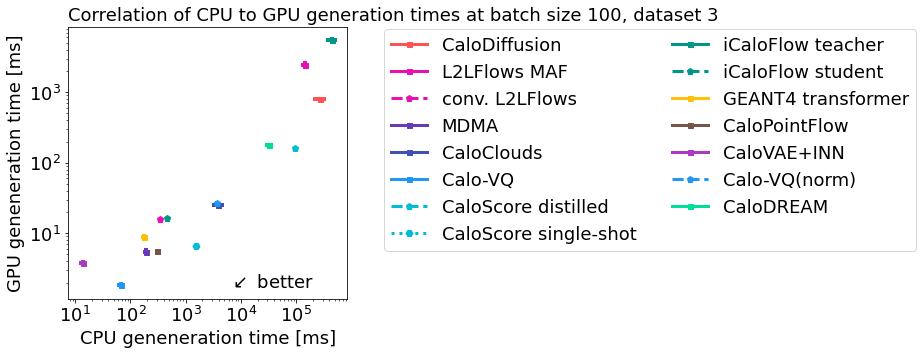

In [74]:
# CPU to GPU timing

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds3['time CPU 100'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds3['time CPU 100'].to_dict()[entry], ds3['time CPU 100 std'].to_dict()[entry], ds3['time GPU 100'].to_dict()[entry], ds3['time GPU 100 std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('log')
plt.yscale('log')
plt.xlabel('CPU geneneration time [ms]', fontsize=FS)
plt.ylabel('GPU geneneration time [ms]', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Correlation of CPU to GPU generation times at batch size 100, dataset 3", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(6e3, 2e0, r"$\swarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/scatter/ds3_time.pdf', dpi=300, bbox_inches='tight')
plt.show()


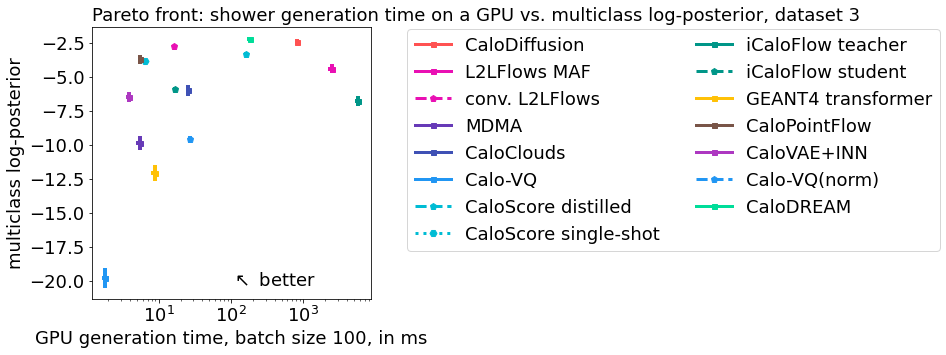

In [75]:
# Pareto front quality time

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds3['time GPU 100'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds3['time GPU 100'].to_dict()[entry], ds3['time GPU 100 std'].to_dict()[entry], ds3['multi cls'].to_dict()[entry], ds3['multi cls std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

#plt.xlim([6e-1, 1.5e3])
plt.xscale('log')
plt.xlabel('GPU generation time, batch size 100, in ms', fontsize=FS)
plt.ylabel('multiclass log-posterior', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Pareto front: shower generation time on a GPU vs. multiclass log-posterior, dataset 3", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(1e2, -20, r"$\nwarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/pareto/ds3_logpost_time.pdf', dpi=300, bbox_inches='tight')
plt.show()


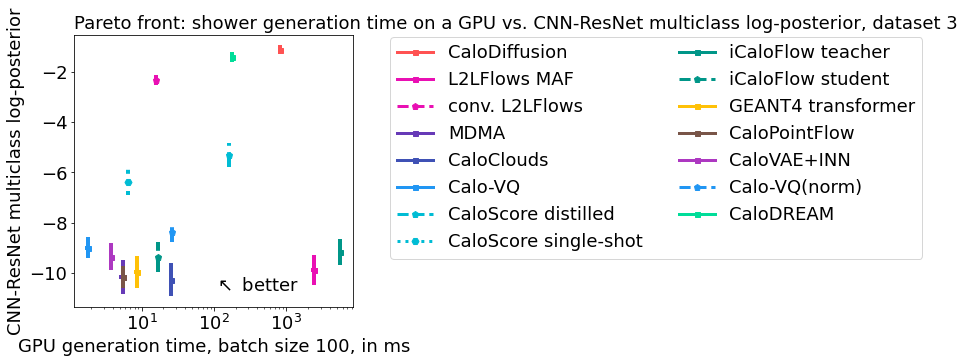

In [76]:
# Pareto front CNN quality time

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds3['time GPU 100'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds3['time GPU 100'].to_dict()[entry], ds3['time GPU 100 std'].to_dict()[entry], ds3['multi cls cnn'].to_dict()[entry], ds3['multi cls cnn std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

#plt.xlim([6e-1, 1.5e3])
plt.xscale('log')
plt.xlabel('GPU generation time, batch size 100, in ms', fontsize=FS)
plt.ylabel('CNN-ResNet multiclass log-posterior', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Pareto front: shower generation time on a GPU vs. CNN-ResNet multiclass log-posterior, dataset 3", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(1e2, -10.5, r"$\nwarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/pareto/ds3_CNN_logpost_time.pdf', dpi=300, bbox_inches='tight')
plt.show()


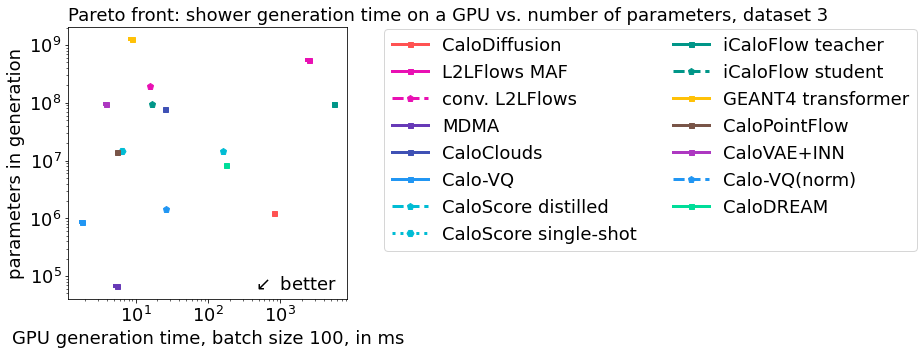

In [77]:
# Pareto front speed size

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds3['time GPU 100'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds3['time GPU 100'].to_dict()[entry], ds3['time GPU 100 std'].to_dict()[entry], ds3['Parameters generation'].to_dict()[entry], 0., id_dict[entry], kwargs_dict[entry])

plt.xscale('log')
plt.yscale('log')
plt.xlabel('GPU generation time, batch size 100, in ms', fontsize=FS)
plt.ylabel('parameters in generation', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Pareto front: shower generation time on a GPU vs. number of parameters, dataset 3", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(4e2, 7e4, r"$\swarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/pareto/ds3_numparam_time.pdf', dpi=300, bbox_inches='tight')
plt.show()


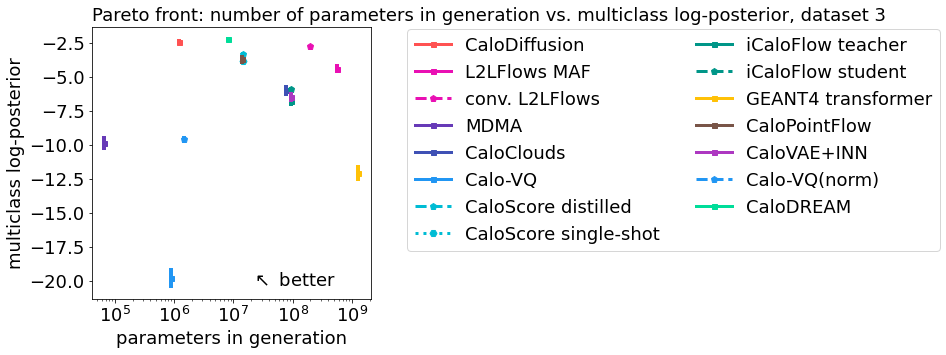

In [78]:
# Pareto front quality size

plt.figure(figsize=(5,5), facecolor='white')

for run_id, entry in enumerate(ds3['Parameters generation'].to_dict()):
    if entry == 0:
        continue
    plot_with_errors_2d(ds3['Parameters generation'].to_dict()[entry], 0., ds3['multi cls'].to_dict()[entry], ds3['multi cls std'].to_dict()[entry], id_dict[entry], kwargs_dict[entry])

plt.xscale('log')
plt.xlabel('parameters in generation', fontsize=FS)
plt.ylabel('multiclass log-posterior', fontsize=FS)
plt.legend(bbox_to_anchor=(1.1, 1.025), fontsize=FS, ncol=2)
plt.title(f"Pareto front: number of parameters in generation vs. multiclass log-posterior, dataset 3", fontsize=FS, loc='left')
plt.xticks(fontsize=FS)
plt.yticks(fontsize=FS)
plt.text(2e7, -20, r"$\nwarrow$ better", fontsize=FS, va='center')

plt.savefig(f'results_fig/pareto/ds3_logpost_numparam.pdf', dpi=300, bbox_inches='tight')
plt.show()
